# **Vehicle Plate Detection Using CNN**


---



In [ ]:
import pandas as pd
import numpy as np
import cv2
import imutils
from matplotlib import pyplot as plt
import tensorflow as tf
from tensorflow import keras
import glob
import os
from sklearn import preprocessing
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Big Data Challenge/Data Train for BDC 2023 - Penyisihan/DataTrain.csv', sep = ';',index_col = 0)
data.head()

,Vehicleregistrationplate,NameofFile
0,A7814,DataTrain1.png
1,B1074QO,DataTrain2.png
2,B1031QO,DataTrain3.png
3,B187EDA,DataTrain4.png
4,B1089VD,DataTrain5.png


In [ ]:
data_test = pd.read_csv('/content/drive/MyDrive/Big Data Challenge/Data Test for BDC 2023 - Penyisihan/DataTest.csv', sep = ';',index_col = 0)
data_test.head()

,Name of File
0,DataTest1.png
1,DataTest2.png
2,DataTest3.png
3,DataTest4.png
4,DataTest5.png


In [ ]:
submission = pd.read_csv('/content/drive/MyDrive/Big Data Challenge/submission.csv', sep = ',',index_col = 0)
submission.head()

,Name of File,Vehicleregistrationplatebymodel
0,DataTest1.png,NaN
1,DataTest2.png,NaN
2,DataTest3.png,NaN
3,DataTest4.png,NaN
4,DataTest5.png,NaN


# Plate Detection

In [ ]:
def find_plate(image):
    image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    adaptive_result = cv2.adaptiveThreshold(image_gray,255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                        cv2.THRESH_BINARY, 101, 1)
    kernel = np.ones((3,3),np.uint8)
    img_morphed = cv2.morphologyEx(adaptive_result, cv2.MORPH_OPEN, kernel)
    img_filtered = cv2.bilateralFilter(adaptive_result, 11, 17, 17)
    img_filtered[0:3,:] = 0
    img_filtered[:,0:3] = 0
    img_filtered[img_filtered.shape[0]-3:img_filtered.shape[0],:] = 0
    img_filtered[:,img_filtered.shape[1]-3:img_filtered.shape[1]] = 0
    blur = cv2.GaussianBlur(img_filtered,(5,5),0)
    #img_edged = cv2.Canny(blur, 190, 200)
    img_edged = cv2.Canny(blur,  threshold1 = 30,  threshold2 = 100, apertureSize = 3, L2gradient = True)
    edged_contours = cv2.findContours(img_filtered.copy(),cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(edged_contours)
    temp_result = np.zeros(img_edged.shape, np.uint8)
    #cv2.drawContours(temp_result, contours=contours, contourIdx=-1, color=(255, 255, 255))
    contours = sorted(contours, key=cv2.contourArea, reverse = True)[:1]
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(temp_result, pt1=(x, y), pt2=(x+w, y+h), color=(255, 255, 255), thickness=2)

    point = None
    cropped_image = image
    for ctr in contours:
        contour_perimeter = cv2.arcLength(ctr, True)
        approx = cv2.approxPolyDP(ctr, 0.018 * contour_perimeter, True)
        if len(approx) == 4 and h > image_gray.shape[0]/2 and h>image_gray.shape[1]/7:
            point = approx
            mask = np.zeros(img_edged.shape, np.uint8)
            img_plate = cv2.drawContours(mask, [point], 0,255,-1)
            img_plate = cv2.bitwise_and(image, image, mask= mask)
            (x,y) = np.where(mask==255)
            (x1,y1) = (np.min(x), np.min(y))
            (x2,y2) = (np.max(x), np.max(y))
            cropped_image = image[x1:x2+1,y1:y2+1]
            break

    #plt.imshow(img_edged,cmap = 'gray')
    #plt.show()
    return cropped_image

In [ ]:
import numpy as np
import math
import cv2

def rotate_image(image, angle):
    image_center = tuple(np.array(image.shape[1::-1]) / 2)
    rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
    result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
    return result

def compute_skew(src_img):

    if len(src_img.shape) == 3:
        h, w, _ = src_img.shape
    elif len(src_img.shape) == 2:
        h, w = src_img.shape
    else:
        print('upsupported image type')

    img = cv2.medianBlur(src_img, 3)
    image_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    adaptive_result = cv2.adaptiveThreshold(image_gray,255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                        cv2.THRESH_BINARY, 101, 1)
    edges = cv2.Canny(adaptive_result,  threshold1 = 30,  threshold2 = 100, apertureSize = 3, L2gradient = True)
    lines = cv2.HoughLinesP(edges, 1, math.pi/180, 30, minLineLength=w / 4.0, maxLineGap=h/4.0)
    angle = 0.0

    if type(lines) != type(None):
        #print(nlines)
        cnt = 0
        for x1, y1, x2, y2 in lines[0]:
            ang = np.arctan2(y2 - y1, x2 - x1)
            #print(ang)
            if math.fabs(ang) <= 30: # excluding extreme rotations
                angle += ang
                cnt += 1

        if cnt == 0:
            return 0.0
        return (angle / cnt)*180/math.pi

    else: return 0.0

def deskew(src_img):
    return rotate_image(src_img, compute_skew(src_img))

<function matplotlib.pyplot.show(close=None, block=None)>

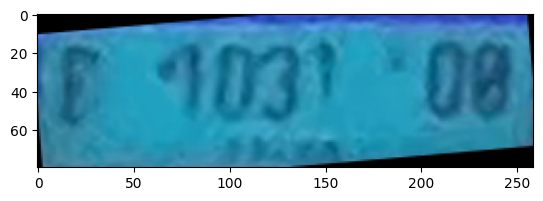

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Train for BDC 2023 - Penyisihan/'+data.NameofFile[2])
cropped = find_plate(img)
corrected = deskew(cropped)
plt.imshow(corrected)
plt.show

# Character Recognition

In [ ]:
def find_contours(dimensions, img) :

    # Find all contours in the image
    cntrs, _ = cv2.findContours(img.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Retrieve potential dimensions
    lower_width = dimensions[0]
    upper_width = dimensions[1]
    lower_height = dimensions[2]
    upper_height = dimensions[3]


    # Check largest 5 or  15 contours for license plate or character respectively
    cntrs = sorted(cntrs, key=cv2.contourArea, reverse=True)[:15]

    ii = cv2.imread('/content/drive/MyDrive/Big Data Challenge/contour.jpg')

    x_cntr_list = []
    target_contours = []
    img_res = []
    for cntr in cntrs :
        #detects contour in binary image and returns the coordinates of rectangle enclosing it
        intX, intY, intWidth, intHeight = cv2.boundingRect(cntr)

        #50,21,200
        #checking the dimensions of the contour to filter out the characters by contour's size
        if intWidth > lower_width and intWidth < upper_width and intHeight > lower_height and intHeight < upper_height and intWidth*intHeight < 5750 and intWidth*intHeight > 900 and intWidth < intHeight:
            x_cntr_list.append(intX) #stores the x coordinate of the character's contour, to used later for indexing the contours
            char_copy = np.zeros((44,24))
            #extracting each character using the enclosing rectangle's coordinates.
            char = img[intY:intY+intHeight, intX:intX+intWidth]
            char = cv2.resize(char, (20, 40))
            w_pixel = np.count_nonzero(char == 255)
            b_pixel = np.count_nonzero(char == 0)
            if w_pixel > 11*b_pixel/20 and b_pixel/w_pixel > 0.1:
                # Make result formatted for classification: invert colors
                char = cv2.subtract(255, char)

                # Resize the image to 24x44 with black border
                char_copy[2:42, 2:22] = char
                char_copy[0:2, :] = 0
                char_copy[:, 0:2] = 0
                char_copy[42:44, :] = 0
                char_copy[:, 22:24] = 0

                img_res.append(char_copy) #List that stores the character's binary image (unsorted)
                cv2.rectangle(ii, (intX,intY), (intWidth+intX, intY+intHeight), (50,205,50), 2)
                plt.imshow(ii, cmap='gray')

            else:
                x_cntr_list.pop(-1)

    #Return characters on ascending order with respect to the x-coordinate (most-left character first)
    plt.show()
    #arbitrary function that stores sorted list of character indeces
    indices = sorted(range(len(x_cntr_list)), key=lambda k: x_cntr_list[k])
    img_res_copy = []
    for idx in indices:
        img_res_copy.append(img_res[idx])# stores character images according to their index
    img_res = np.array(img_res_copy)

    return img_res

In [ ]:
def characters_recognition(img) :
    img = find_plate(img)
    img = deskew(img)
    img = cv2.resize(img,(400,200))

    sharp = np.array([[-1,-1,-1],
                      [-1,9,-1],
                      [-1,-1,-1]])
    blur = cv2.GaussianBlur(img, (7,7),2)
    img_sharp = cv2.filter2D(img, -1, sharp)
    img_sharp2 = cv2.addWeighted(img, 7.5,blur,-6.5,0)

    img_gray = cv2.cvtColor(img_sharp, cv2.COLOR_RGB2GRAY)

    img_denoise = cv2.fastNlMeansDenoising(img_gray, None, 20, 7, 21)
    #blur = cv2.GaussianBlur(img_gray, (0,0), sigmaX=33, sigmaY=33)
    #divide = cv2.divide(img_gray, blur, scale=255)
    thresh = cv2.threshold(img_denoise, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
    #adaptive_result = cv2.adaptiveThreshold(img_denoise,255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                        #cv2.THRESH_BINARY, 101, 50)
    #rows,cols = thresh.shape
    #horizontalsize = int(cols // 60)
    #horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (horizontalsize,1))
    #verticalsize = int(rows // 20)
    #vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1,verticalsize))

    horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25,1))
    detected_lines = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, horizontal_kernel, iterations=2)
    cnts = cv2.findContours(detected_lines, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    for c in cnts:
        cv2.drawContours(thresh, [c], -1, (0,0,0), 2)

    repair_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1,6))
    result = 0 - cv2.morphologyEx(0 - thresh, cv2.MORPH_CLOSE, repair_kernel, iterations=1)

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    #img_erode = cv2.erode(adaptive_result, kernel)
    #img_morphed = cv2.erode(thresh, kernel)
    #img_morphed = cv2.dilate(thresh, kernel)
    img_morphed = cv2.morphologyEx(result, cv2.MORPH_OPEN, kernel)

    w_pixel = np.count_nonzero(img_morphed == 255)
    b_pixel = np.count_nonzero(img_morphed == 0)
    if (w_pixel > b_pixel):
        img_morphed = cv2.subtract(255, img_morphed)
    #img_morphed = cv2.morphologyEx(img_morphed, cv2.MORPH_OPEN, vertical_kernel)
    #img_morphed = cv2.divide(img_gray, img_morphed, scale=255)
    #img_morphed = cv2.threshold(img_morphed, 0, 255, cv2.THRESH_OTSU )[1]
    #kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    #img_morphed = cv2.morphologyEx(img_morphed, cv2.MORPH_CLOSE, kernel)
    #img_morphed = cv2.erode(img_morphed, horizontal_kernel)
    #img_morphed = cv2.erode(img_morphed, vertical_kernel)
    img_morphed[0:3,:] = 0
    img_morphed[:,0:3] = 0
    img_morphed[197:200,:] = 0
    img_morphed[:,397:400] = 0

    _, labels = cv2.connectedComponents(img_morphed)
    img_final = np.zeros(img_morphed.shape, dtype="uint8")

    total_pixels = img_morphed.shape[0] * img_morphed.shape[1]
    lower = total_pixels // 150 # heuristic param, can be fine tuned if necessary
    upper = total_pixels // 20 # heuristic param, can be fine tuned if necessary

    for (i, label) in enumerate(np.unique(labels)):
        # If this is the background label, ignore it
        if label == 0:
            continue

        # Otherwise, construct the label mask to display only connected component
        # for the current label
        labelMask = np.zeros(img_morphed.shape, dtype="uint8")
        labelMask[labels == label] = 255
        numPixels = cv2.countNonZero(labelMask)

        # If the number of pixels in the component is between lower bound and upper bound,
        # add it to our mask
        if numPixels > lower and numPixels < upper:
            img_final = cv2.add(img_final, labelMask)

    PLATE_WIDTH = img_morphed.shape[0]
    PLATE_HEIGHT = img_morphed.shape[1]
    dimensions = [PLATE_WIDTH/20, PLATE_WIDTH/2, PLATE_HEIGHT/9, 2*PLATE_HEIGHT/3]

    plt.imshow(img_morphed, cmap='gray')
    plt.show()
    cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/contour.jpg',img_final)

    characters = find_contours(dimensions, img_final)
    return characters

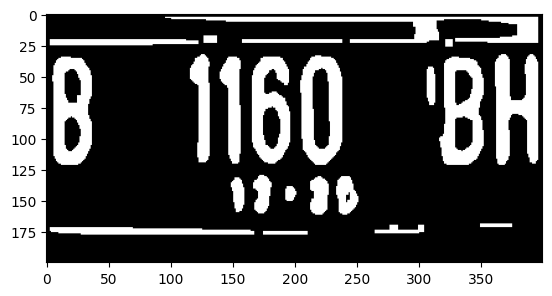

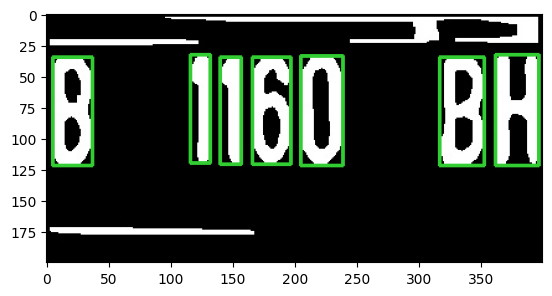

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Train for BDC 2023 - Penyisihan/'+data.NameofFile[10])
char = characters_recognition(img)

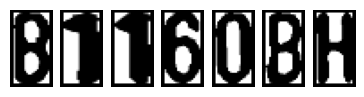

In [ ]:
for i in range(len(data.Vehicleregistrationplate[10])):
    plt.subplot(1, 10, i+1)
    plt.imshow(char[i], cmap='gray')
    plt.axis('off')

In [ ]:
count = 0
total = 0
perfect = []
for i in range (800):
    total += 1
    img = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Train for BDC 2023 - Penyisihan/'+data.NameofFile[i])
    char = characters_recognition(img)
    if char.shape[0] == len(data.Vehicleregistrationplate[i]):
        perfect.append(total-1)
        count += 1

In [ ]:
count

144

4
B1089VD


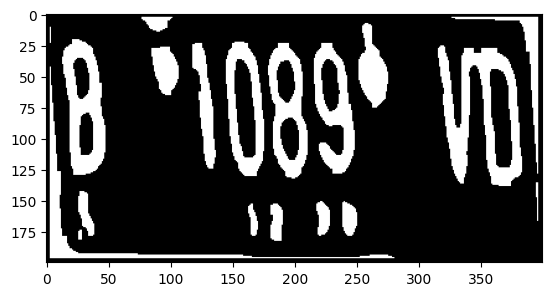

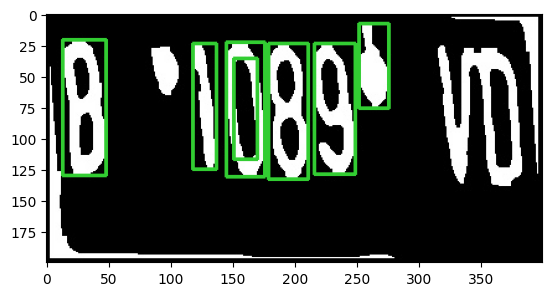

5
B1972RBP


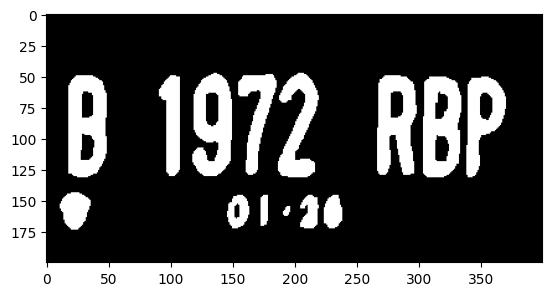

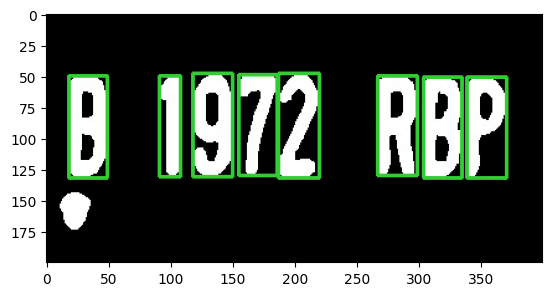

10
B1160BH


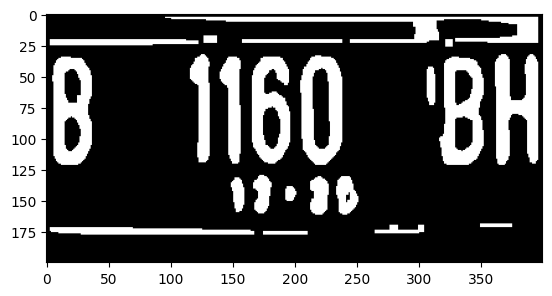

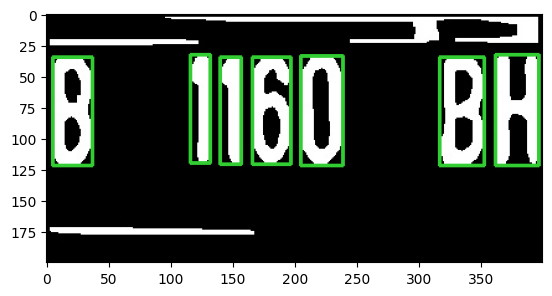

12
B173PUT


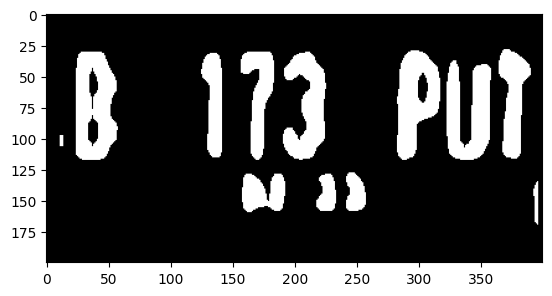

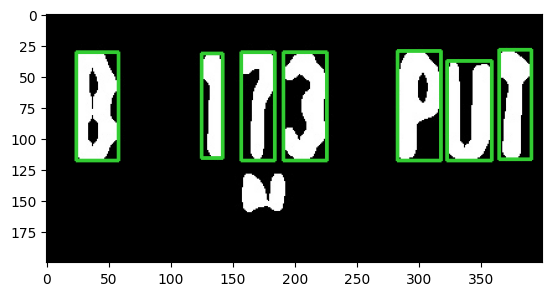

28
B1684BJN


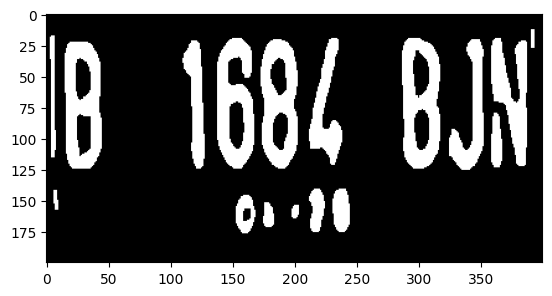

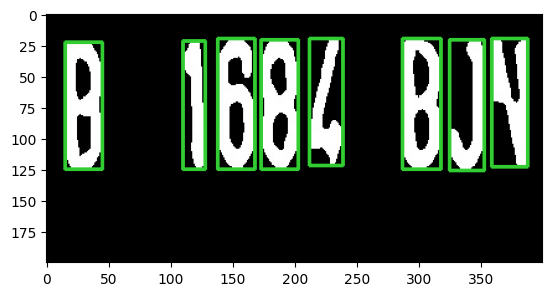

35
B1144ERW


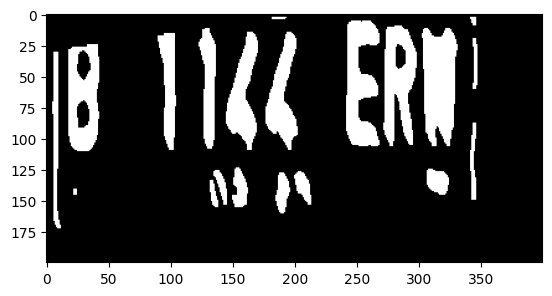

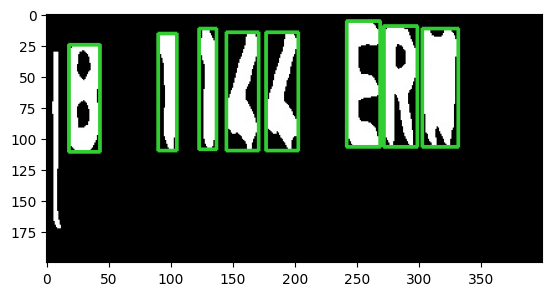

36
B1732PJH


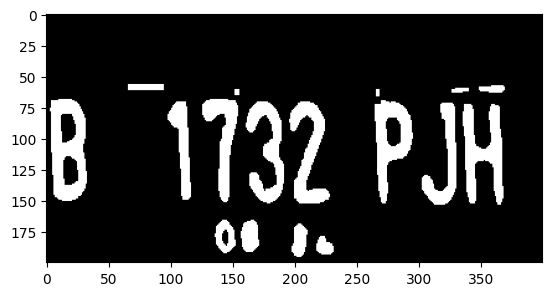

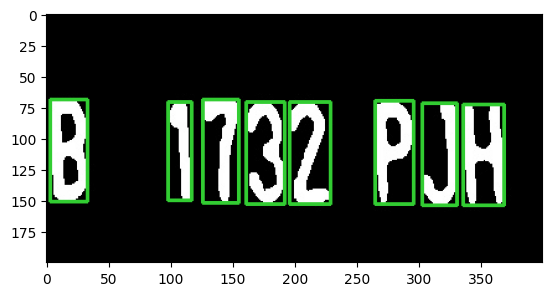

40
B1691TMU


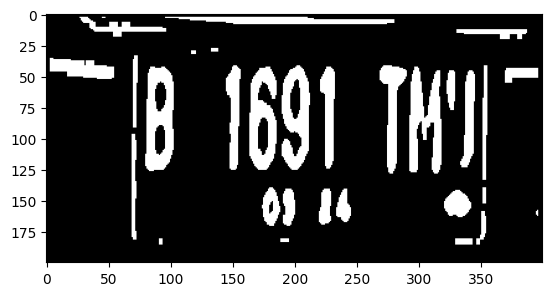

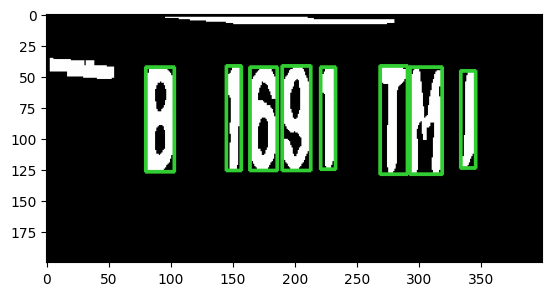

54
B1941SRE


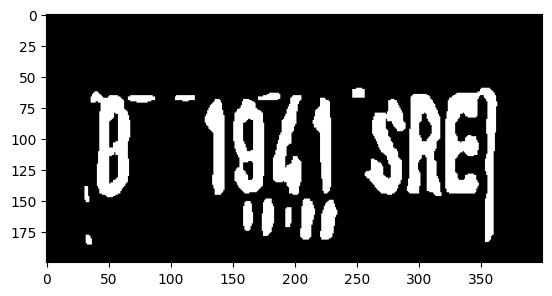

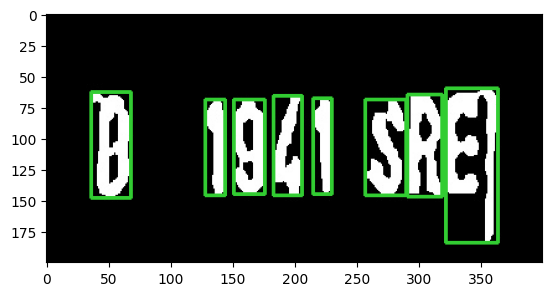

60
AA8414PB


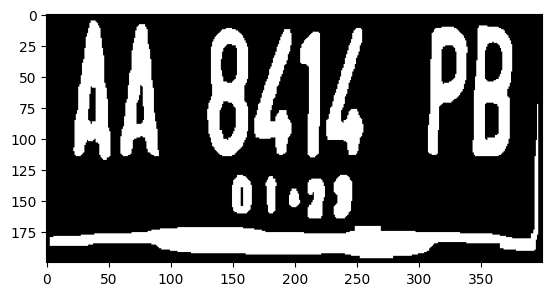

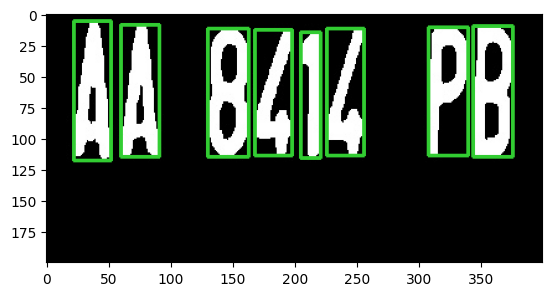

79
B1661TKZ


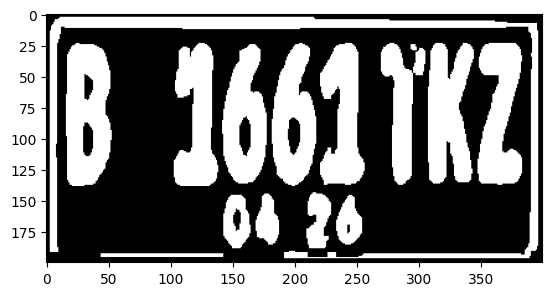

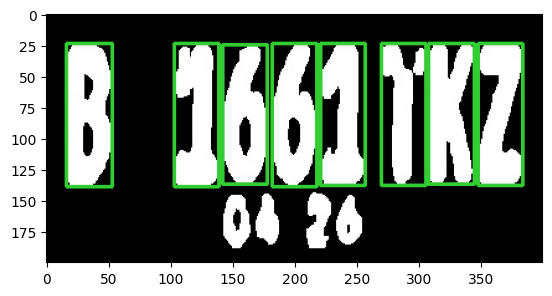

83
B1MAM


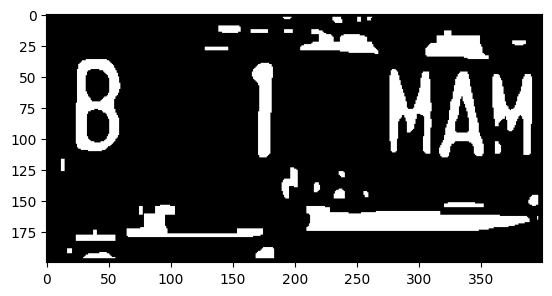

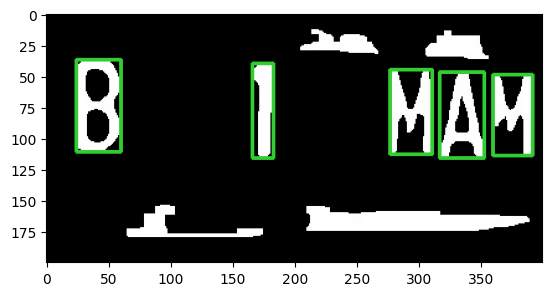

84
AD9313SS


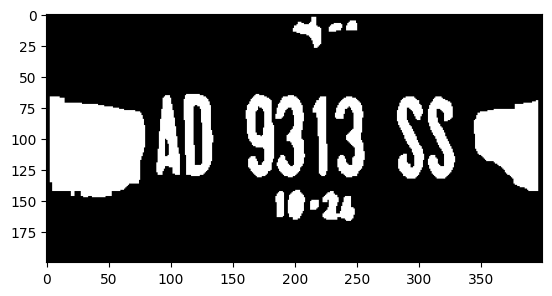

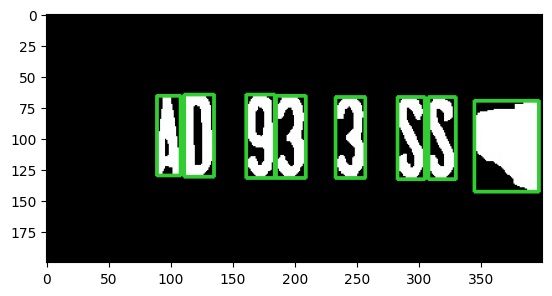

93
AA8144CF


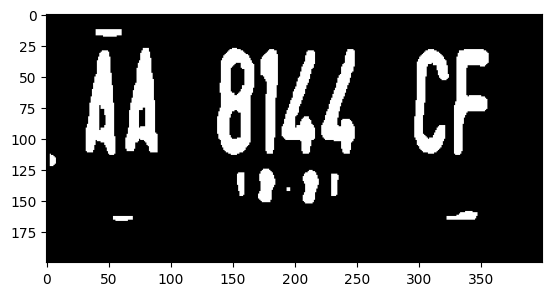

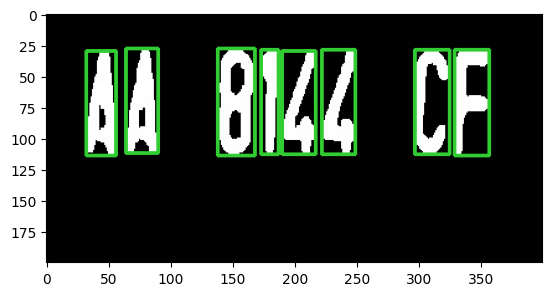

94
AB5571SA


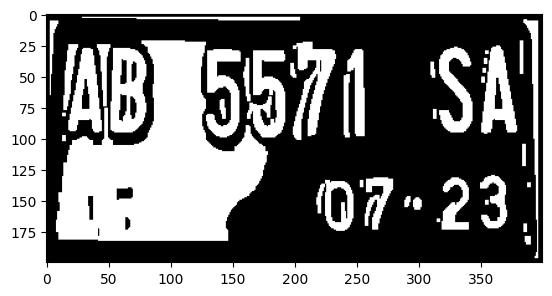

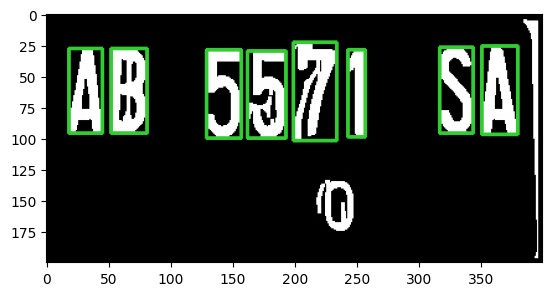

109
B1248PC


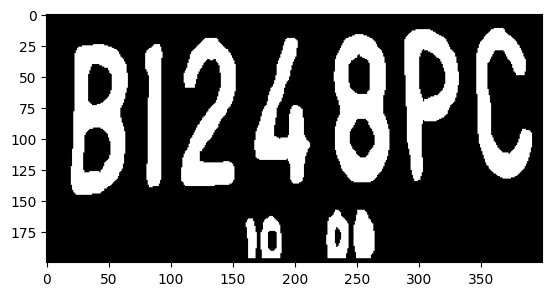

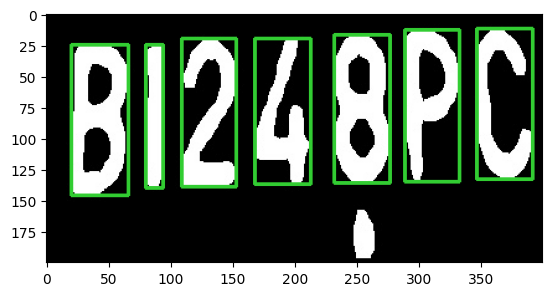

126
AIIS


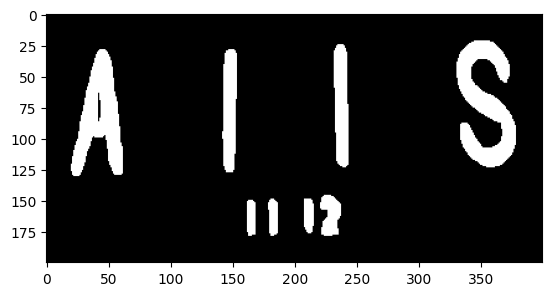

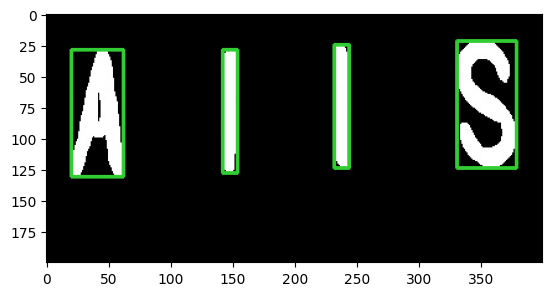

129
AB6711MQ


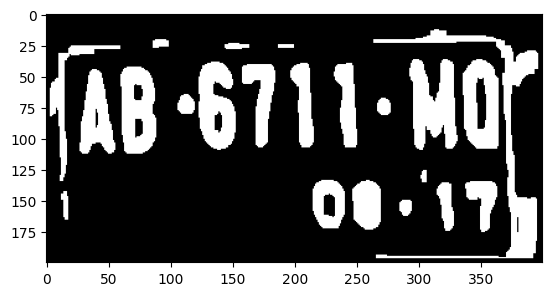

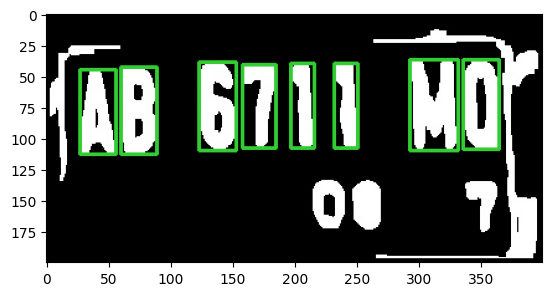

131
B1045WMU


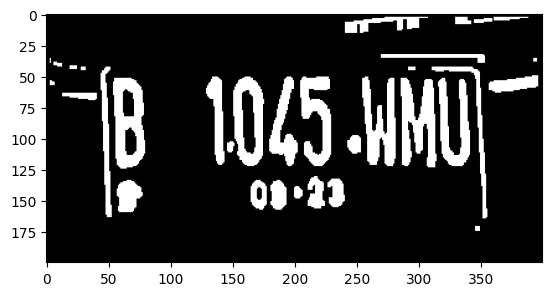

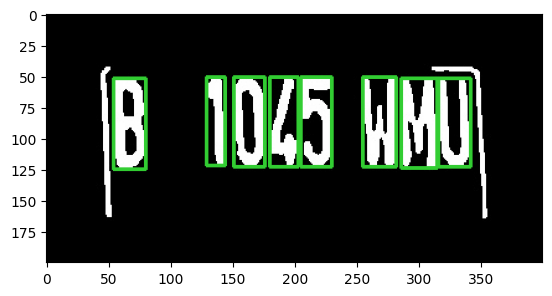

132
B1630UJY


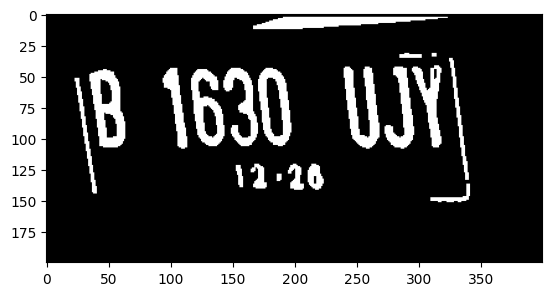

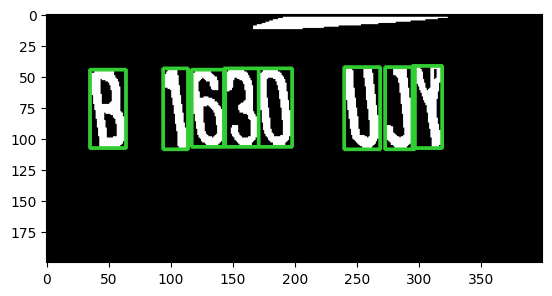

148
B1902TOX


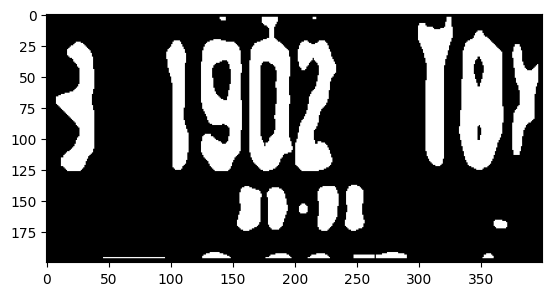

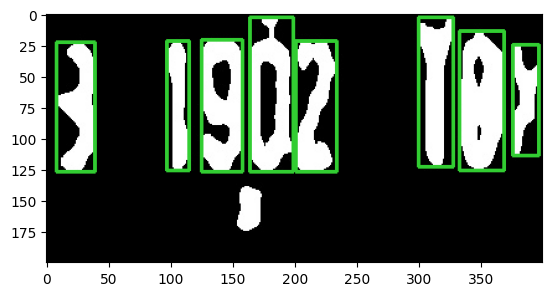

154
A8014VA


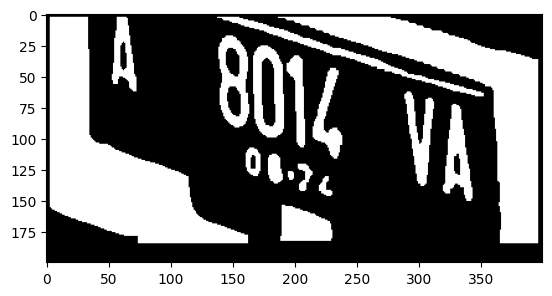

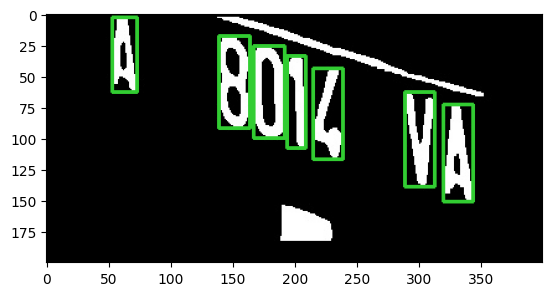

155
B1786BKG


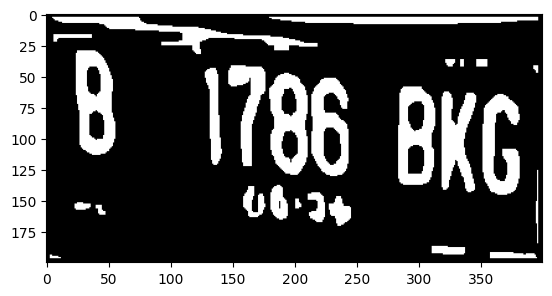

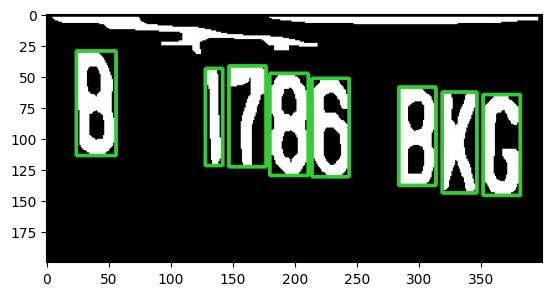

158
B1493KIE


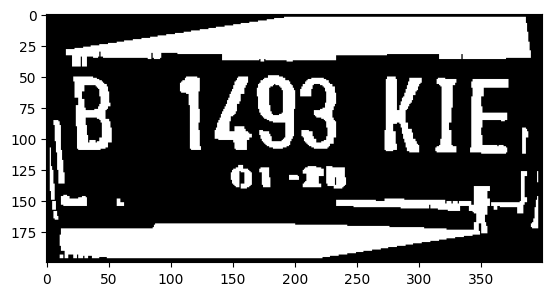

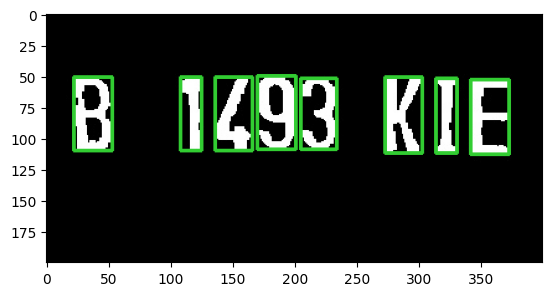

194
B1859ZEA


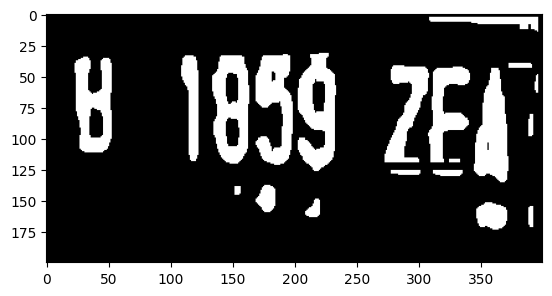

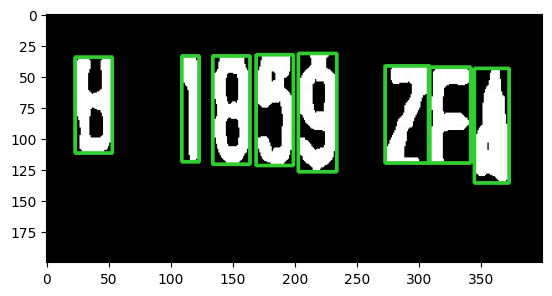

199
B1797TJS


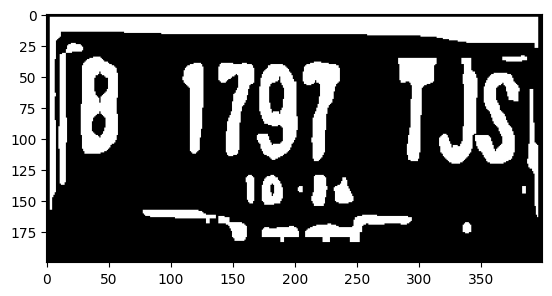

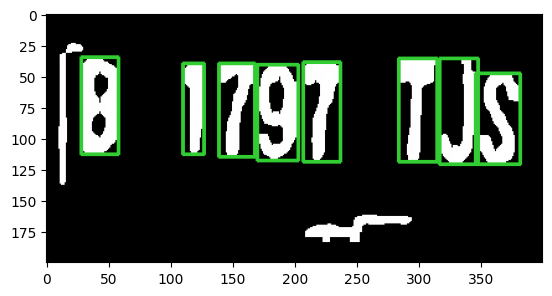

215
B1MAM


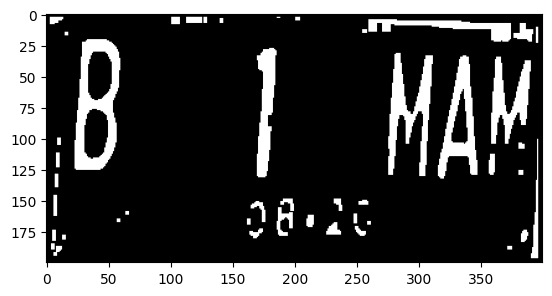

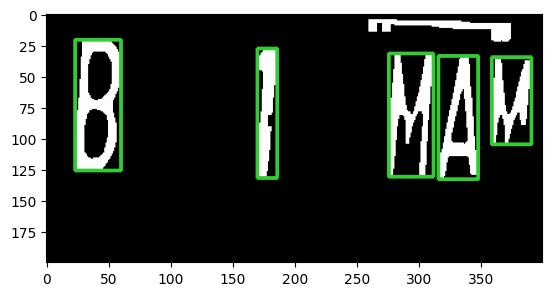

216
B1899ERZ


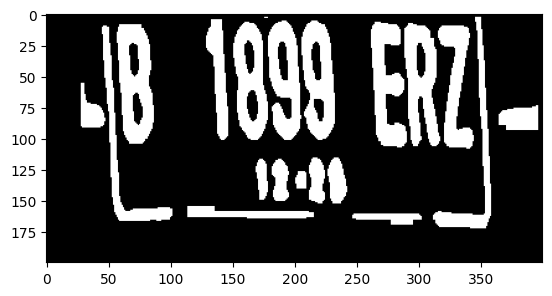

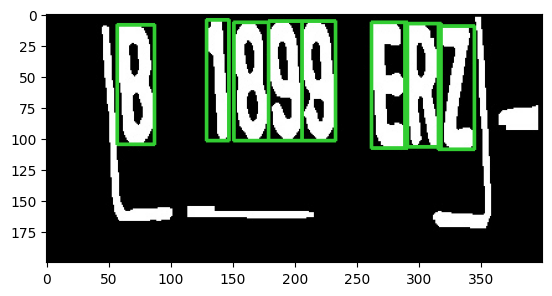

223
B1941SRE


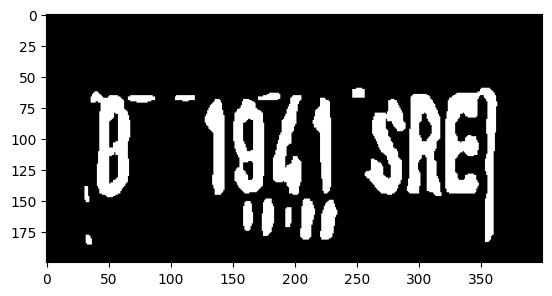

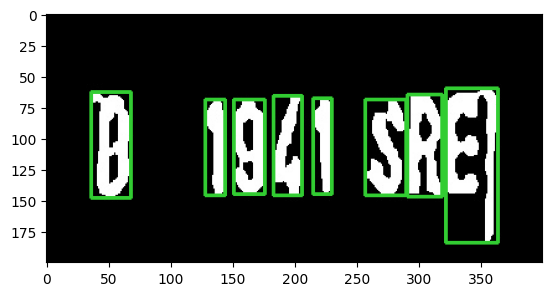

225
AB2056IY


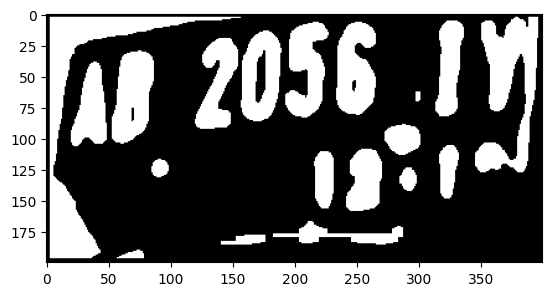

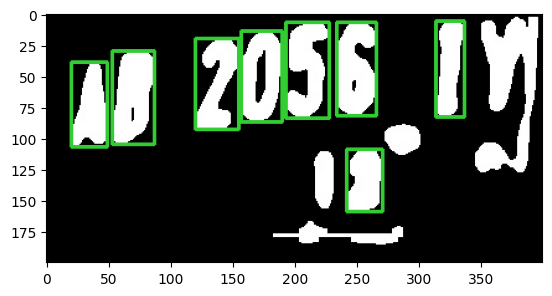

226
B1050SJK


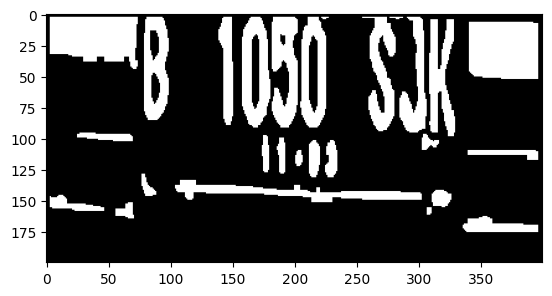

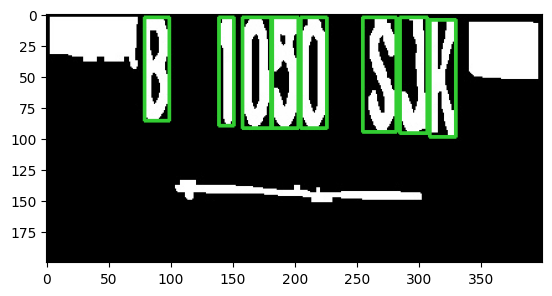

232
AD3340OJ


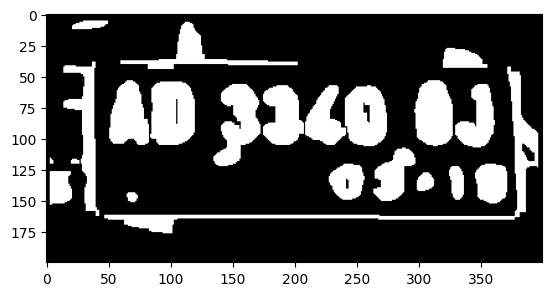

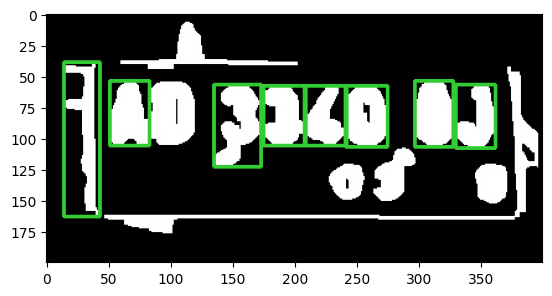

235
AD99JR


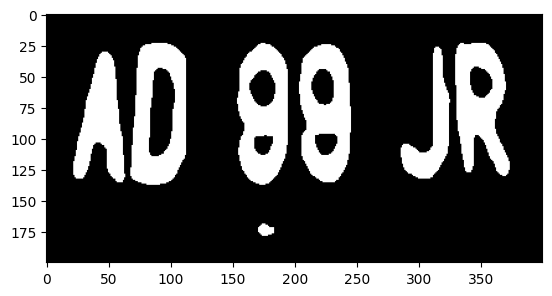

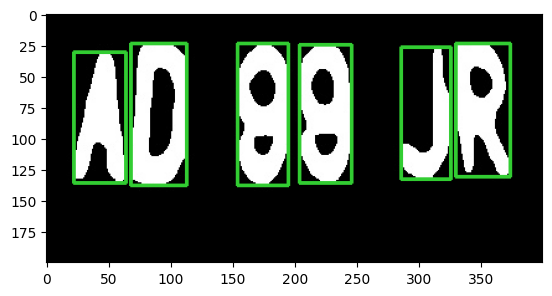

238
B1545UJL


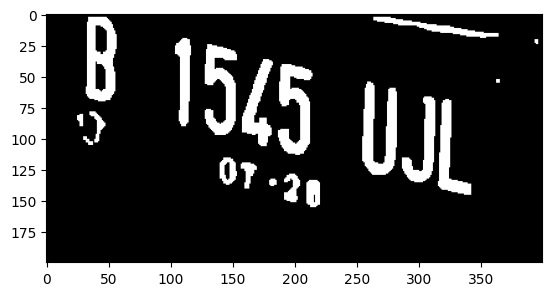

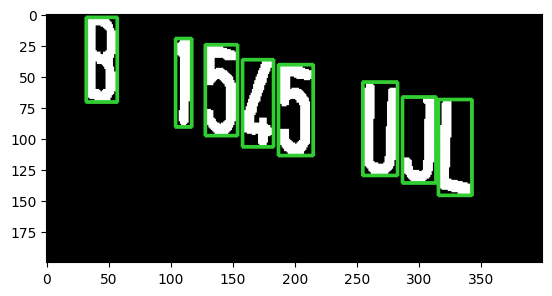

243
B1549RFS


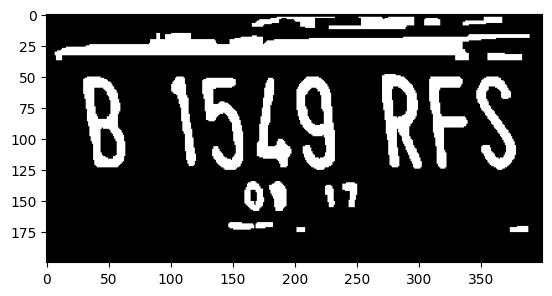

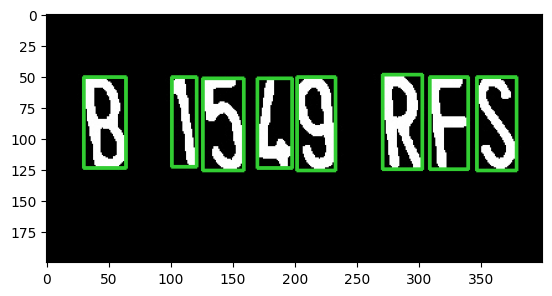

261
B1772TOZ


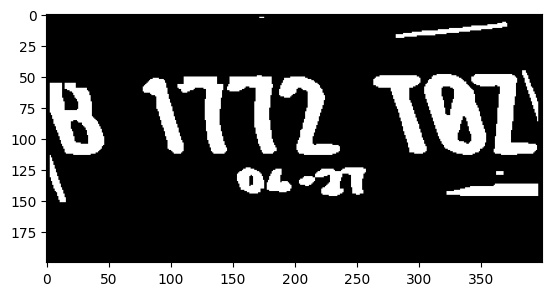

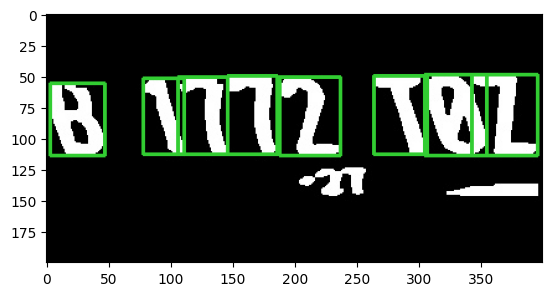

266
B1089VD


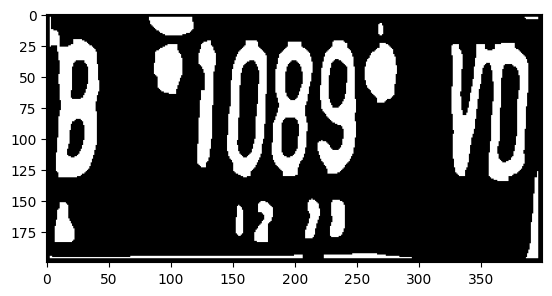

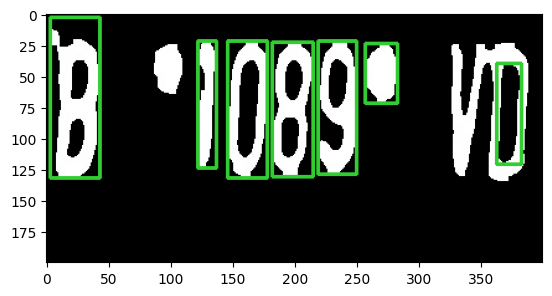

280
B1012DFM


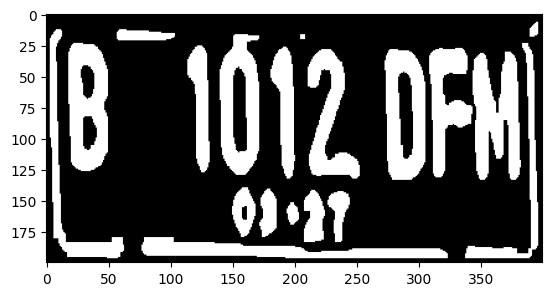

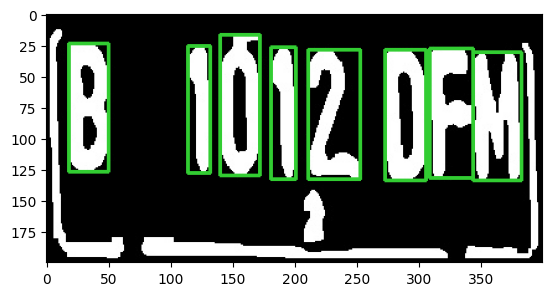

285
B1207TJW


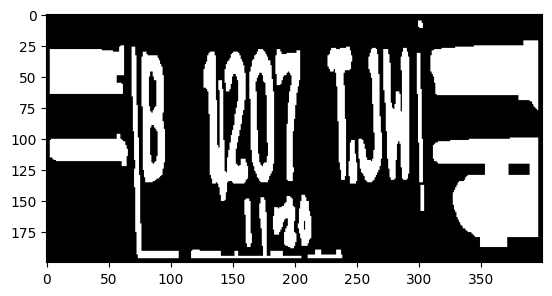

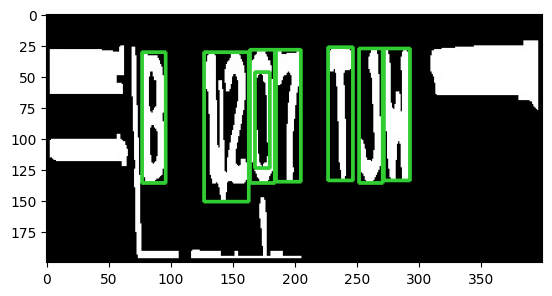

290
B1765ERB


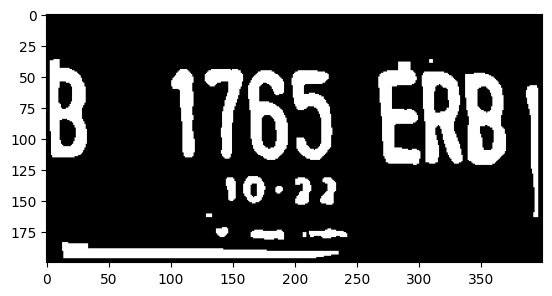

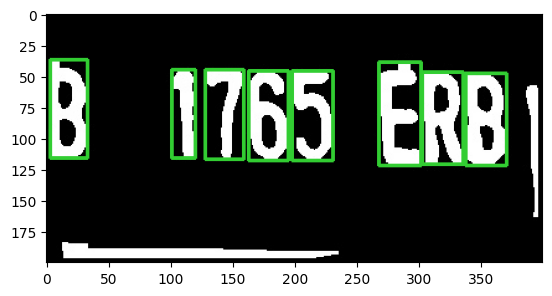

302
B11VAN


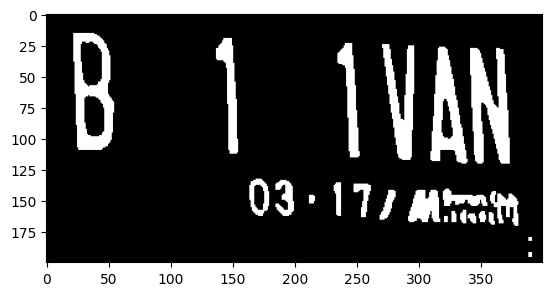

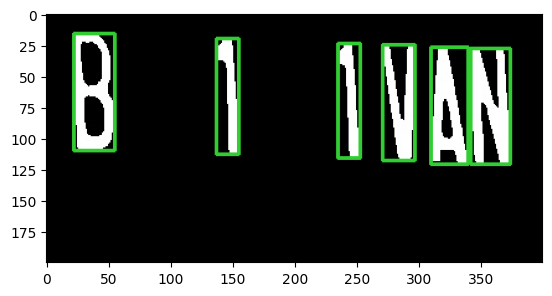

313
B1682PJN


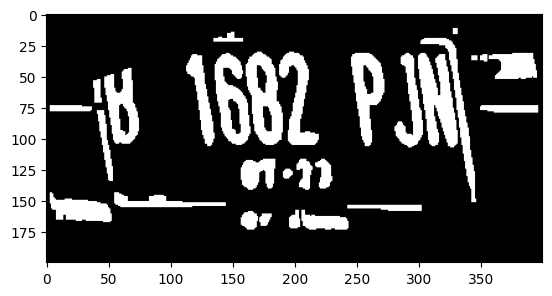

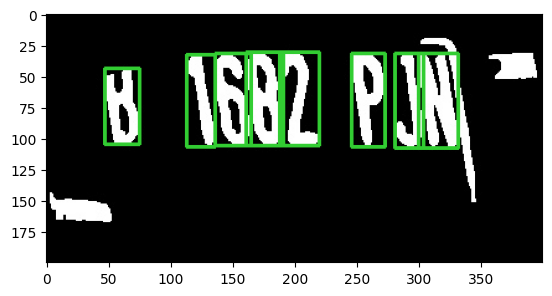

325
B1032NJH


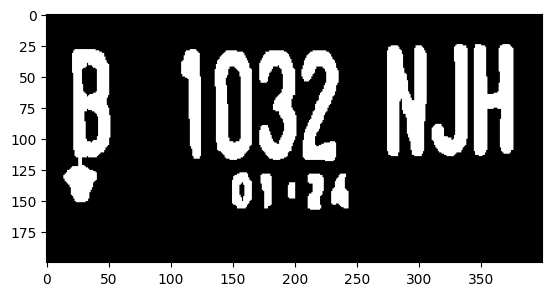

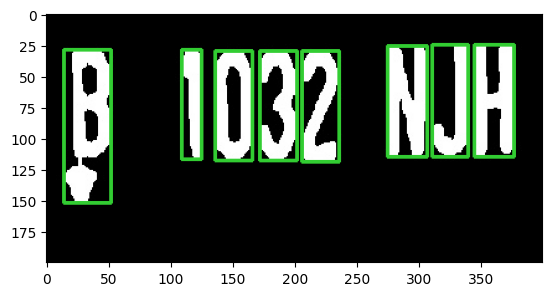

329
B1661TKZ


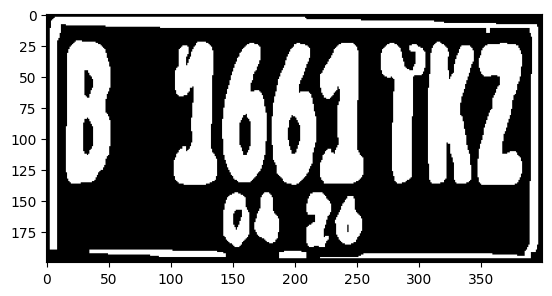

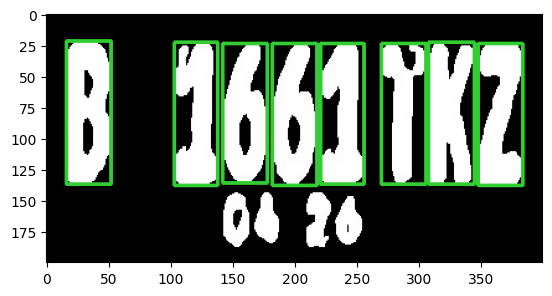

336
B1029GKI


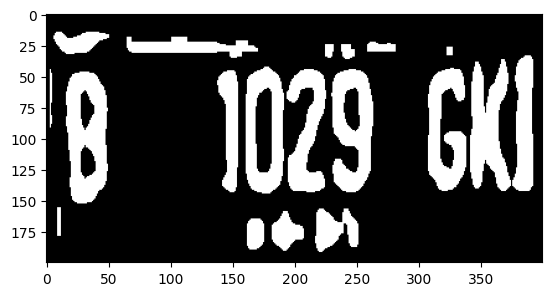

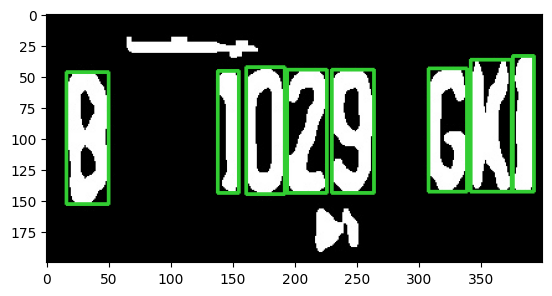

340
B1913TIS


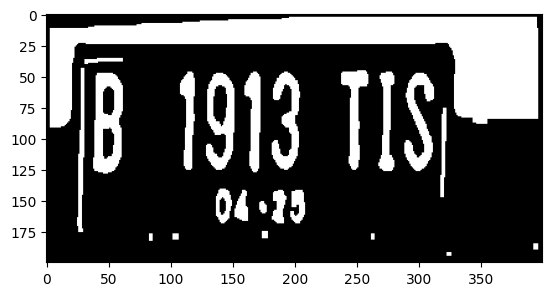

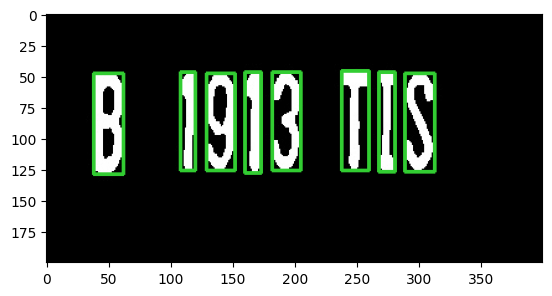

344
AA1248MB


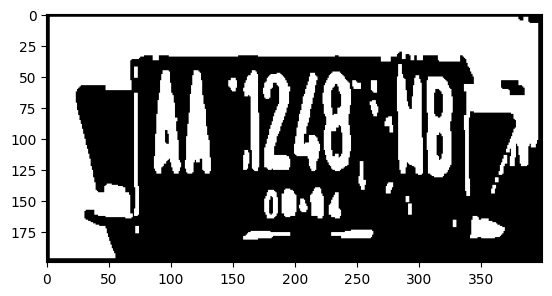

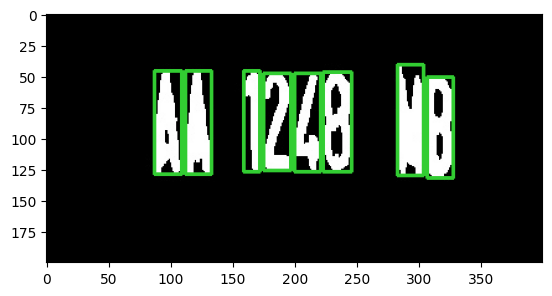

345
B1707RFS


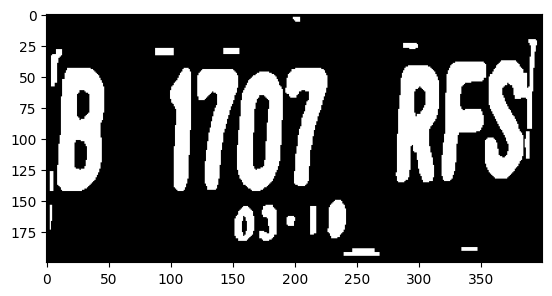

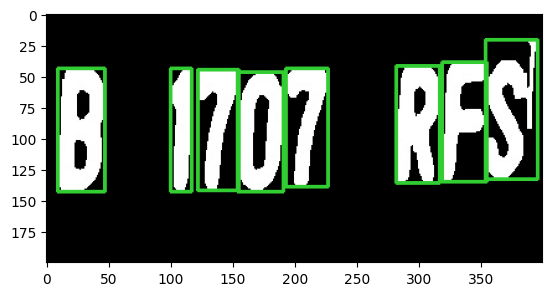

347
B1654RFS


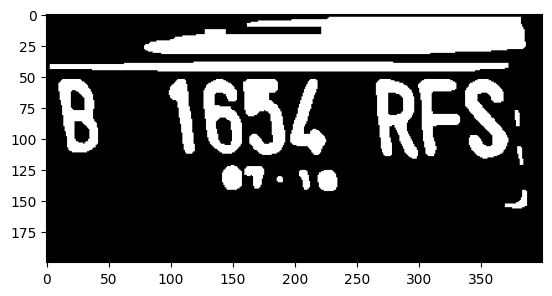

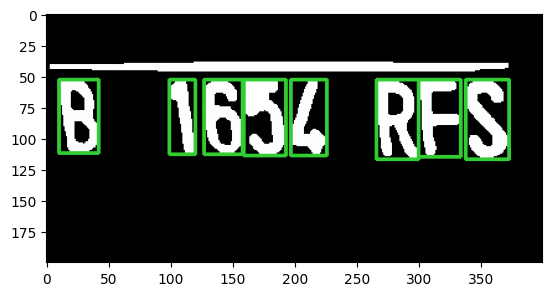

357
B1089VD


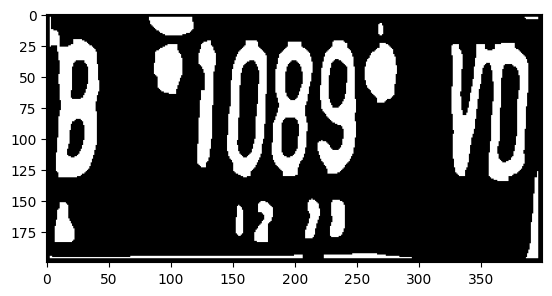

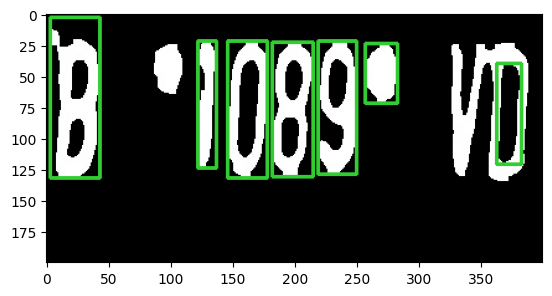

358
B1MAM


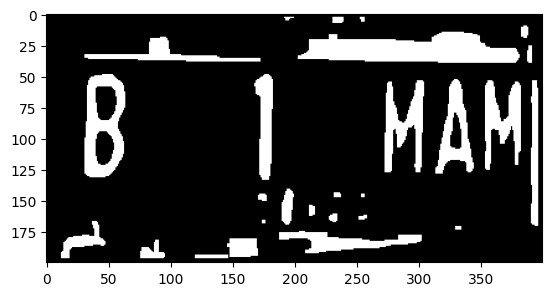

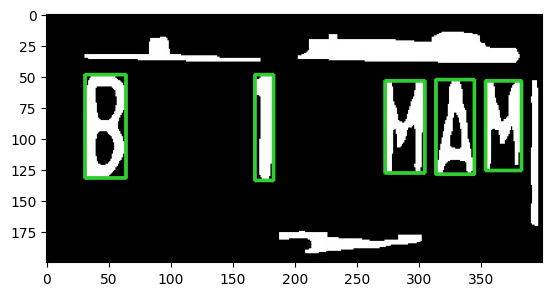

361
AD1164HU


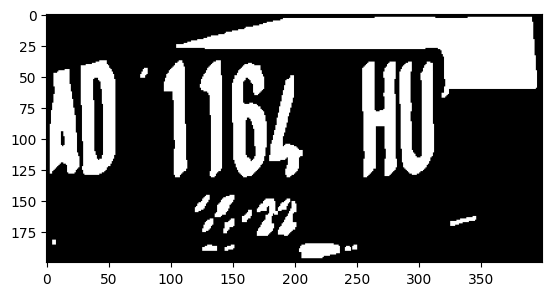

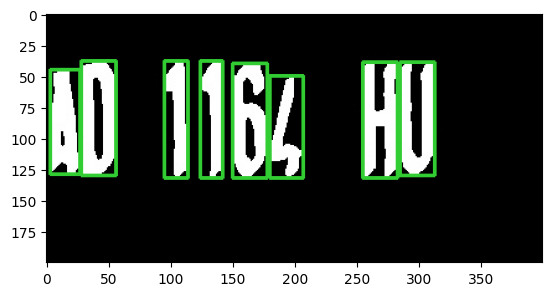

380
B1453ZKB


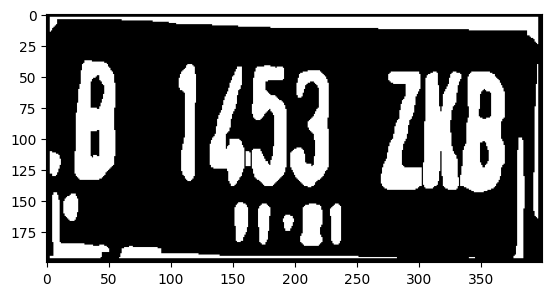

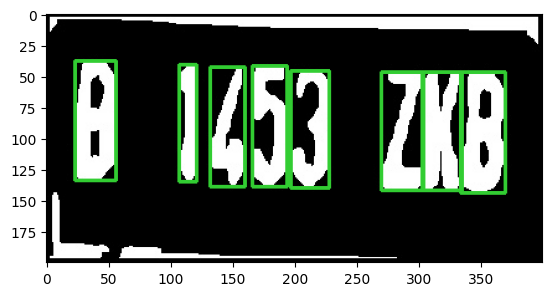

384
B1825KJN


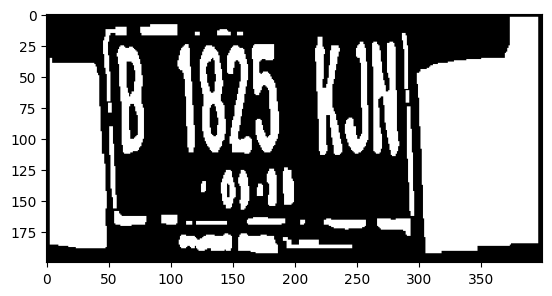

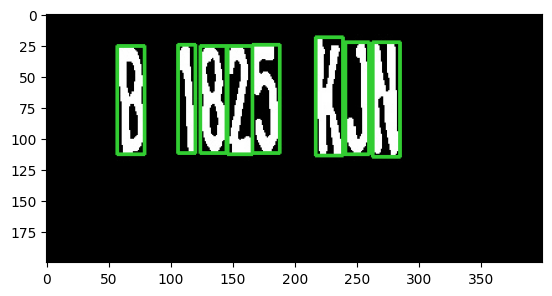

387
B1089VD


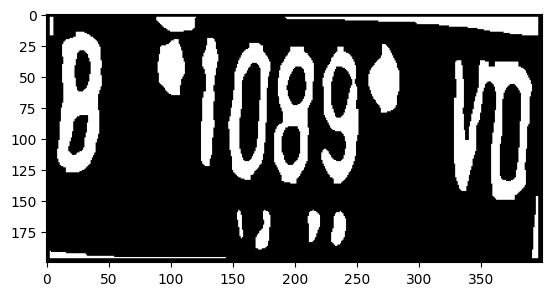

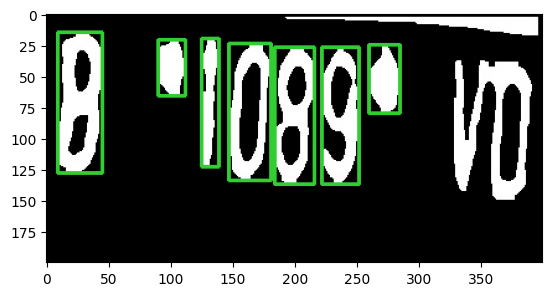

391
AG5140VAA


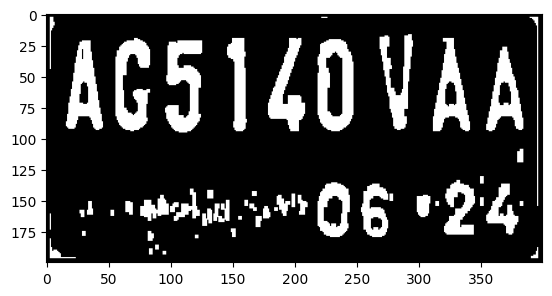

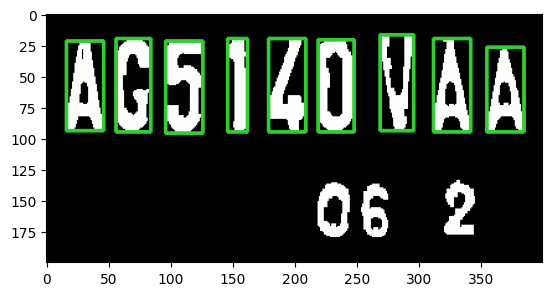

400
B1586WFJ


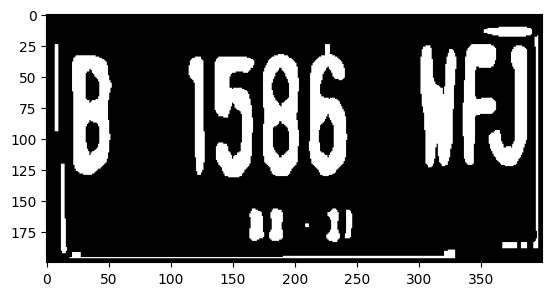

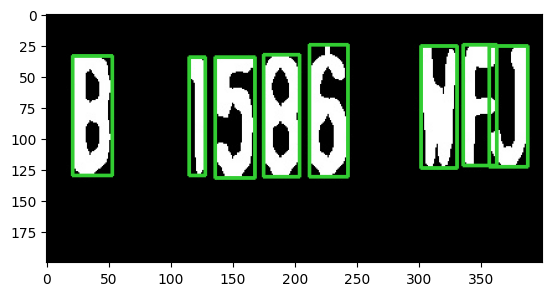

401
B1528DR


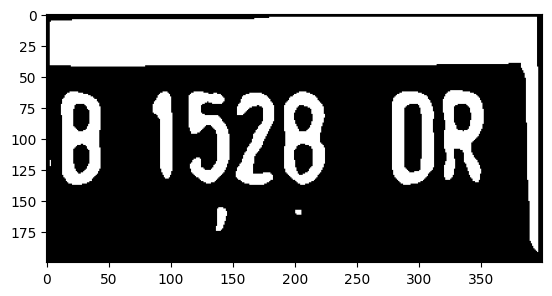

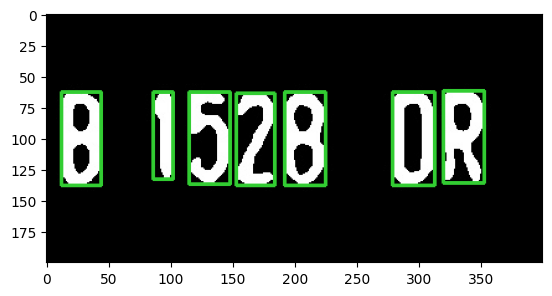

402
B1470TLQ


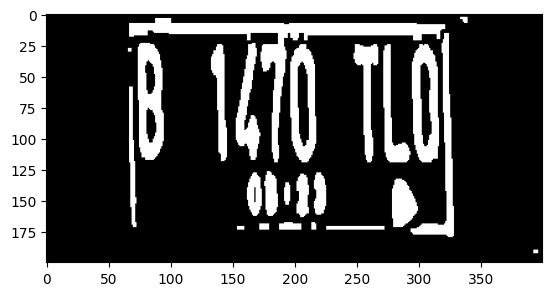

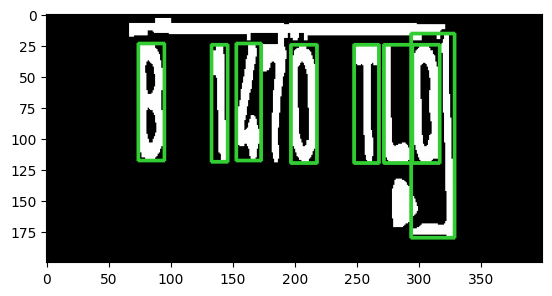

414
B1076Y


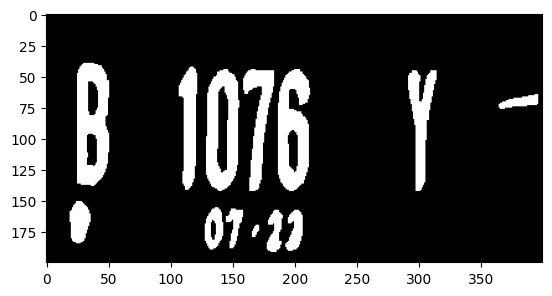

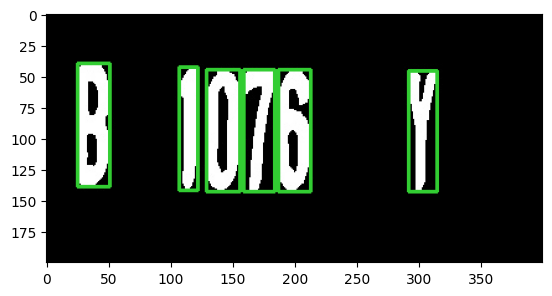

416
B1389TJT


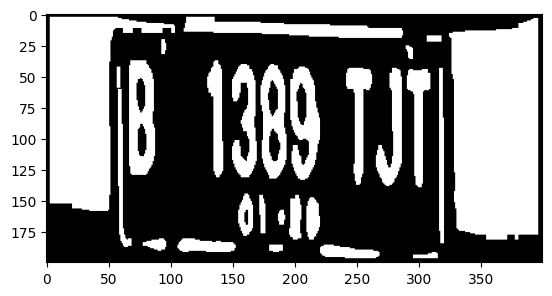

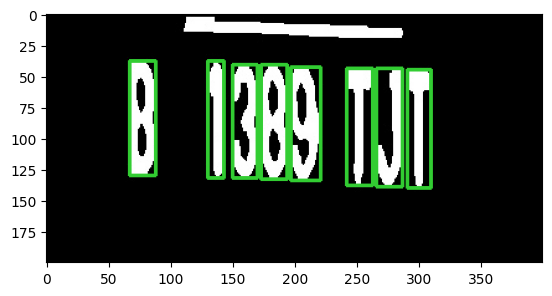

417
B1282TJB


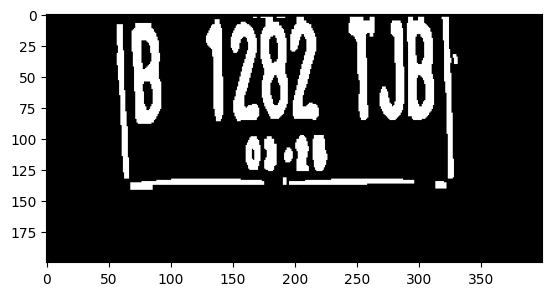

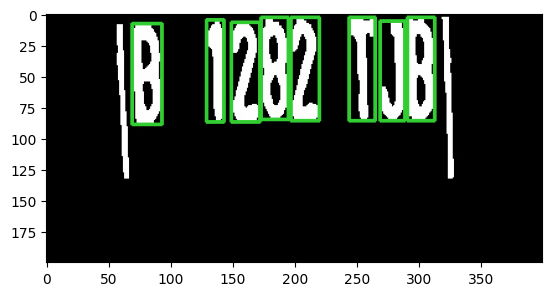

420
B1MAM


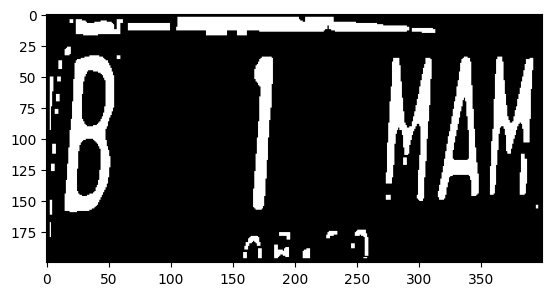

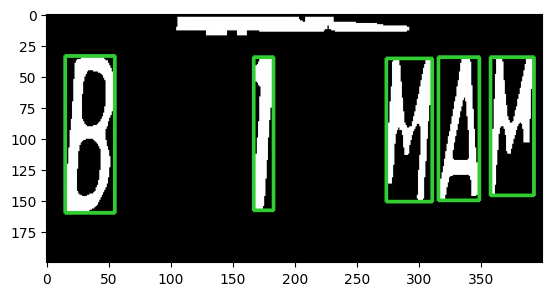

435
B123MBM


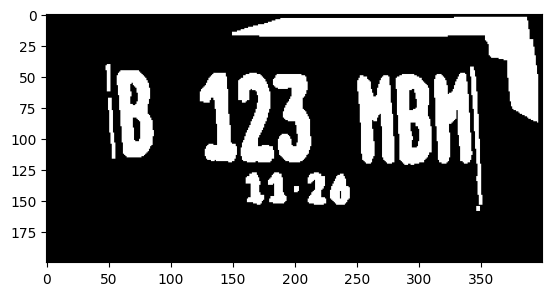

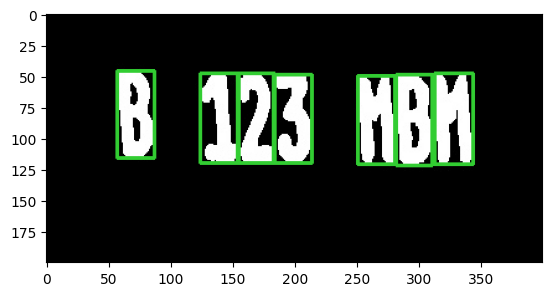

438
AD1164HU


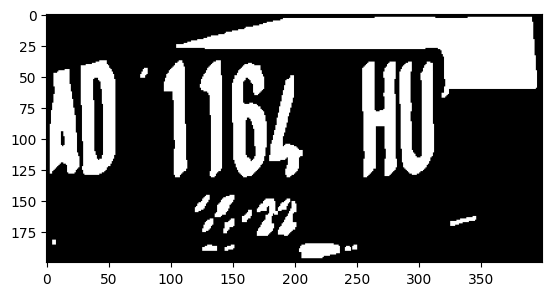

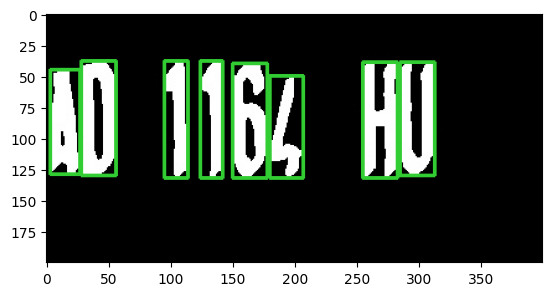

441
B1276PVE


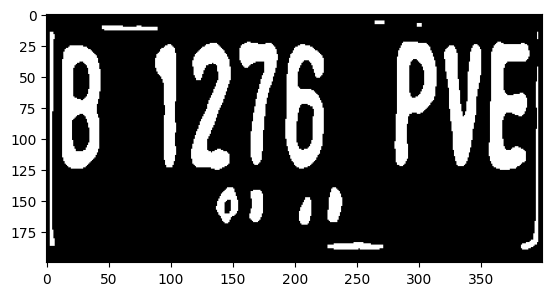

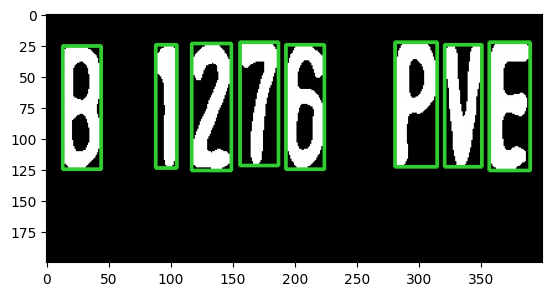

443
B1794TZF


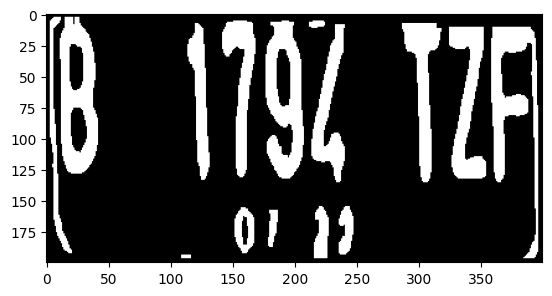

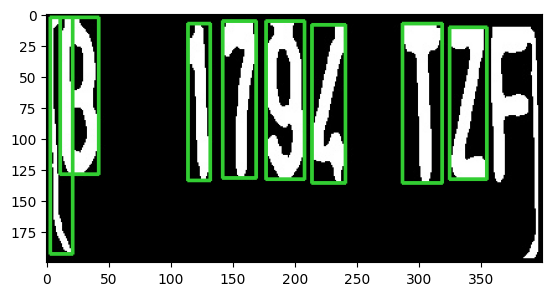

451
B1226TZY


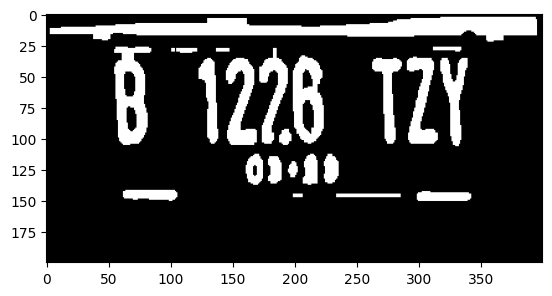

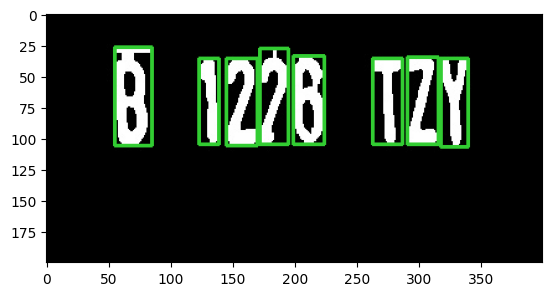

458
B1423KZR


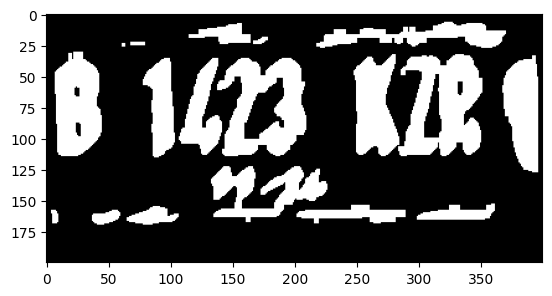

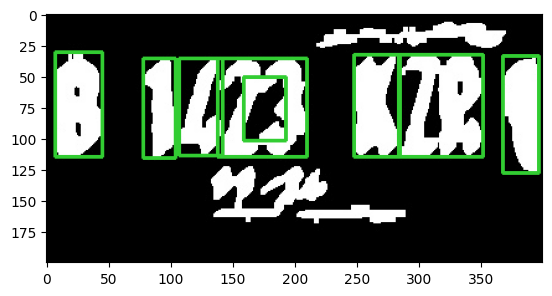

459
B1684BJN


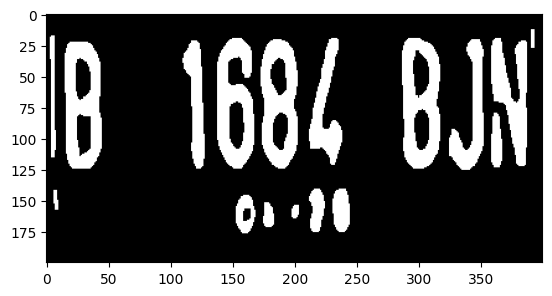

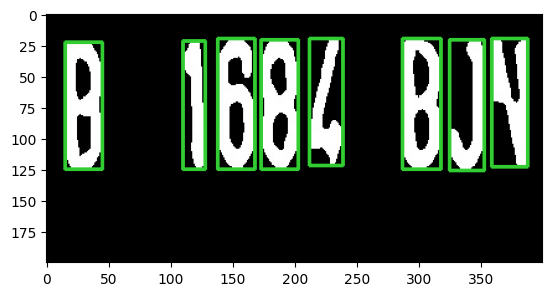

460
B1755KZI


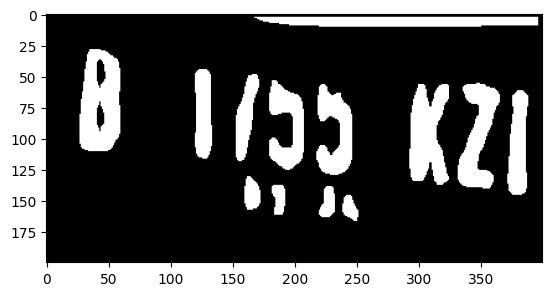

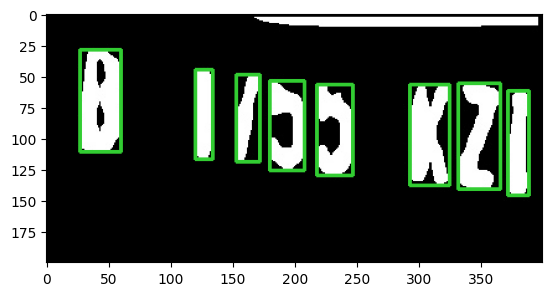

462
AB2491TQ


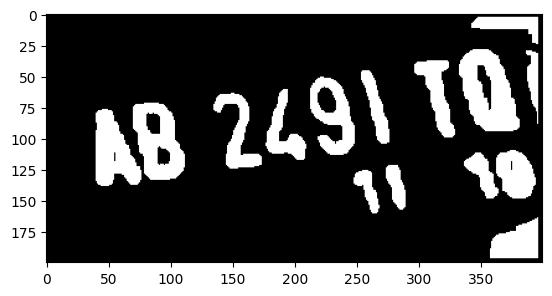

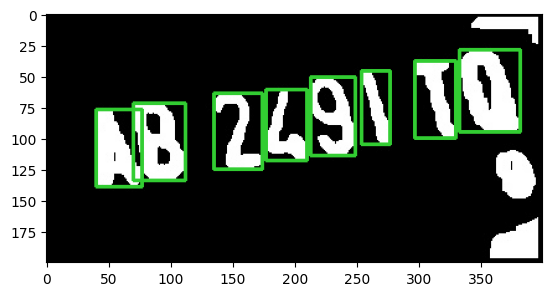

478
B1830PJK


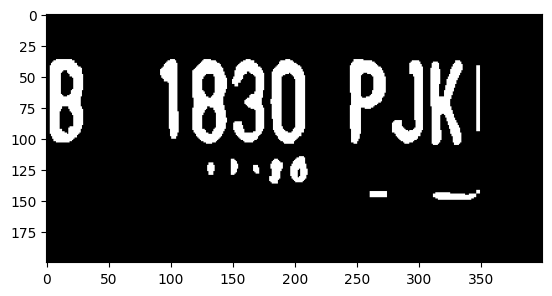

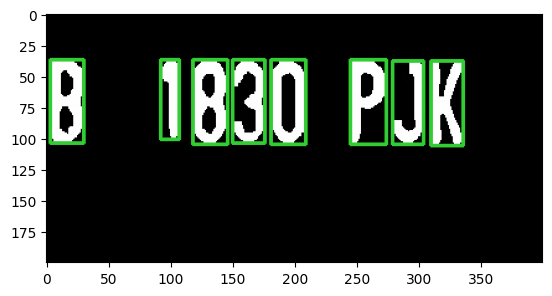

479
B1916SJJ


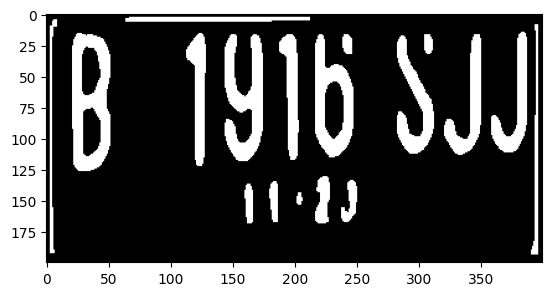

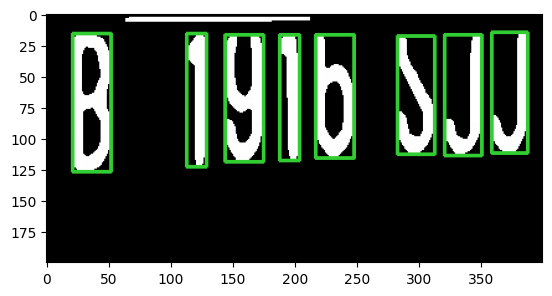

481
B1765ERB


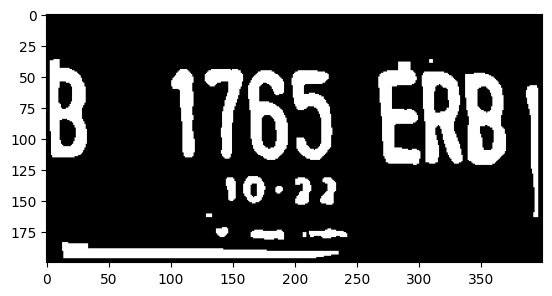

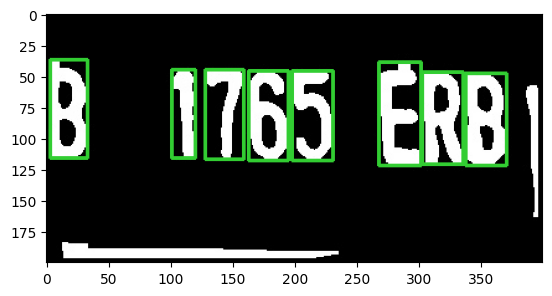

489
AD8626VD


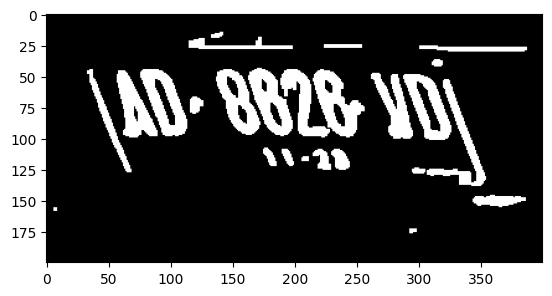

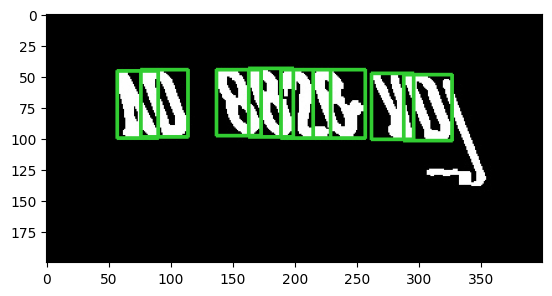

500
B1770TIC


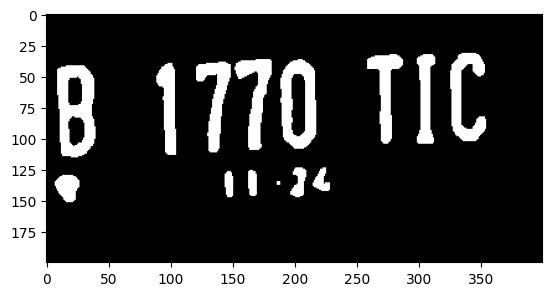

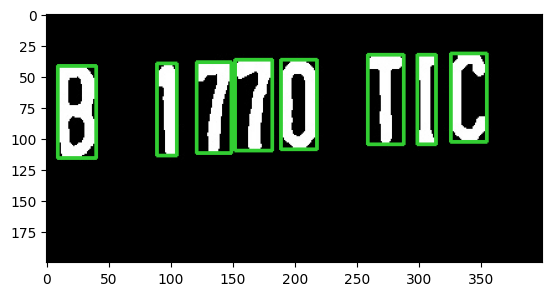

501
B1977QZ


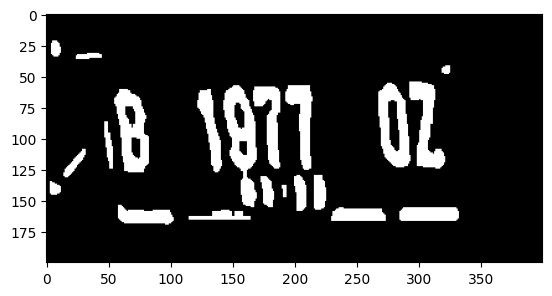

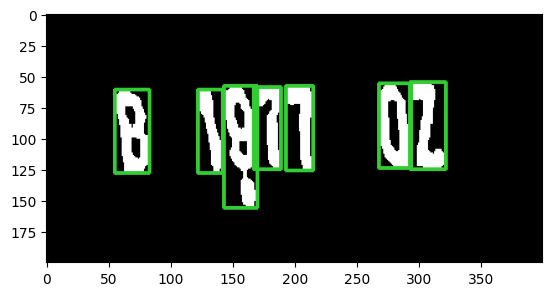

504
B1732PJH


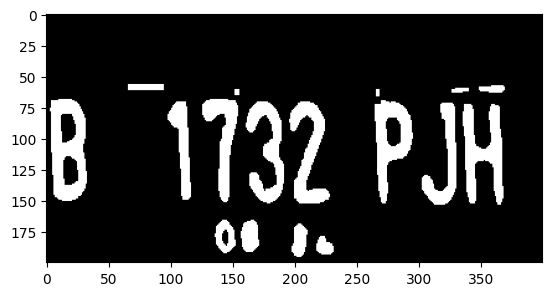

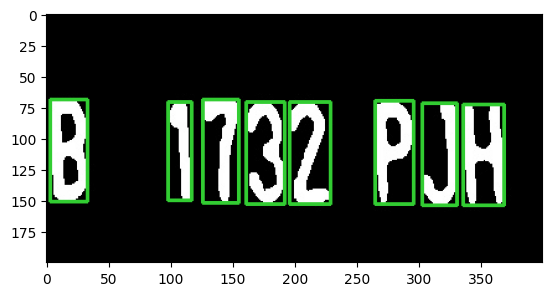

509
B144NTA


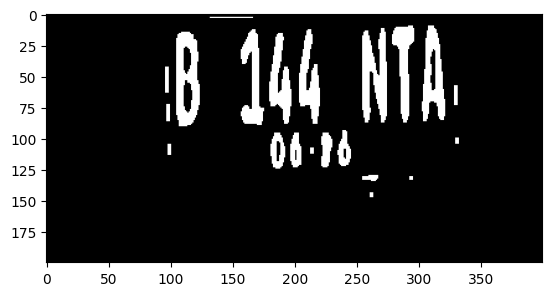

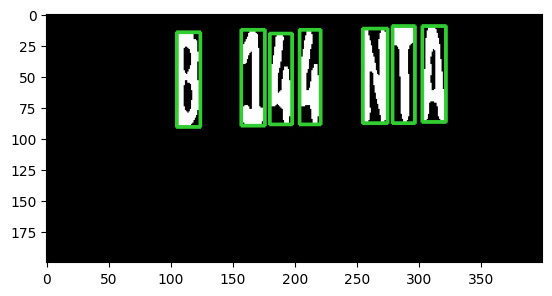

510
B1972RBP


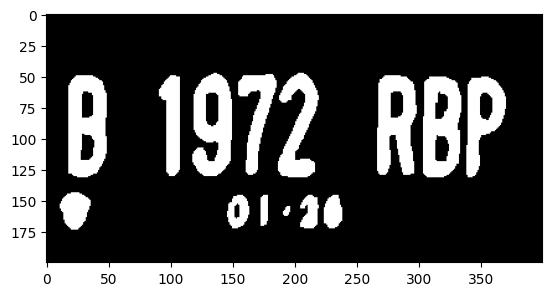

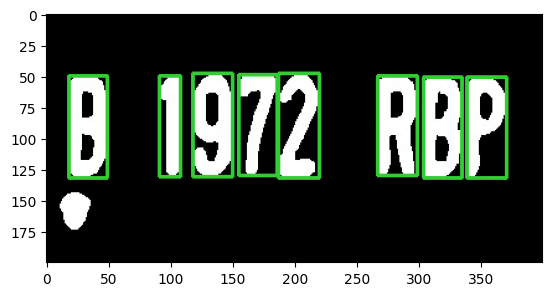

512
B13NST


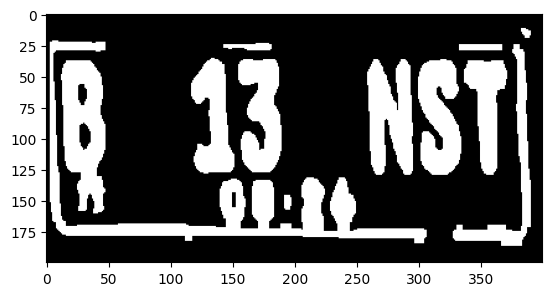

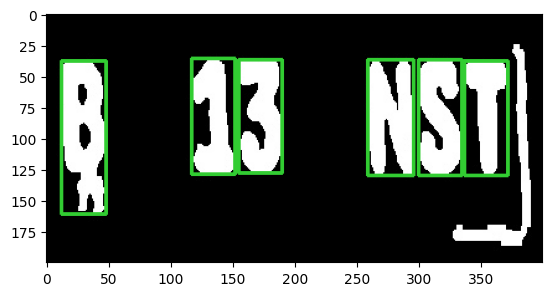

532
AB3511OH


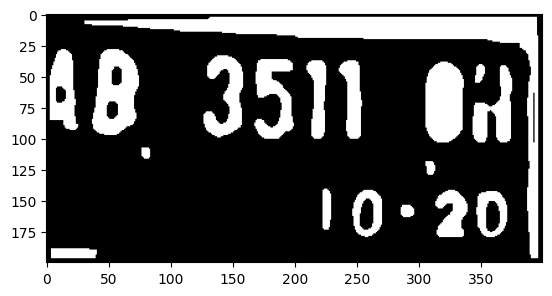

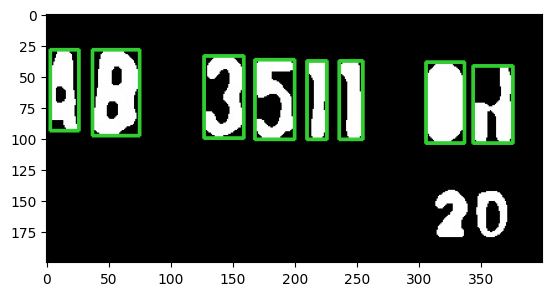

536
B1538ELS


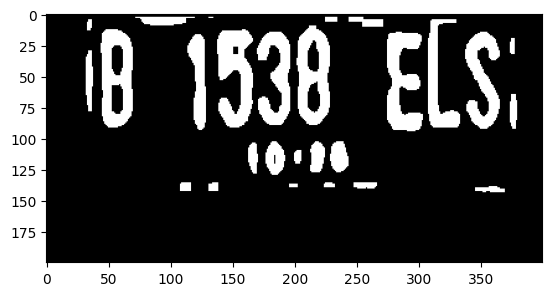

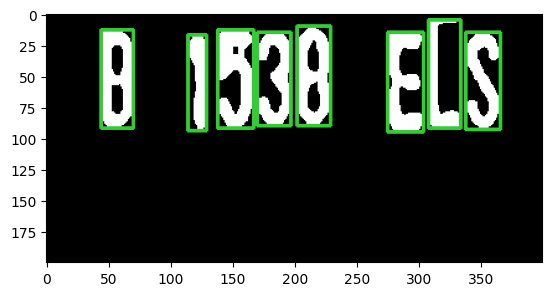

537
AA9080CK


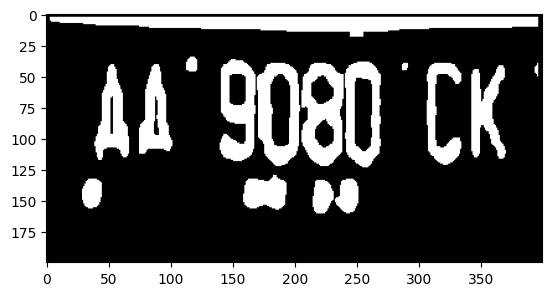

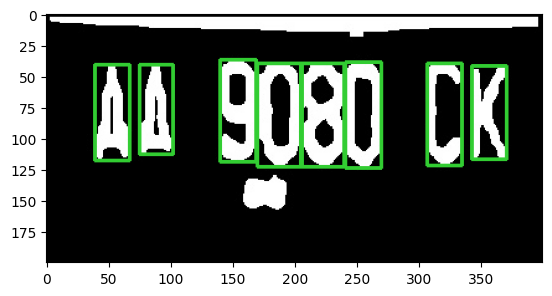

547
B1225FIS


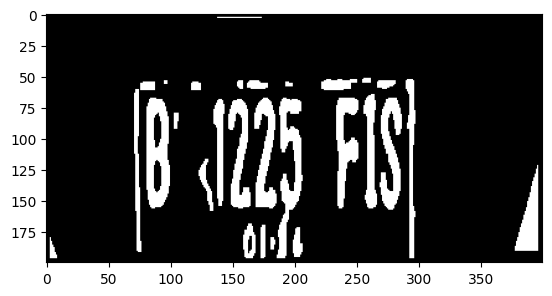

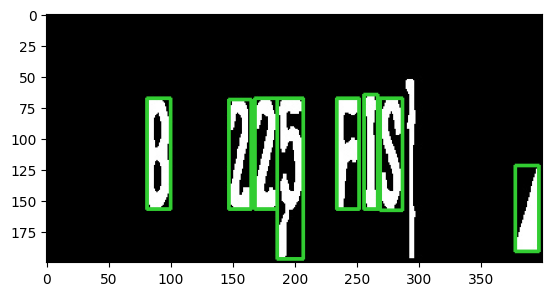

549
AB1170UU


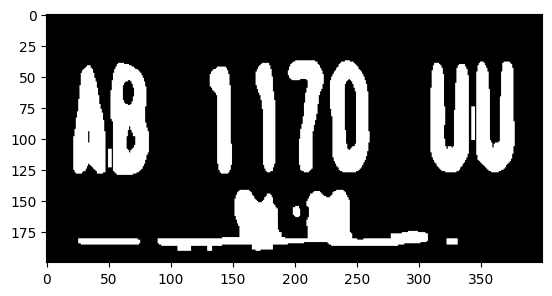

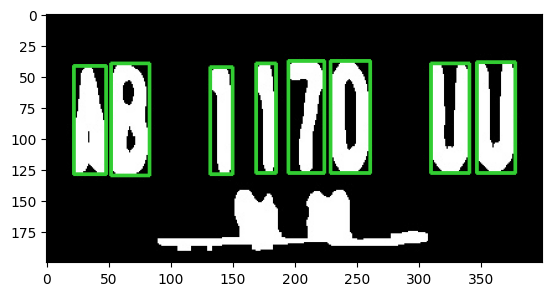

561
B1038TZC


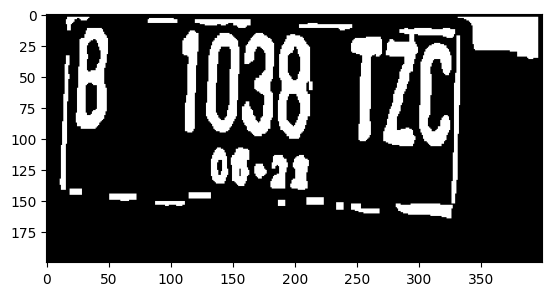

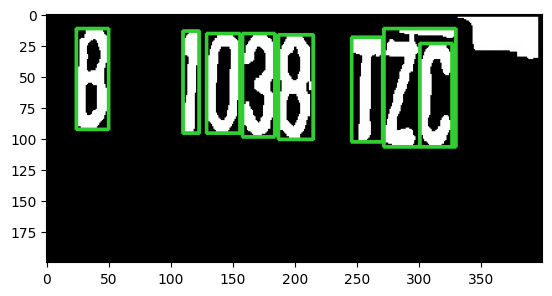

563
B1939FRA


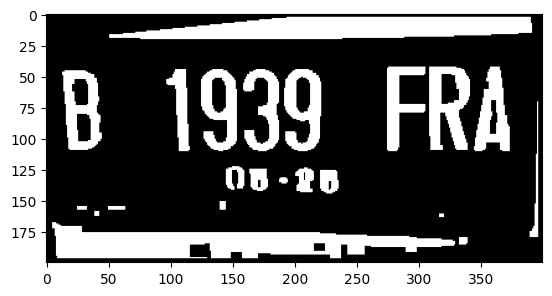

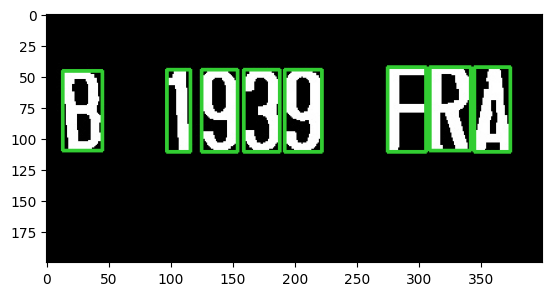

589
B1830PJK


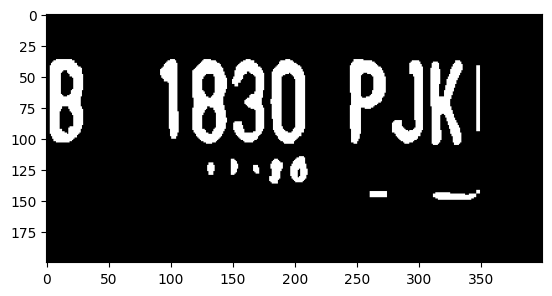

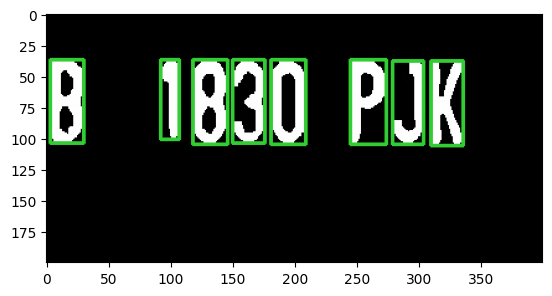

592
B19EDY


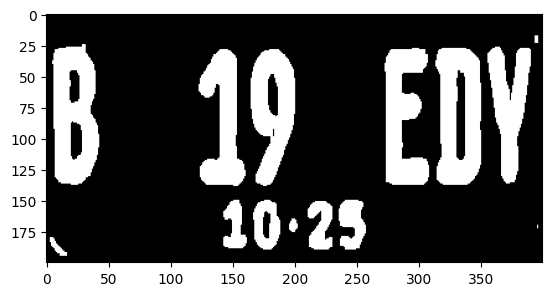

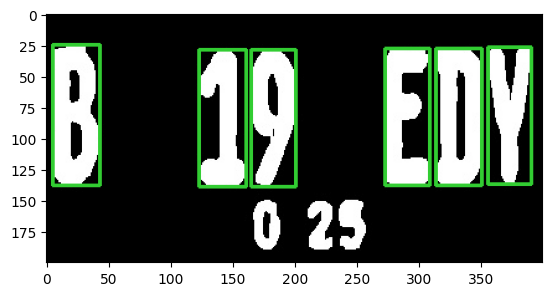

601
B1229EYO


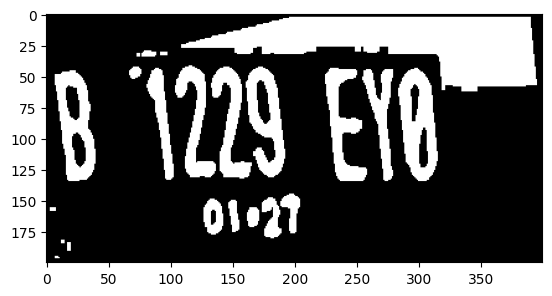

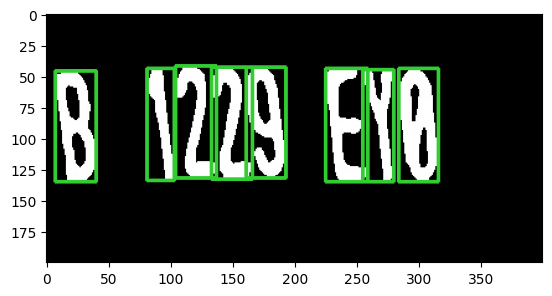

603
B1937WJD


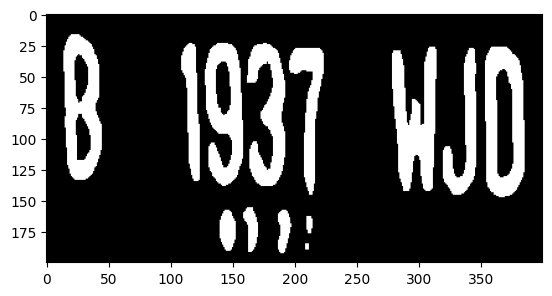

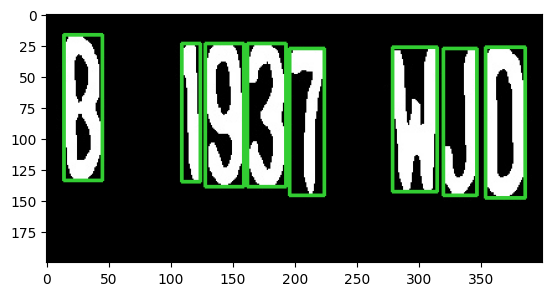

607
B1691TMU


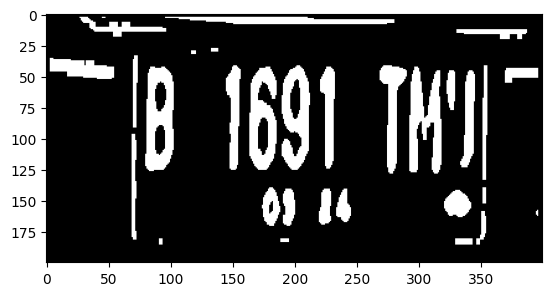

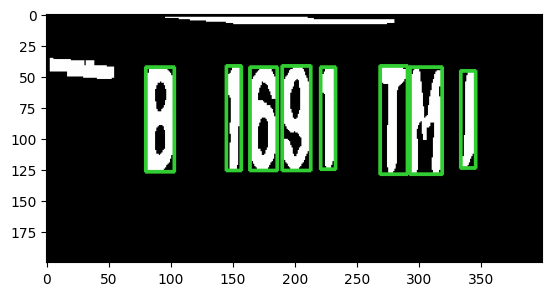

611
B1786UJT


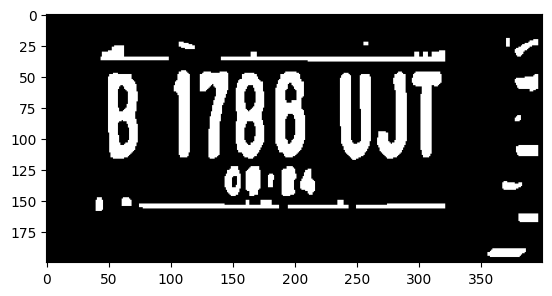

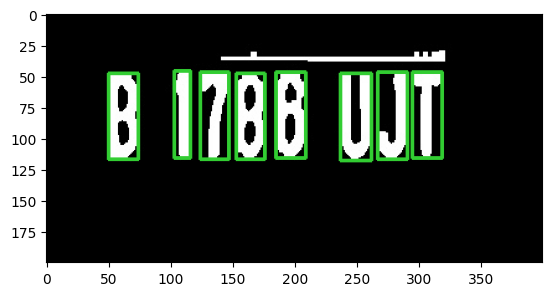

613
B118GY


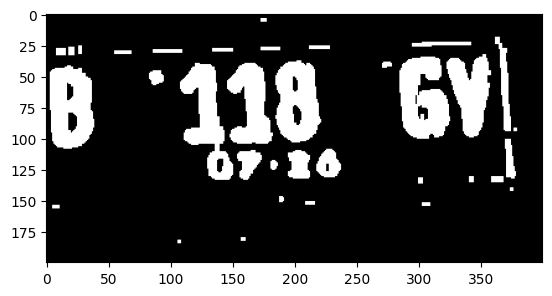

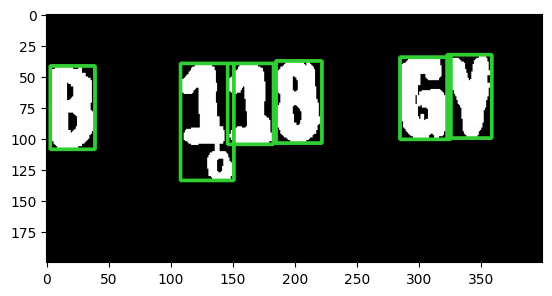

623
B1160BH


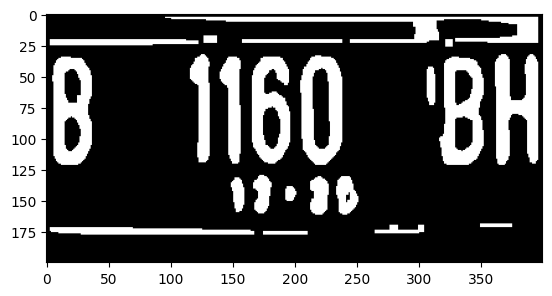

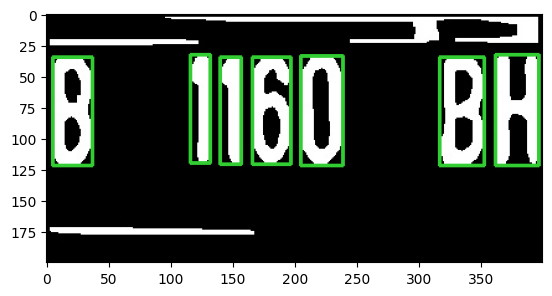

629
B1378EFZ


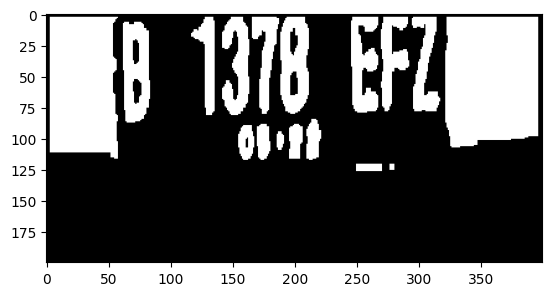

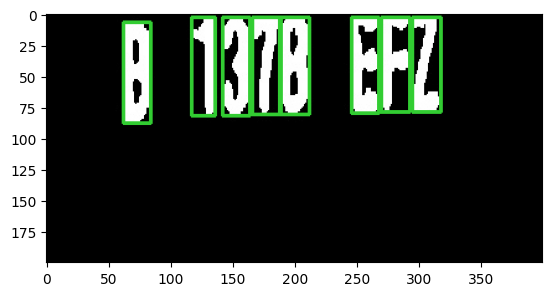

634
B1801TZS


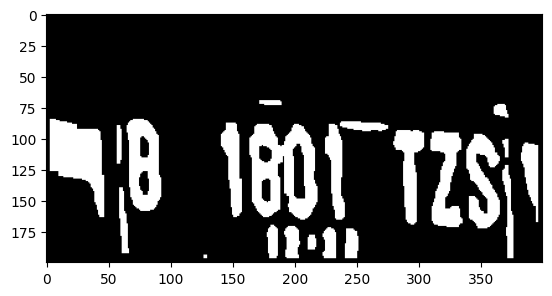

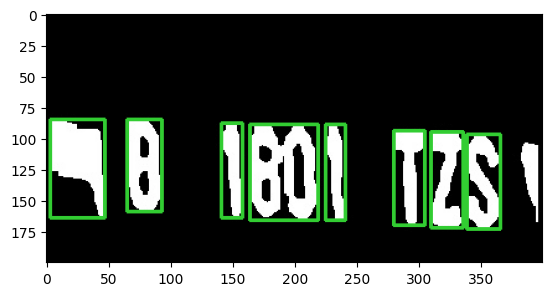

639
B1470TLO


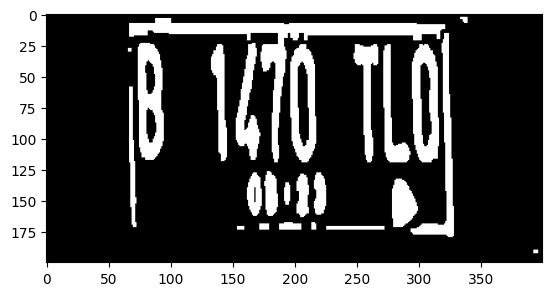

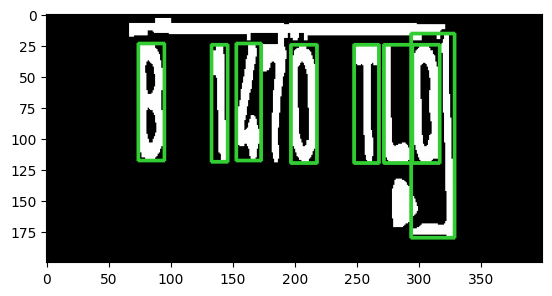

642
B1802EOZ


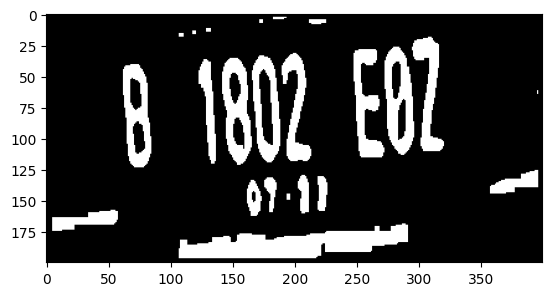

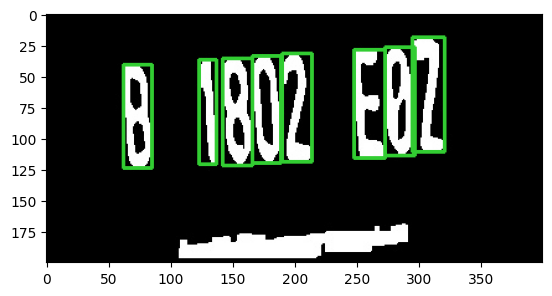

650
B1494BJK


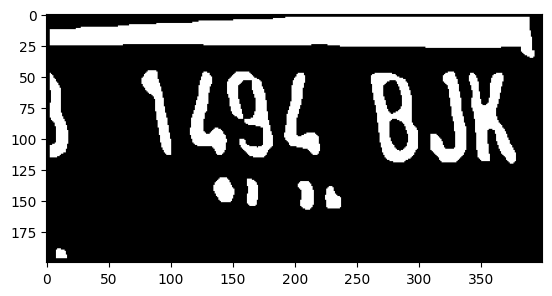

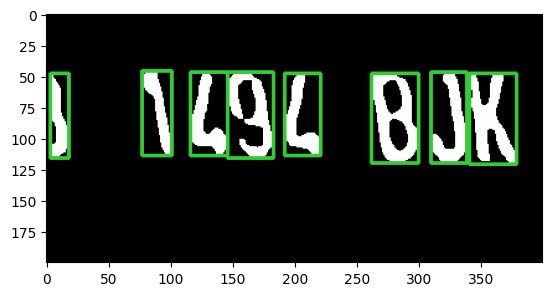

651
B1045WMU


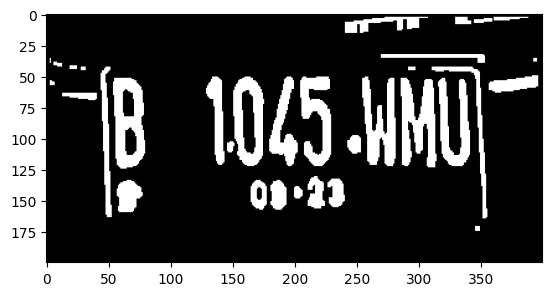

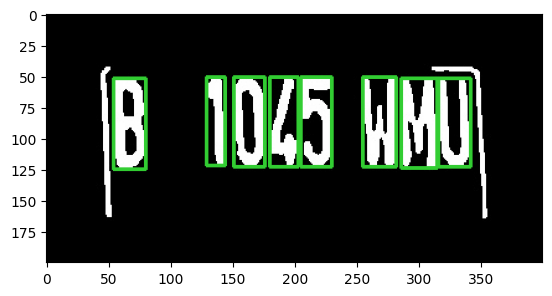

653
B1389TJT


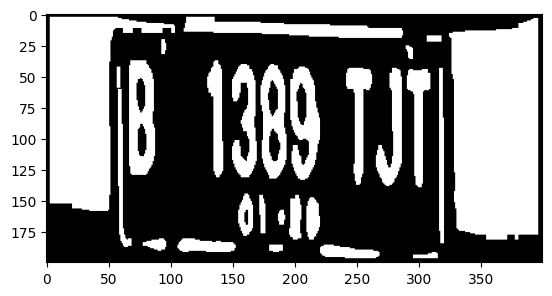

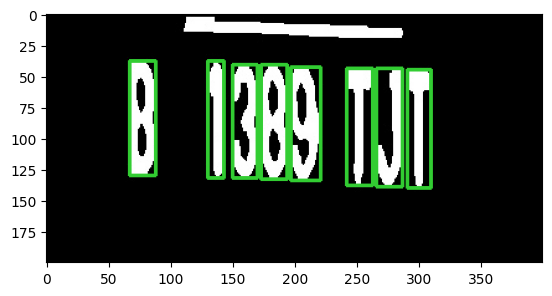

660
AD6118BFE


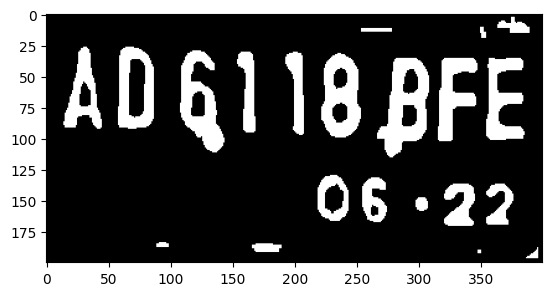

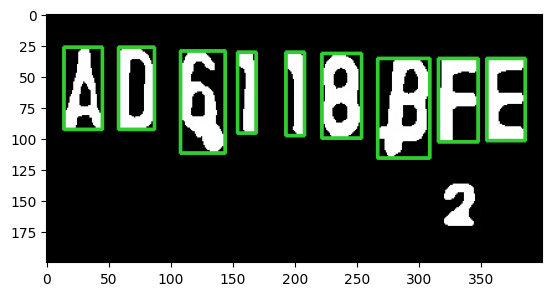

662
B1445TIF


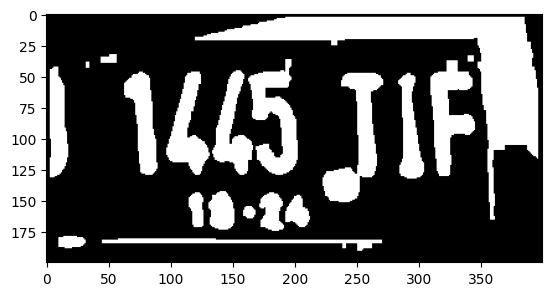

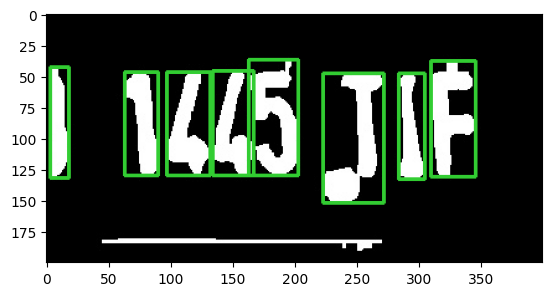

663
B1508EZE


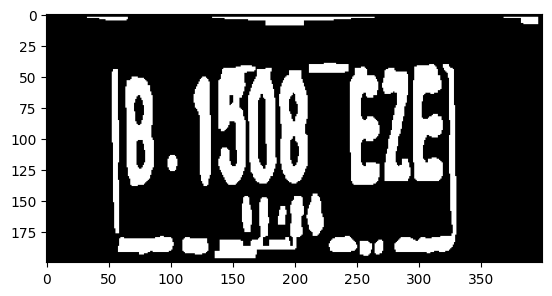

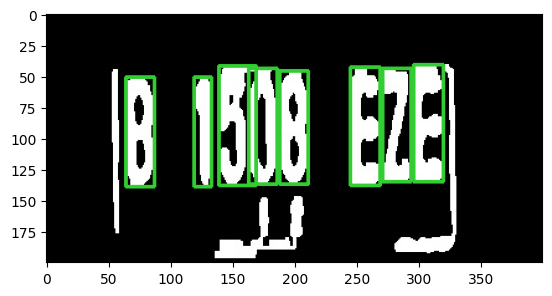

670
B1253BAC


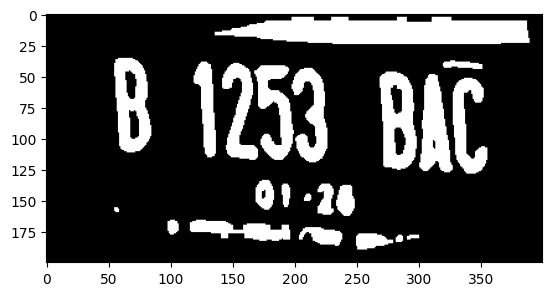

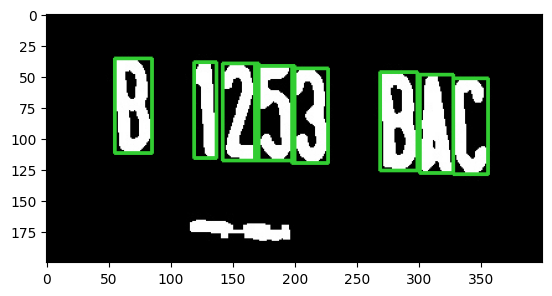

675
B121PQO


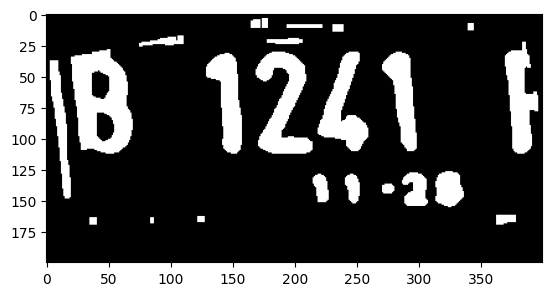

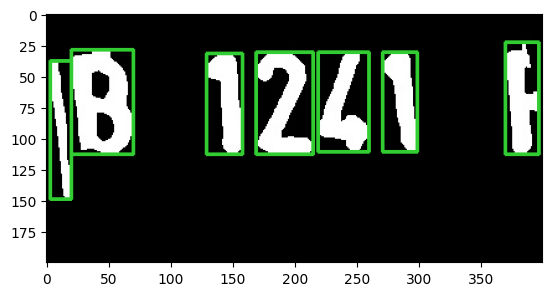

676
B1633BW


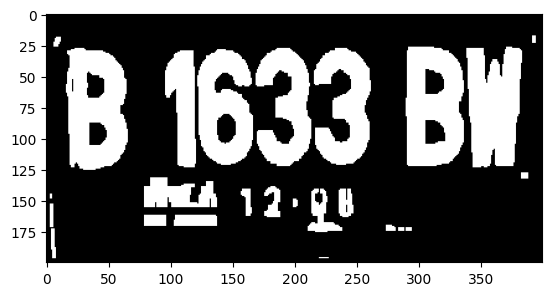

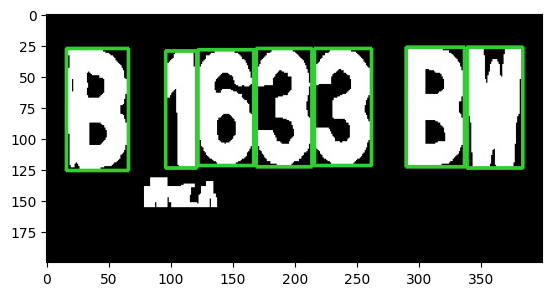

678
B1672KVF


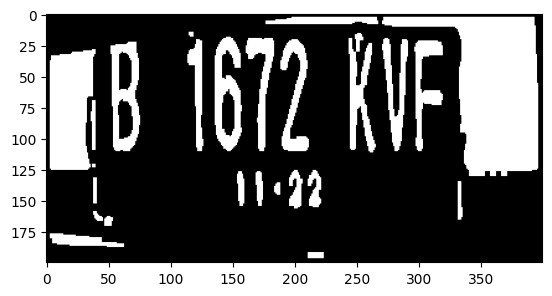

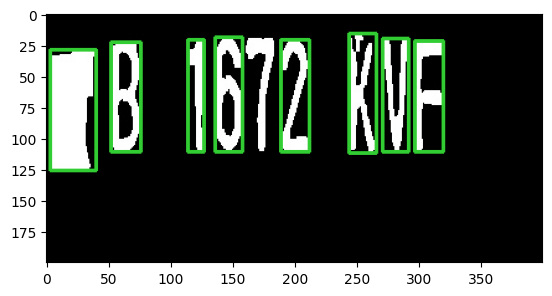

685
B1670TLR


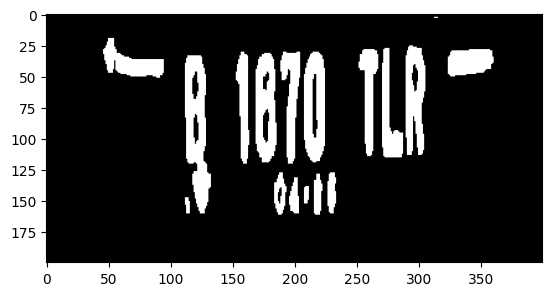

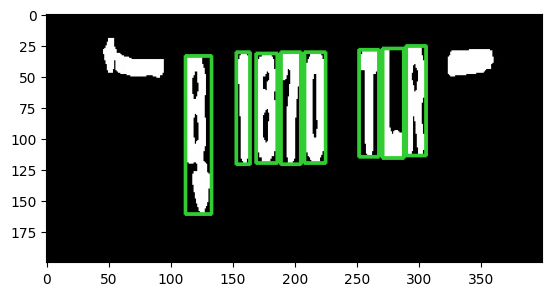

688
B1229EYO


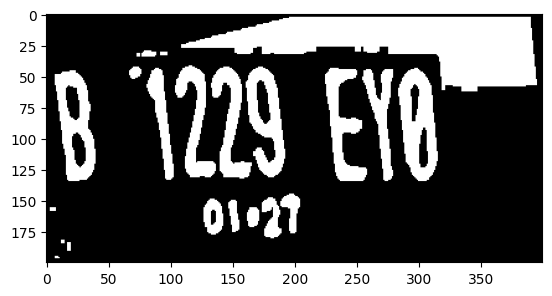

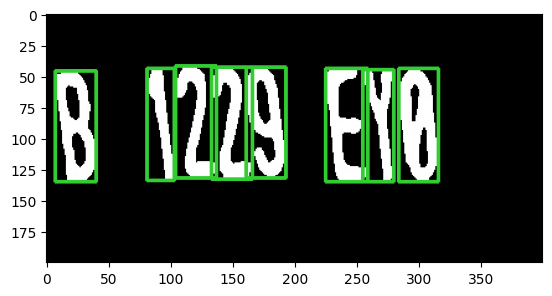

693
B1682SJI


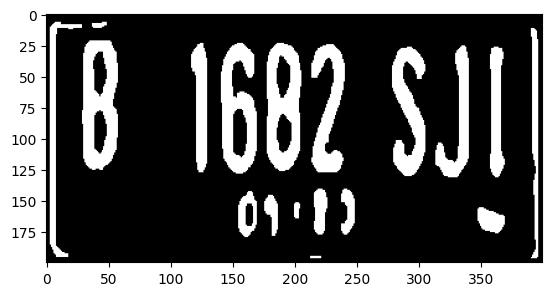

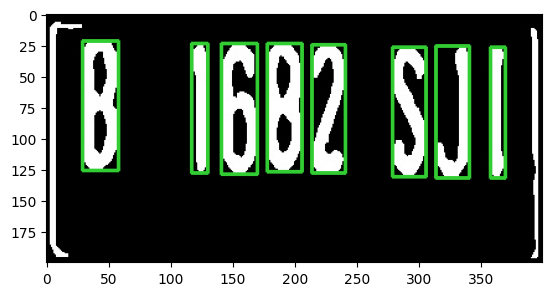

698
B1658YU


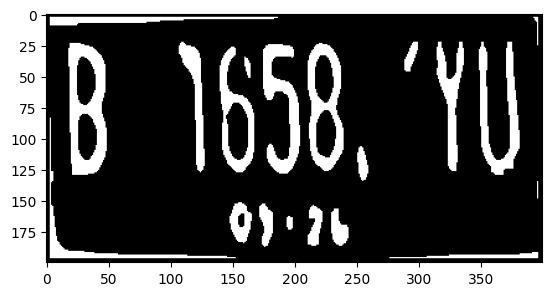

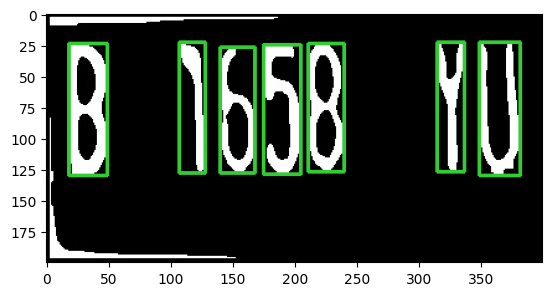

707
B1239TJP


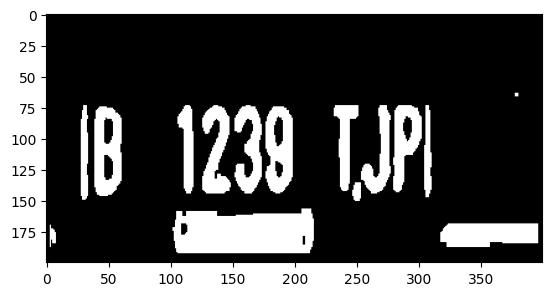

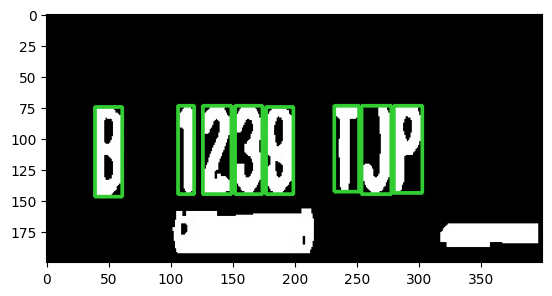

710
B1672KVF


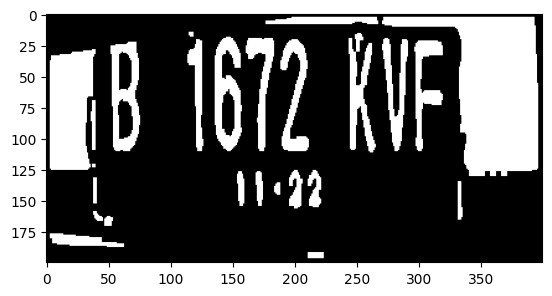

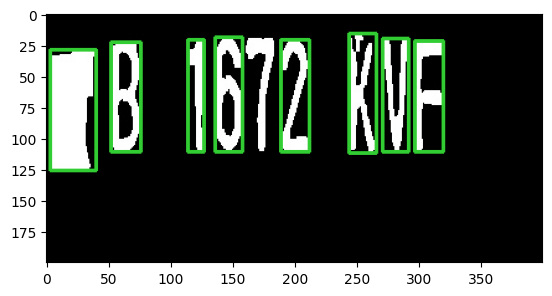

712
B1767TJR


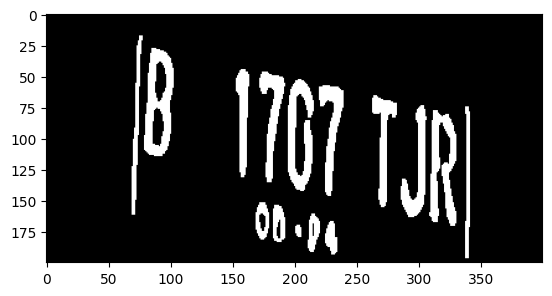

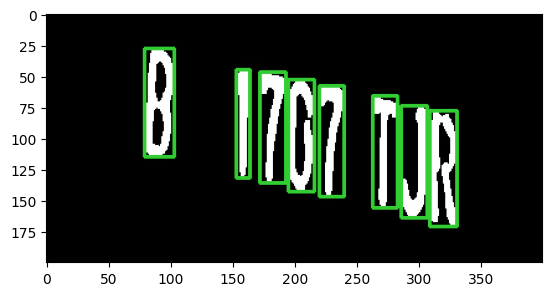

715
B1603BVK


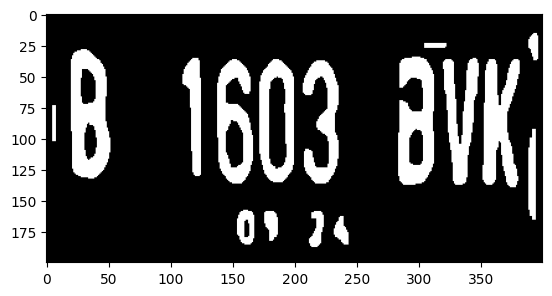

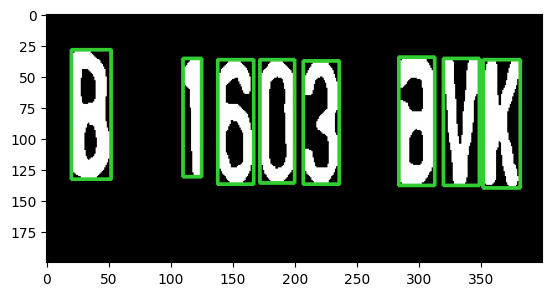

725
B1310EMS


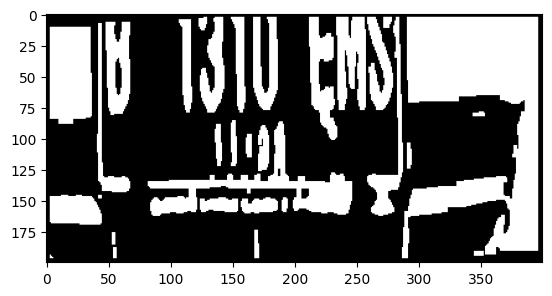

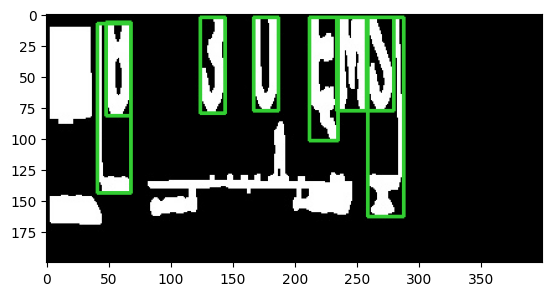

727
B1543VOS


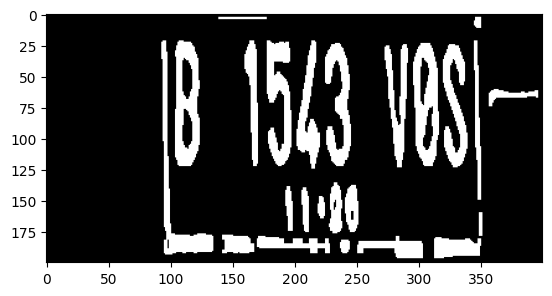

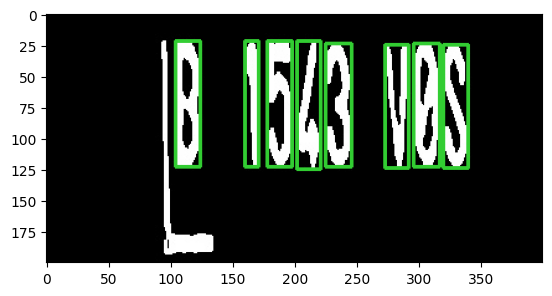

730
AD9112BZ


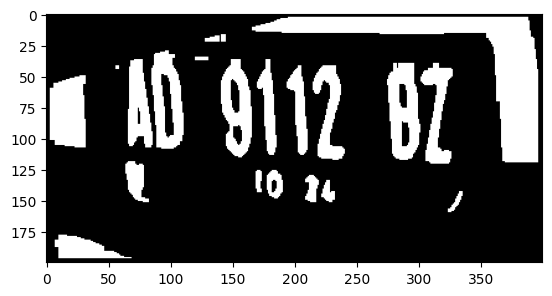

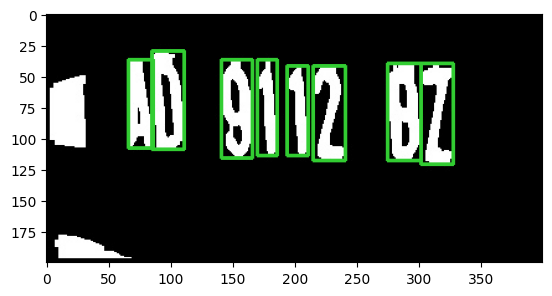

739
B1336PIZ


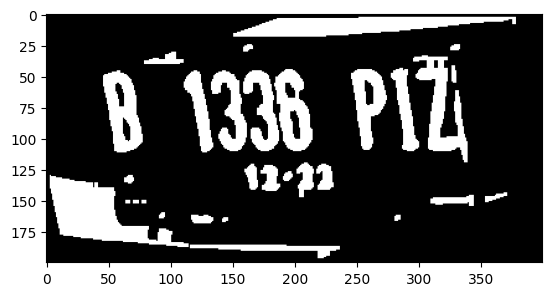

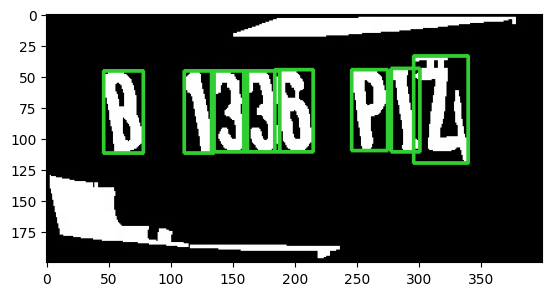

740
B1860KQ


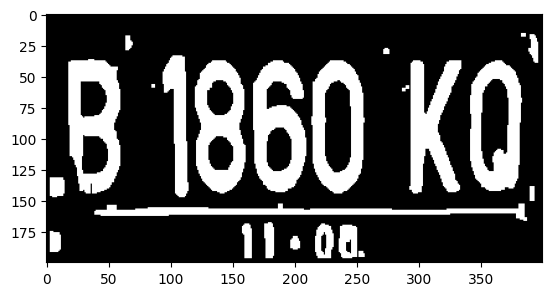

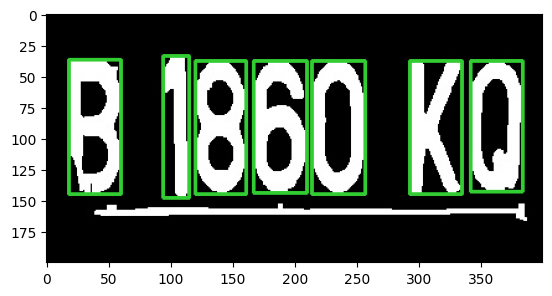

744
B1038TZC


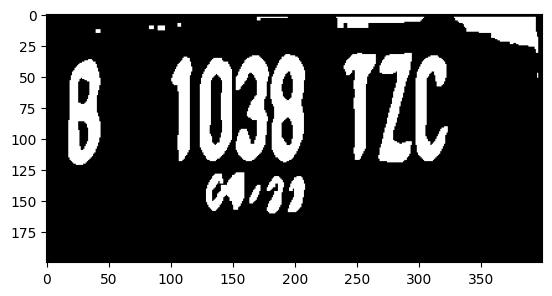

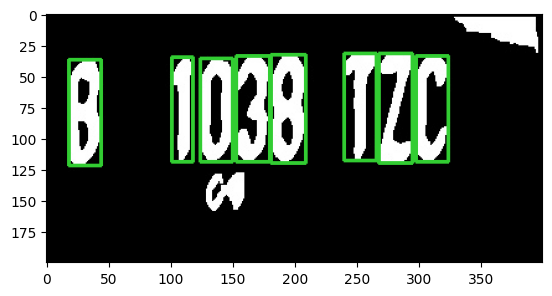

745
B1614TJR


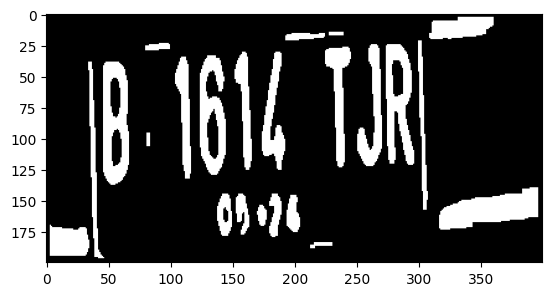

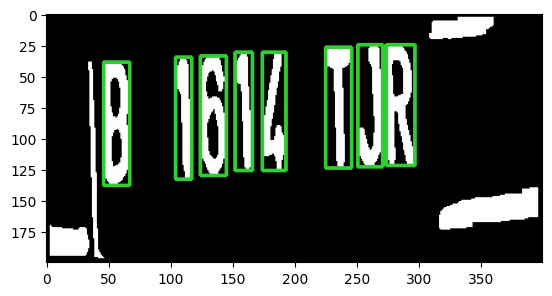

747
AB6315SE


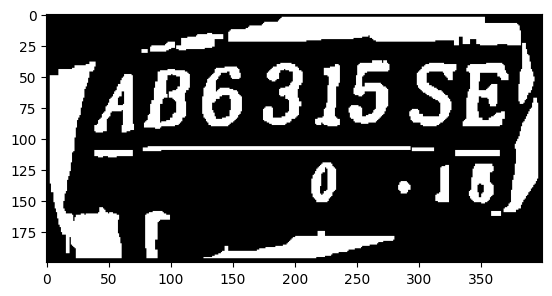

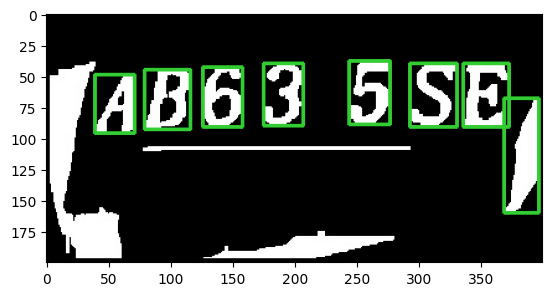

751
B1977QZ


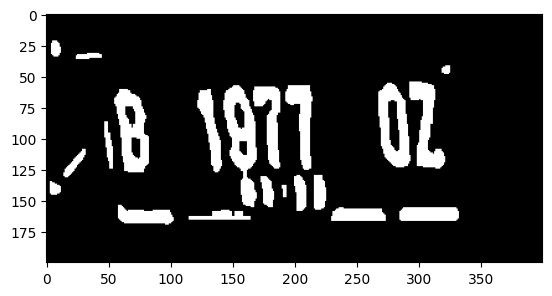

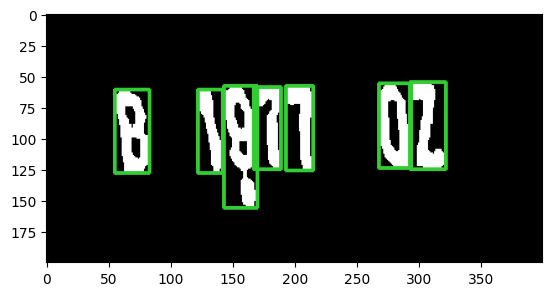

752
B1481UJV


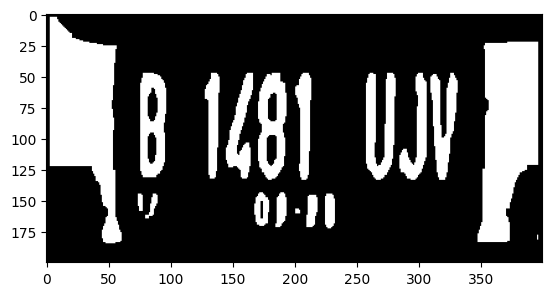

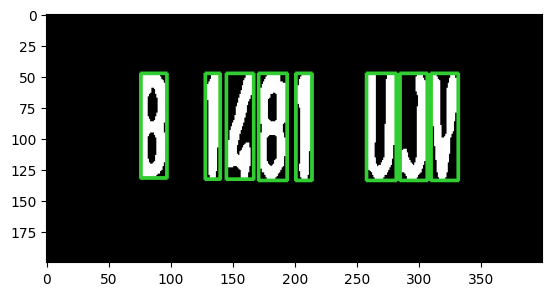

753
B1076Y


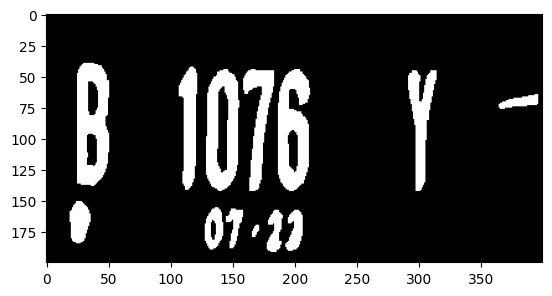

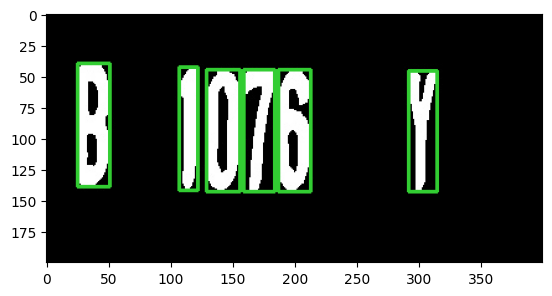

756
B1975FEA


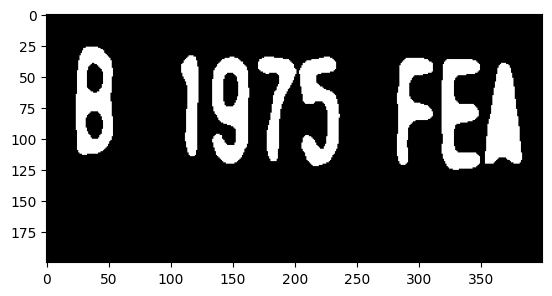

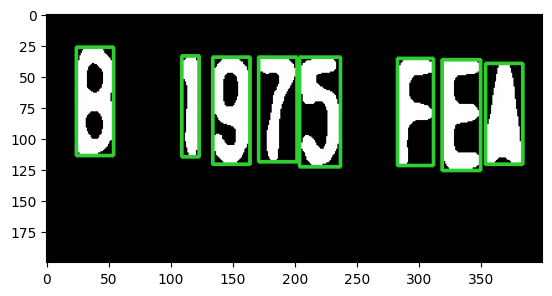

757
B1682PJN


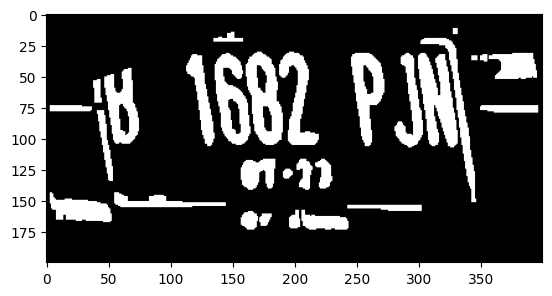

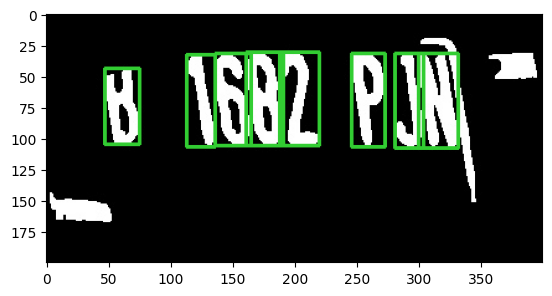

759
B13NST


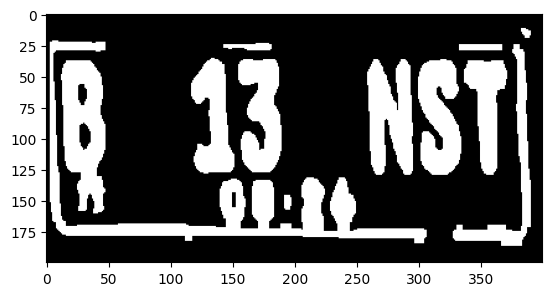

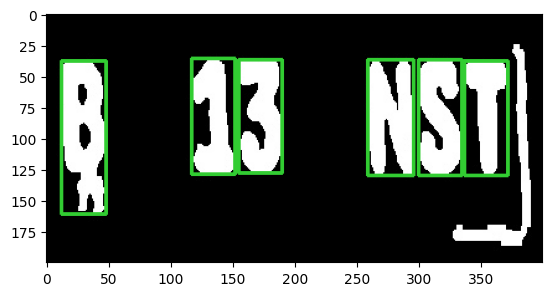

764
B1502SYQ


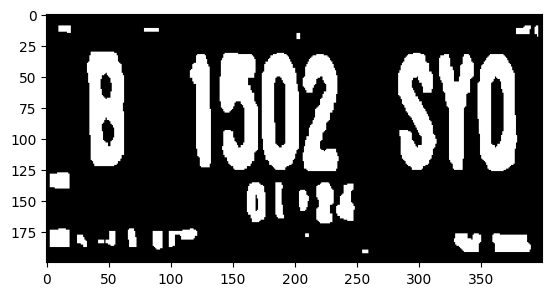

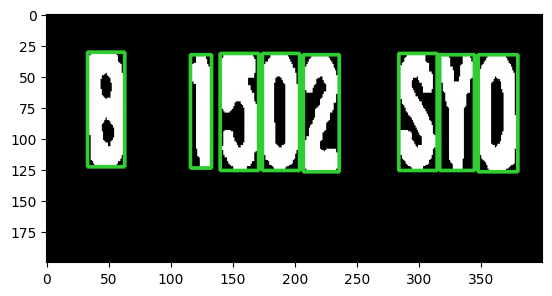

765
B1330NK


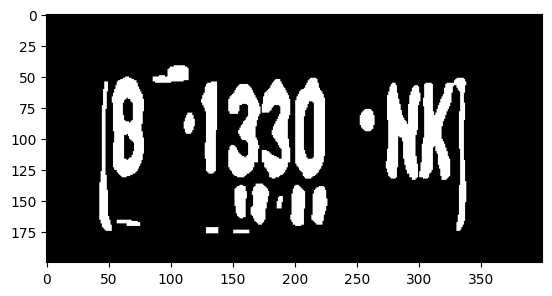

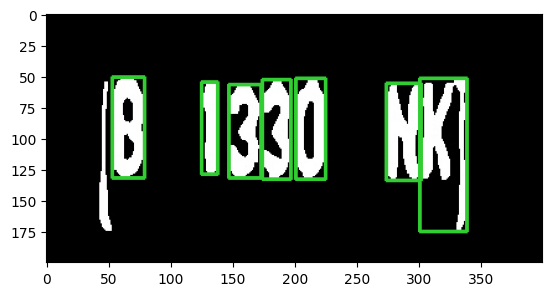

766
B1877TJV


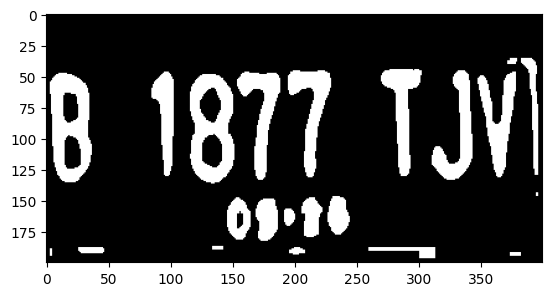

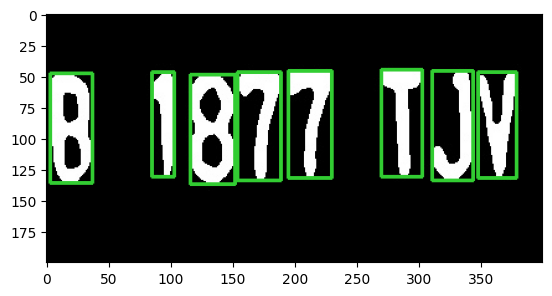

768
AD9112BZ


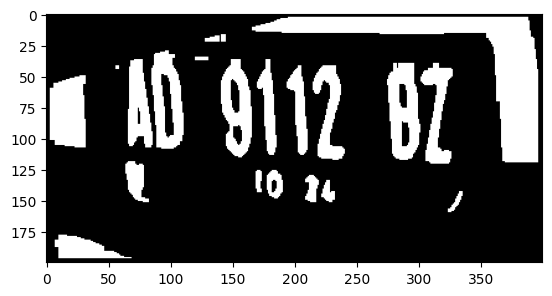

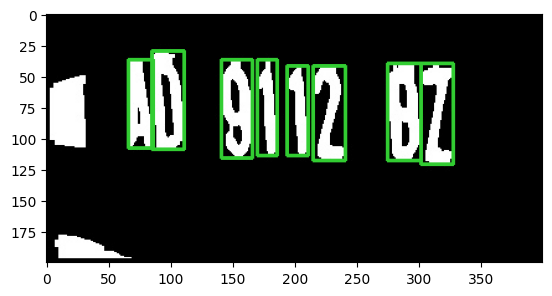

770
B1330NK


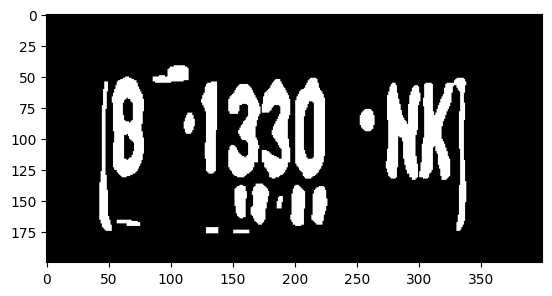

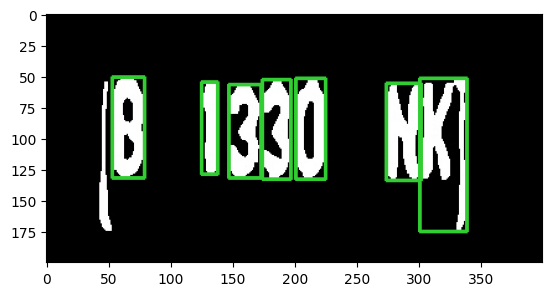

783
B1538ELS


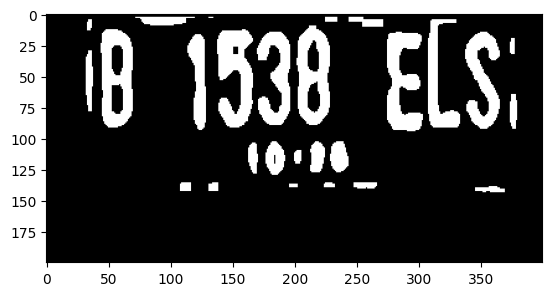

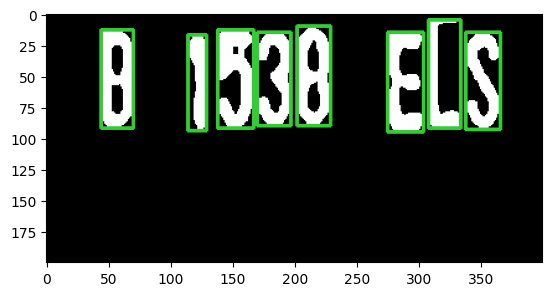

786
B1913TIS


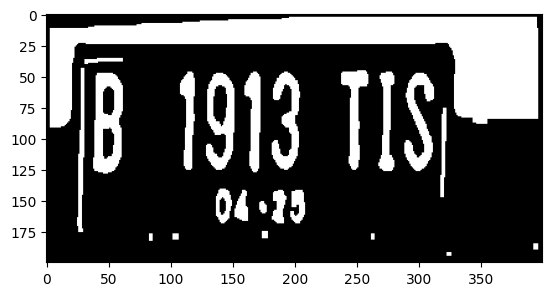

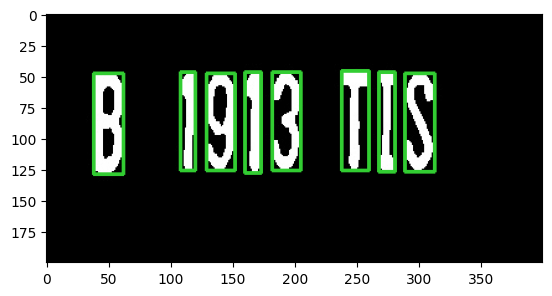

789
AB1473RI


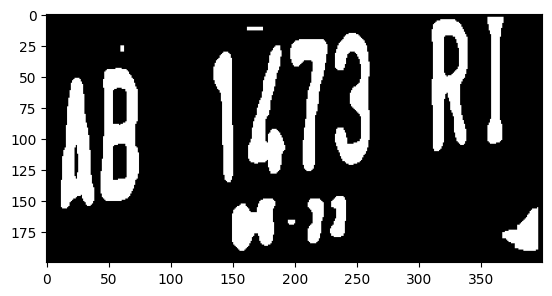

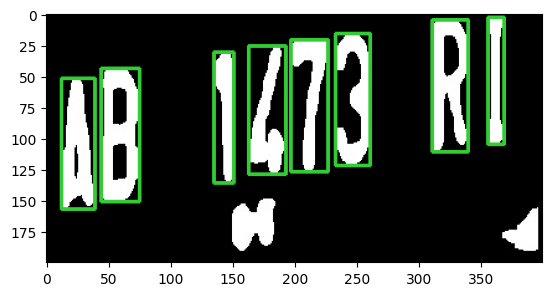

790
B1802EOZ


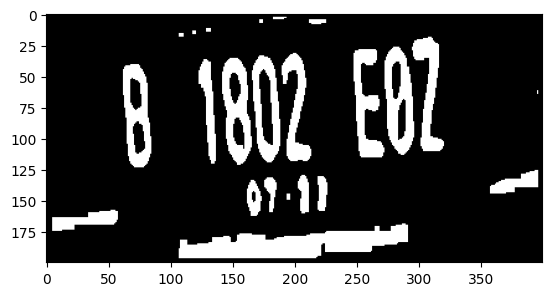

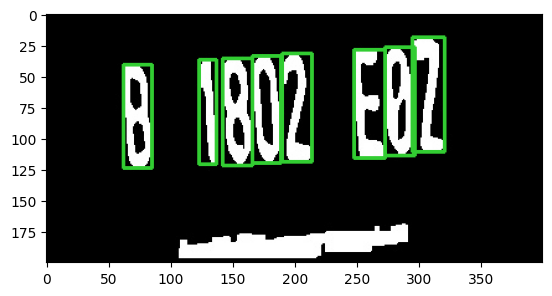

793
AB1364AN


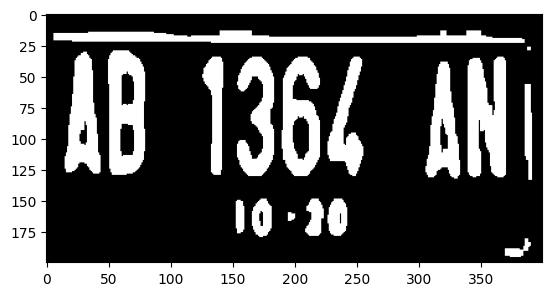

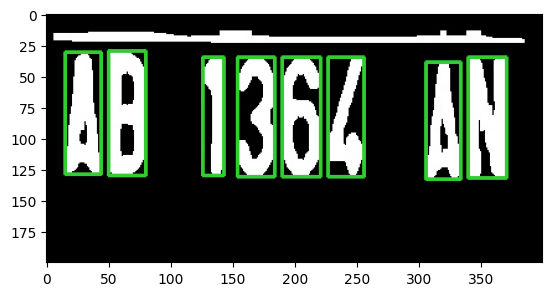

795
B1677EJC


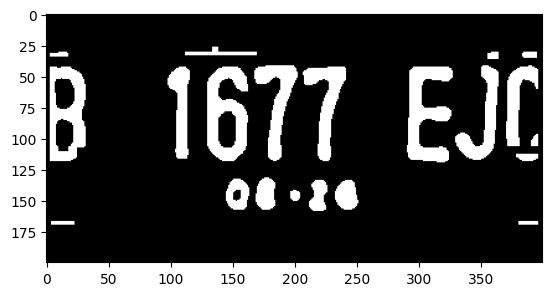

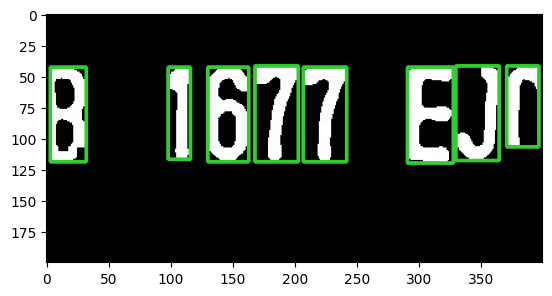

In [ ]:
for i in range (800):
    if(i in perfect):
      print(i)
      print(data.Vehicleregistrationplate[i])
      img = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Train for BDC 2023 - Penyisihan/'+data.NameofFile[i])
      char = characters_recognition(img)

In [ ]:
for i in range (800):
    if(i in perfect):
        img = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Train for BDC 2023 - Penyisihan/'+data.NameofFile[i])
        char = characters_recognition(img)
        if i == 14 or i == 27:
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/B/tada'+str(i)+str(1)+'.jpg', char[1])
            for j in range (2,8):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j)+'.jpg', char[j])

        elif i == 40 or i == 607:
            for j in range (7):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j)+'.jpg', char[j])
        elif i == 57:
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/B/tada'+str(i)+'0.jpg', char[0])
            for j in range(2,char.shape[0]):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j-1)+'.jpg', char[j-1])

        elif i == 131 or i == 651:
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/B/tada'+str(i)+'0.jpg', char[0])
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/4/tada'+str(i)+'2.jpg', char[2])
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/5/tada'+str(i)+'3.jpg', char[3])
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/W/tada'+str(i)+'4.jpg', char[4])
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/M/tada'+str(i)+'5.jpg', char[5])
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/U/tada'+str(i)+'7.jpg', char[7])

        elif i == 175:
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/B/tada'+str(i)+'1.jpg', char[1])
            for j in range (2, char.shape[0]):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j)+'.jpg', char[j])

        elif i == 193:
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/B/tada'+str(i)+'0.jpg', char[0])
            for j in range (2, char.shape[0]):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j-1)+'.jpg', char[j-1])

        elif i == 196 or i == 307:
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/B/tada'+str(i)+'0.jpg', char[0])
            for j in range(2,8):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j-1)+'.jpg', char[j-1])

        elif i == 225:
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/I/tada'+str(i)+str(7)+'.jpg', char[7])
            for j in range(5):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j)+'.jpg', char[j])

        elif i == 266 or i == 357:
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/8/tada'+str(i)+'4.jpg', char[4])
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/9/tada'+str(i)+'5.jpg', char[5])
            for j in range(3):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j)+'.jpg', char[j])

        elif i == 272:
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/B/tada2720.jpg', char[0])
            for j in range(2,8):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j-1)+'.jpg', char[j-1])

        elif i == 343:
            for j in range(3,char.shape[0]):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j)+'.jpg', char[j])
        elif i == 527:
            cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/B/tada5270.jpg', char[0])
            for j in range(2,char.shape[0]):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j-1)+'.jpg', char[j-1])

        elif i == 547:
            for j in range(2,char.shape[0]):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j-1)+'.jpg', char[j-1])

        elif i == 566:
            for j in range(4):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j)+'.jpg', char[j])

        else:
            for j in range(char.shape[0]):
                x = data.Vehicleregistrationplate[i][j]
                cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/' + x + '/tada'+str(i)+str(j)+'.jpg', char[j])

In [ ]:
#gambar untuk X terlalu sedikit, maka akan diambil secara manual
img = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Train for BDC 2023 - Penyisihan/'+data.NameofFile[14])
char = characters_recognition(img)
cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/X/tada147.jpg', char[6])

img = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Train for BDC 2023 - Penyisihan/'+data.NameofFile[27])
char = characters_recognition(img)
cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/X/tada277.jpg', char[6])

img = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Train for BDC 2023 - Penyisihan/'+data.NameofFile[354])
char = characters_recognition(img)
cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/X/tada3546.jpg', char[6])

img = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Train for BDC 2023 - Penyisihan/'+data.NameofFile[575])
char = characters_recognition(img)
cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/X/tada5756.jpg', char[6])

#gambar untuk C juga akan ditambahkan
img = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Train for BDC 2023 - Penyisihan/'+data.NameofFile[104])
char = characters_recognition(img)
cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/C/tada1045.jpg', char[5])

img = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Train for BDC 2023 - Penyisihan/'+data.NameofFile[189])
char = characters_recognition(img)
cv2.imwrite('/content/drive/MyDrive/Big Data Challenge/Data/C/tada1892.jpg', char[2])

True

# Model Training

In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
data_path = glob.glob('/content/drive/MyDrive/Big Data Challenge/Data/**/*.jpg')

X = []
labels = []

for img_path in data_path:
  image = keras.utils.load_img(img_path)
  image = keras.utils.img_to_array(image)
  X.append(image)
  label = img_path.split(os.path.sep)[-2]
  labels.append(label)

X = np.array(X,dtype="float16")
labels = np.array(labels)

print("[INFO] Found "+str(len(X))+" images and "+str(len(set(labels)))+" labels")

[INFO] Found 873 images and 36 labels


In [ ]:
encoder = preprocessing.LabelEncoder()
encoder.fit(labels)
labels = encoder.transform(labels)
y = keras.utils.to_categorical(labels)

(trainX, testX, trainY, testY) = train_test_split(X, y, test_size=0.10, stratify=y, random_state=42)

image_generator = ImageDataGenerator(rotation_range=10,
                              width_shift_range=0.1,
                              height_shift_range=0.1,
                              shear_range=0.1,
                              zoom_range=0.1,
                              fill_mode="nearest"
                              )

In [ ]:
model = Sequential([
    layers.Conv2D(filters=32, kernel_size=(5,5), input_shape=(44, 24, 3), activation='relu', padding = 'same'),
    layers.MaxPool2D(pool_size=[2,2]),
    layers.Dropout(0.4),

    layers.Conv2D(filters = 32, kernel_size = 3, activation = 'relu', padding = 'same'),
    layers.MaxPool2D(),
    layers.Dropout(0.5),

    layers.BatchNormalization(),
    layers.Conv2D(filters = 64, kernel_size = 3, activation = 'relu', padding = 'same'),
    layers.Conv2D(filters = 64, kernel_size = 3, activation = 'relu', padding = 'same'),
    layers.MaxPool2D(),

    layers.Flatten(),
    layers.Dense(128, activation = 'relu'),
    layers.Dropout(0.5),
    layers.Dense(36, activation = 'softmax'),
])

Epoch 1/30
392/392 [==============================] - 5s 9ms/step - loss: 3.3191 - accuracy: 0.1839 - val_loss: 2.8637 - val_accuracy: 0.2841
Epoch 2/30
392/392 [==============================] - 3s 8ms/step - loss: 2.9066 - accuracy: 0.2848 - val_loss: 2.1592 - val_accuracy: 0.4318
Epoch 3/30
392/392 [==============================] - 4s 11ms/step - loss: 2.4514 - accuracy: 0.3525 - val_loss: 1.7907 - val_accuracy: 0.5227
Epoch 4/30
392/392 [==============================] - 3s 8ms/step - loss: 2.0524 - accuracy: 0.4521 - val_loss: 1.3397 - val_accuracy: 0.6023
Epoch 5/30
392/392 [==============================] - 3s 8ms/step - loss: 1.8422 - accuracy: 0.5019 - val_loss: 1.2832 - val_accuracy: 0.6250
Epoch 6/30
392/392 [==============================] - 4s 10ms/step - loss: 1.5969 - accuracy: 0.5556 - val_loss: 0.9298 - val_accuracy: 0.6705
Epoch 7/30
392/392 [==============================] - 3s 8ms/step - loss: 1.5138 - accuracy: 0.5670 - val_loss: 0.8844 - val_accuracy: 0.7273
Epoc

<Axes: >

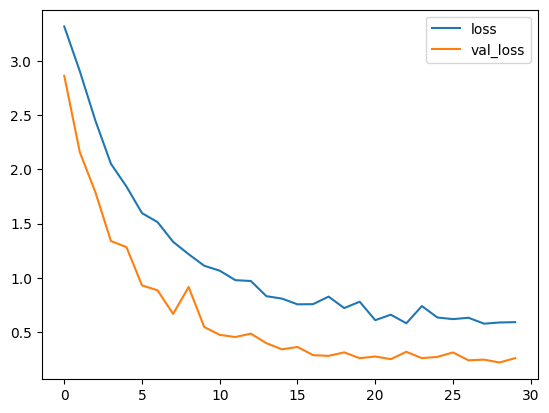

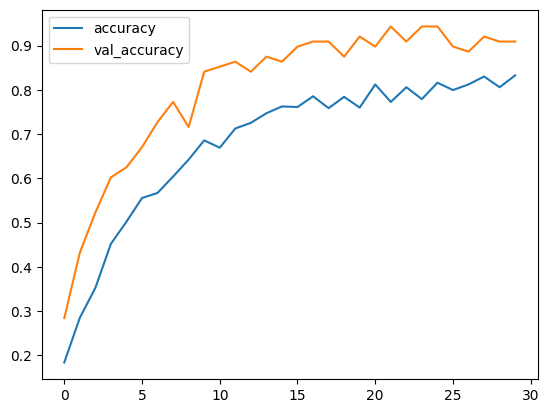

In [ ]:
early_stopping = EarlyStopping(
    monitor = 'val_loss',
    min_delta=0.001,
    patience=5,
    restore_best_weights=True,
)

BATCH_SIZE = 2

model.compile(
    optimizer = "adam",
    loss = 'categorical_crossentropy',
    metrics = ['accuracy'],
)

history = model.fit(image_generator.flow(trainX, trainY, batch_size=BATCH_SIZE),
                   steps_per_epoch=len(trainX) // BATCH_SIZE,
                   validation_data=(testX, testY),
                   validation_steps=len(testX) // BATCH_SIZE,
                   epochs=30, callbacks=[early_stopping])

history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot()
history_df.loc[:, ['accuracy','val_accuracy']].plot()

In [ ]:
model_json = model.to_json()
with open("/content/drive/MyDrive/Big Data Challenge/Risingrocket_character_recognition.json", "w") as json_file:
  json_file.write(model_json)
model.save_weights("/content/drive/MyDrive/Big Data Challenge/Risingrocketweight.h5")
print("[INFO] model saved succesfully...")

[INFO] model saved succesfully...


In [ ]:
json_file = open('/content/drive/MyDrive/Big Data Challenge/Risingrocket_character_recognition.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = keras.models.model_from_json(loaded_model_json)
model.load_weights("/content/drive/MyDrive/Big Data Challenge/Risingrocketweight.h5")
print("[INFO] Model loaded successfully...")

[INFO] Model loaded successfully...


In [ ]:
def predict_from_model(image,model,labels):
    image = np.stack((image,)*3, axis=-1)
    prediction = encoder.inverse_transform([np.argmax(model.predict(image[np.newaxis,:]))])
    return prediction

In [ ]:
plate_number = ''
img = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Train for BDC 2023 - Penyisihan/'+data['NameofFile'][5])
img_test = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Test for BDC 2023 - Penyisihan/'+data_test['Name of File'][0])
char = characters_recognition(img_test)
for i,ch in enumerate(char):
    title = np.array2string(predict_from_model(ch,model,labels))
    plate_number+=title.strip("'[]")

plate_number

1/1 [==============================] - 0s 27ms/step


'AD7034OE'

0


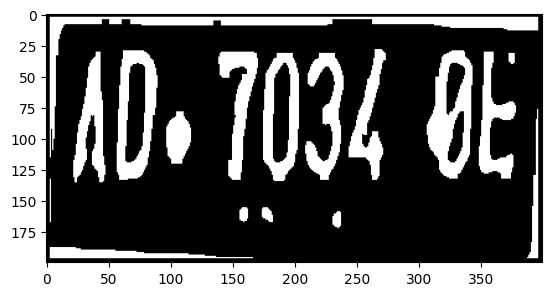

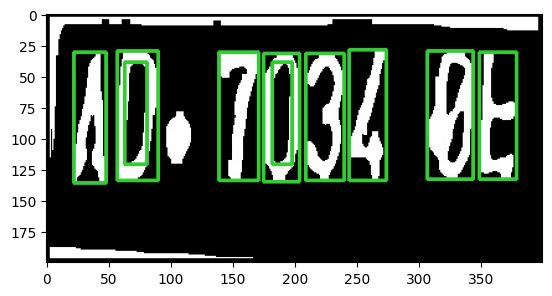

1


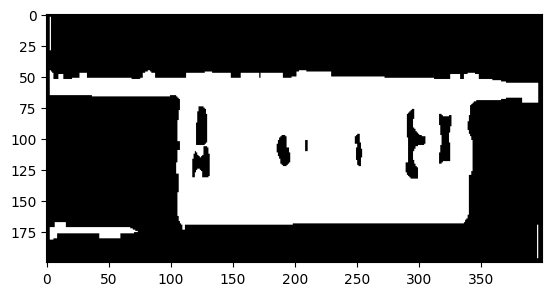

2


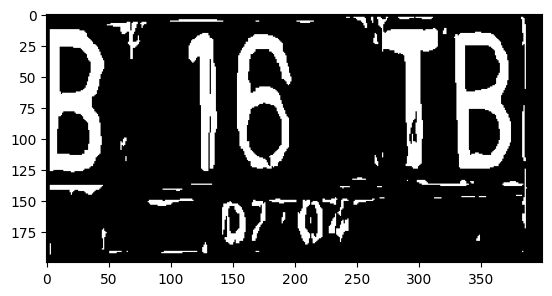

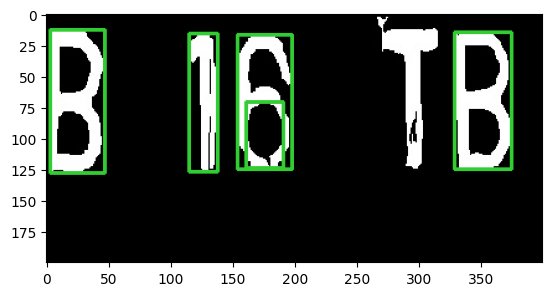

3


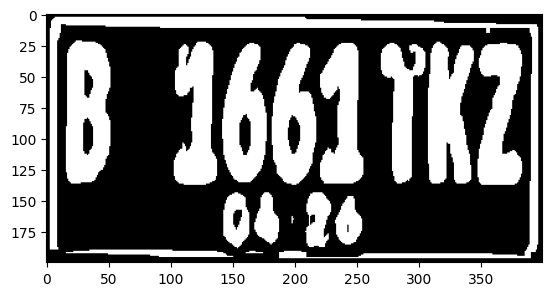

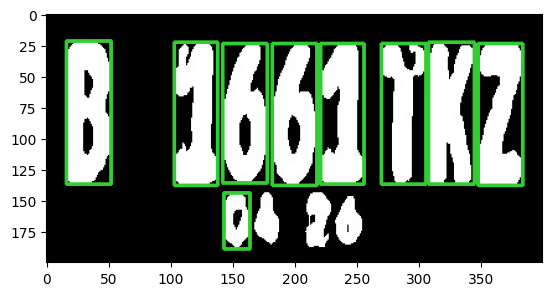

4


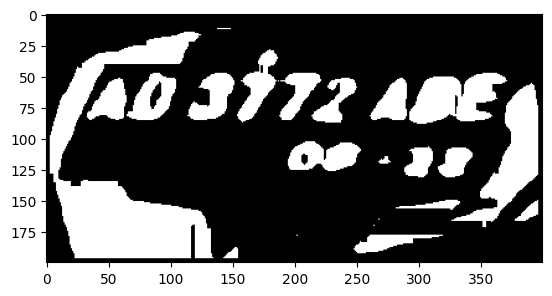

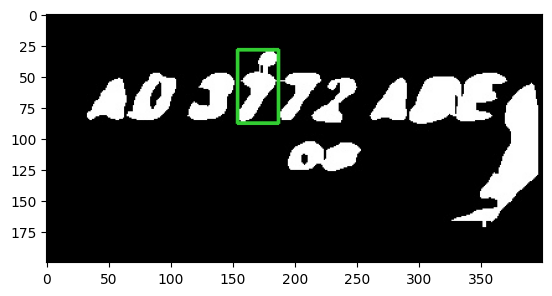

5


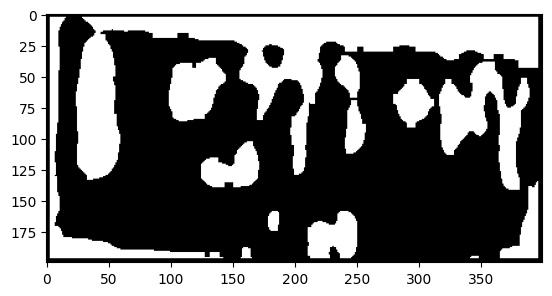

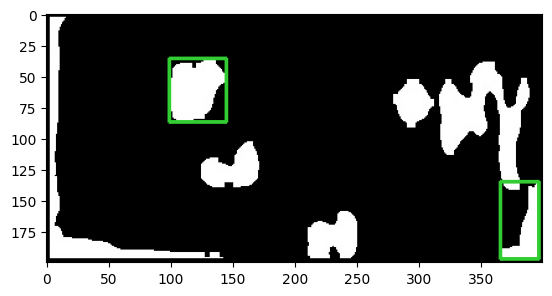

6


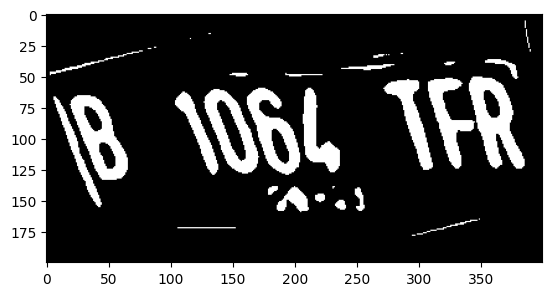

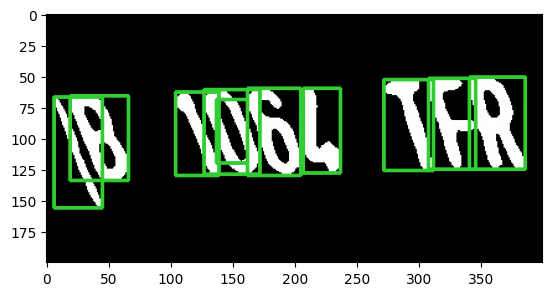

7


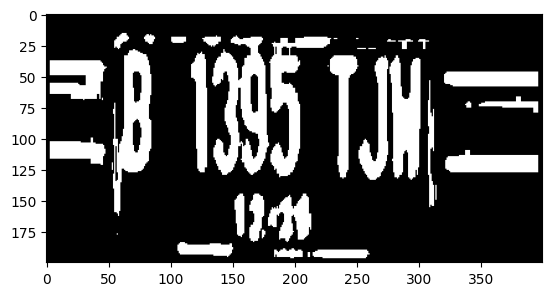

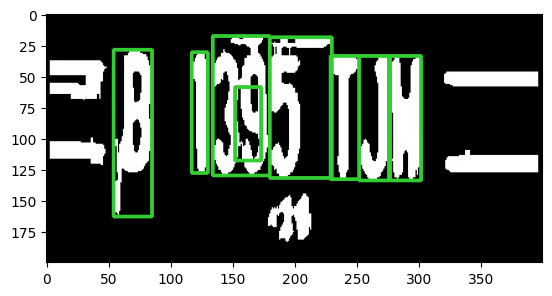

8


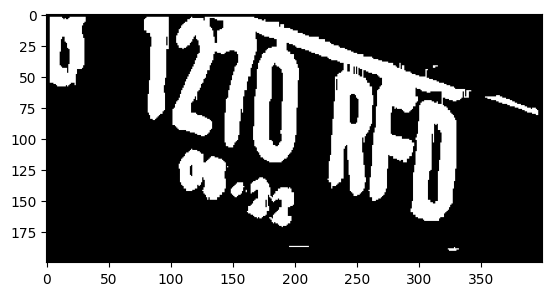

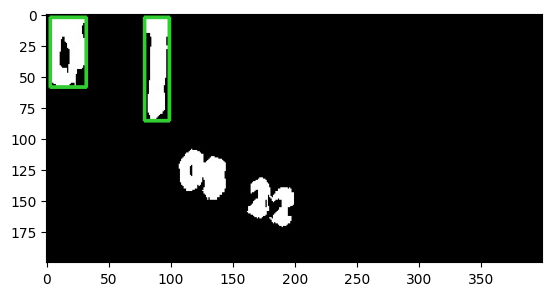

9


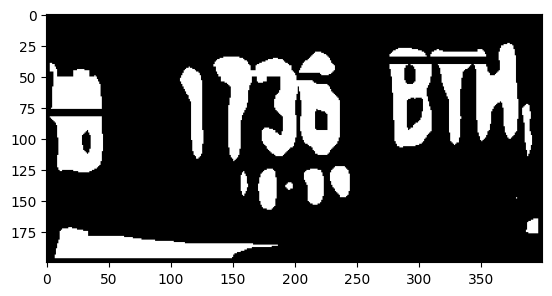

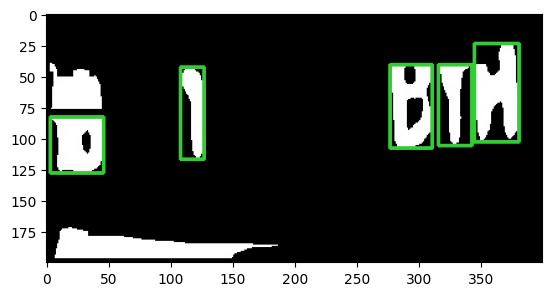

10


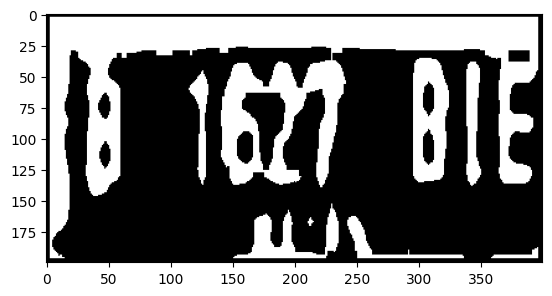

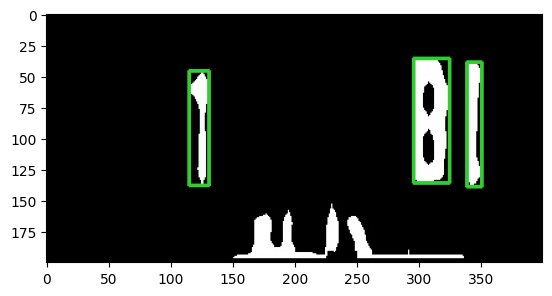

11


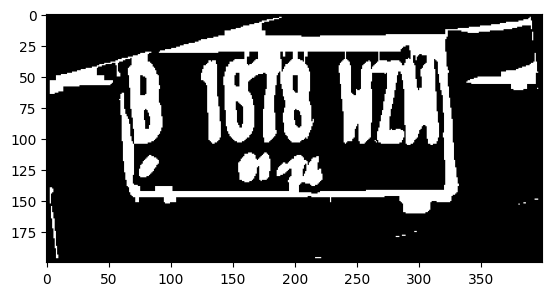

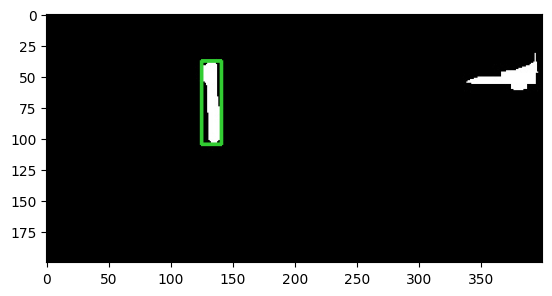

12


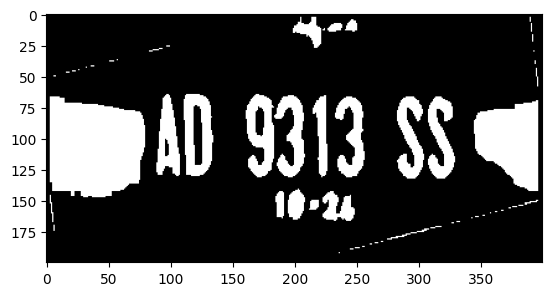

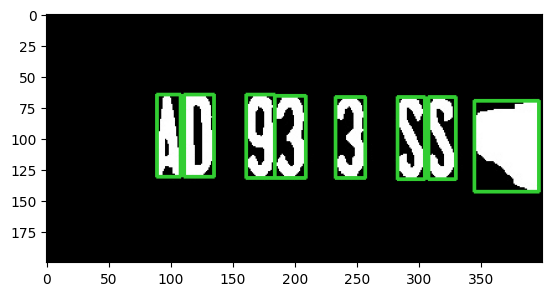

13


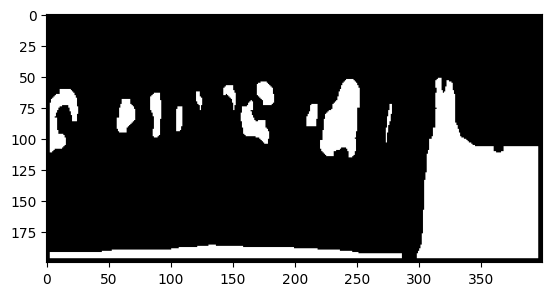

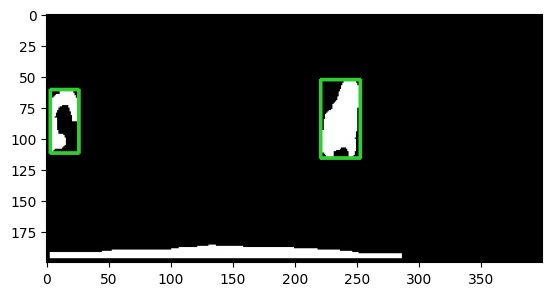

14


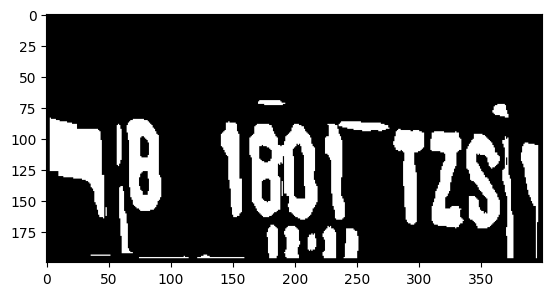

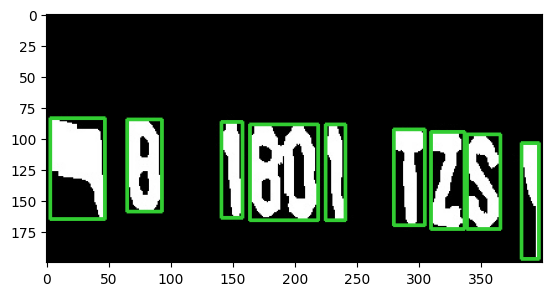

15


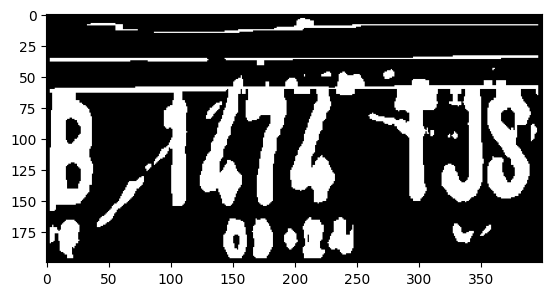

16


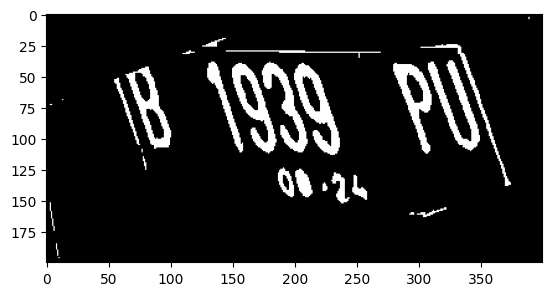

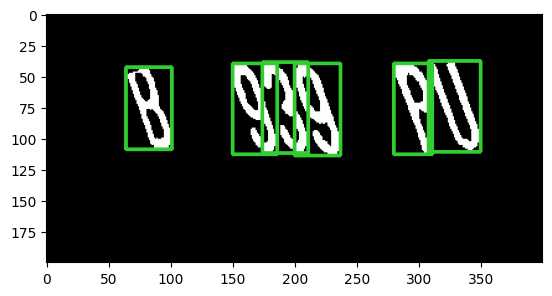

17


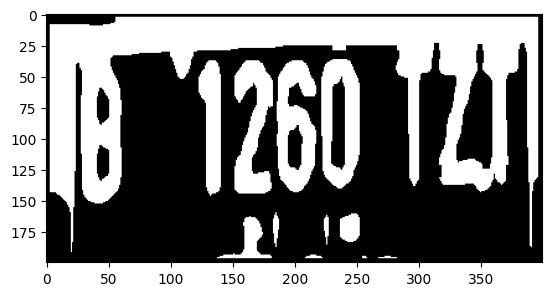

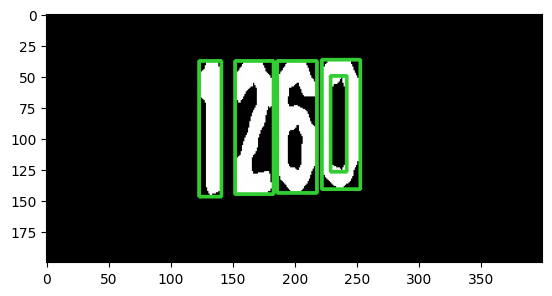

18


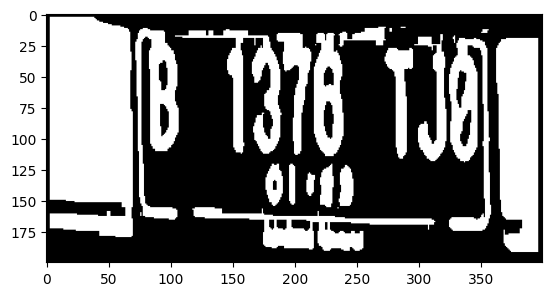

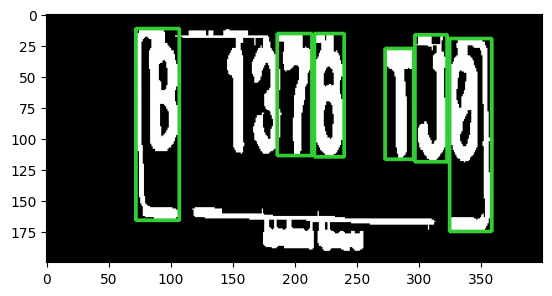

19


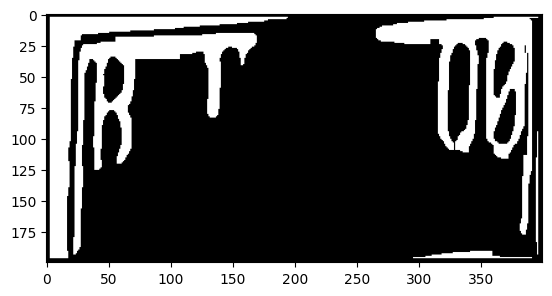

20


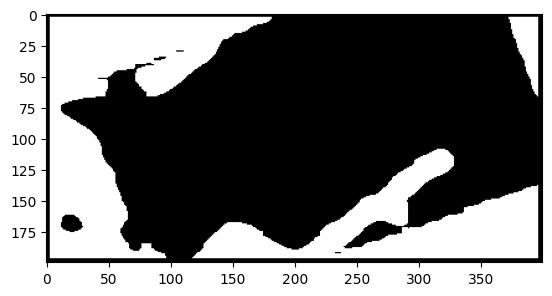

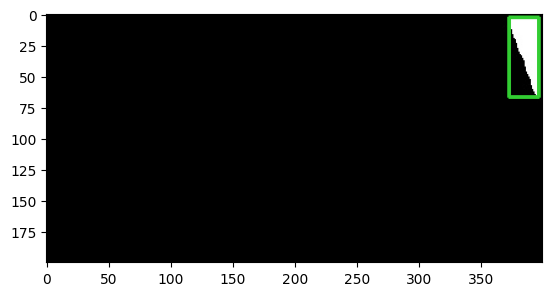

21


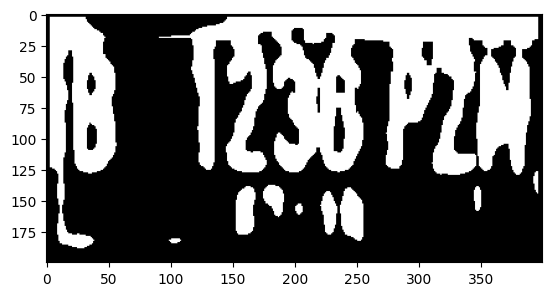

22


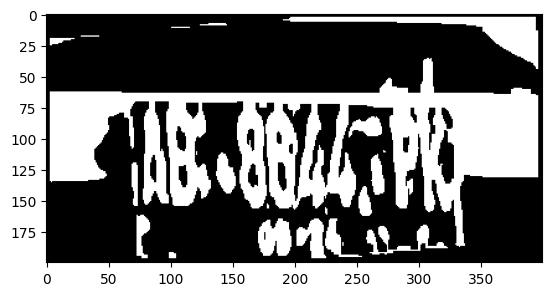

23


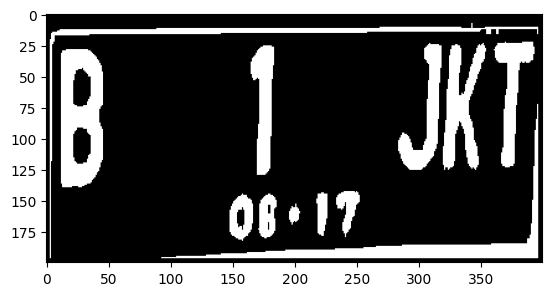

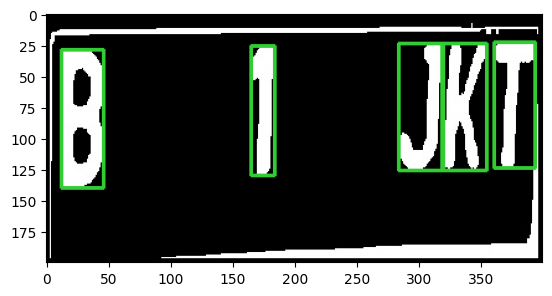

24


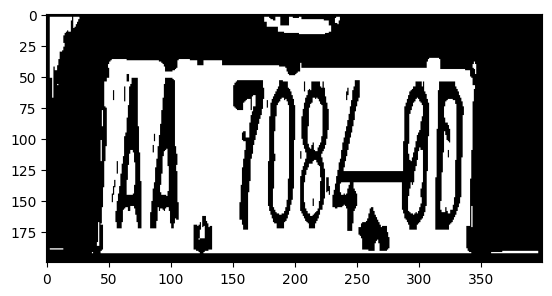

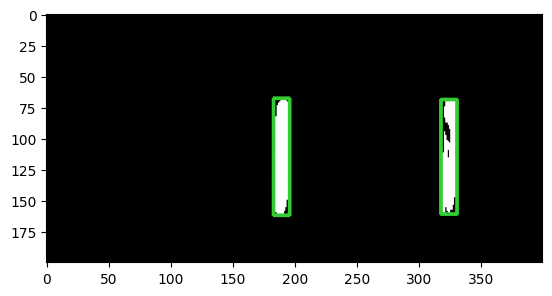

25


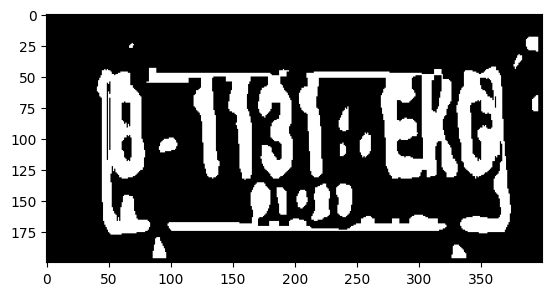

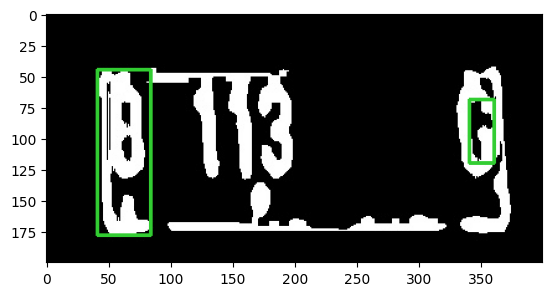

26


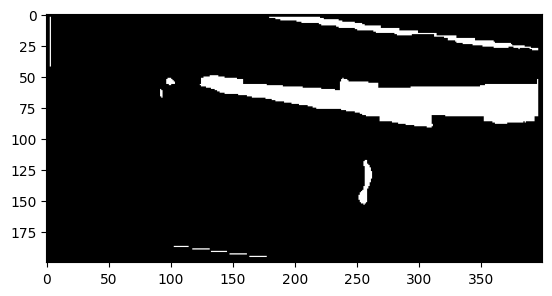

27


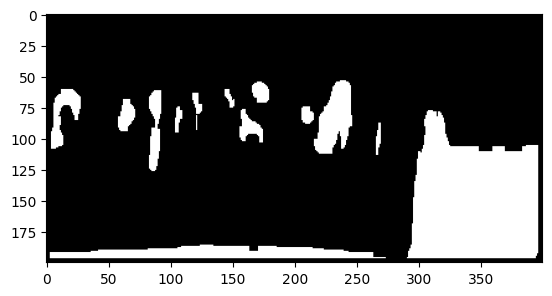

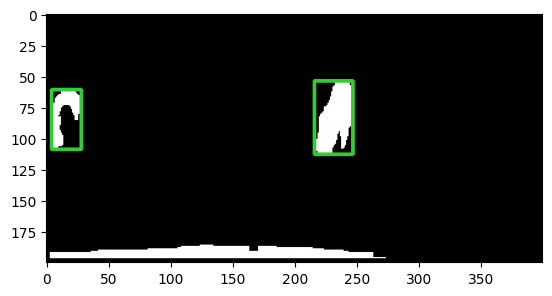

28


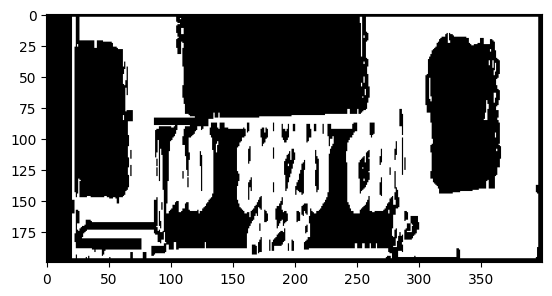

29


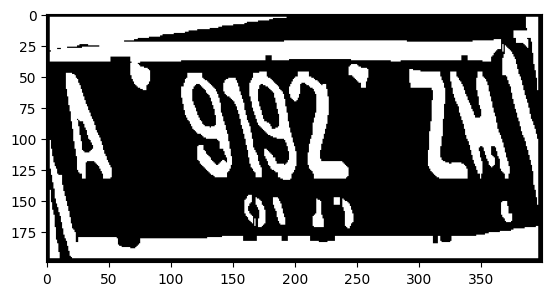

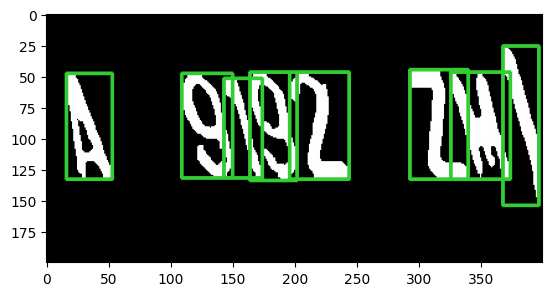

30


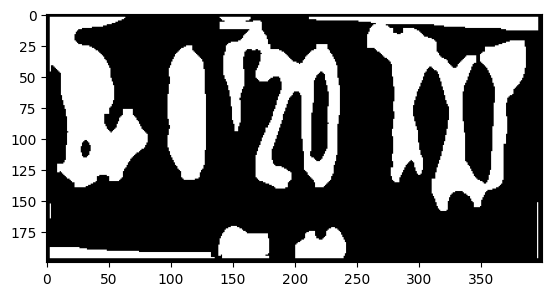

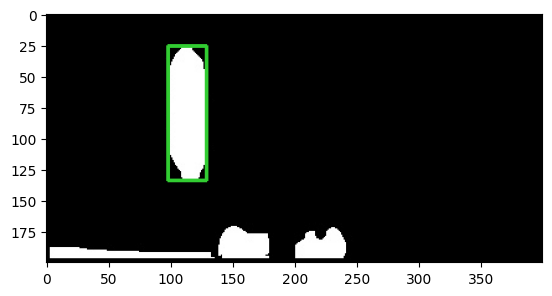

31


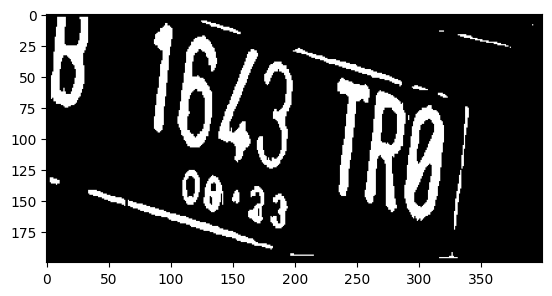

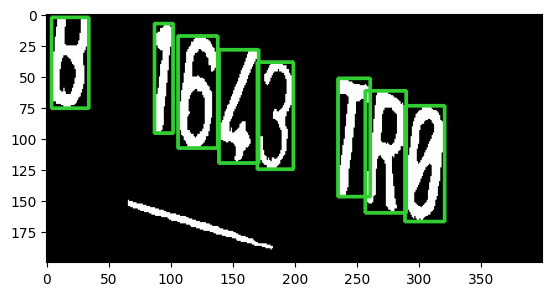

32


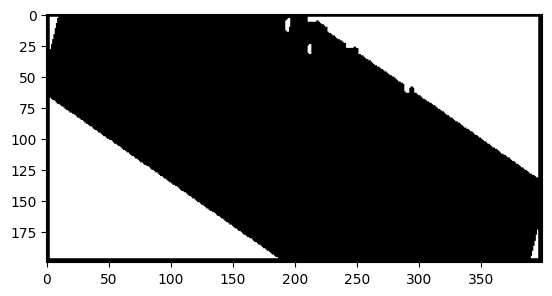

33


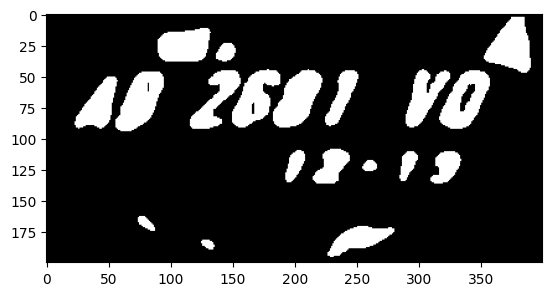

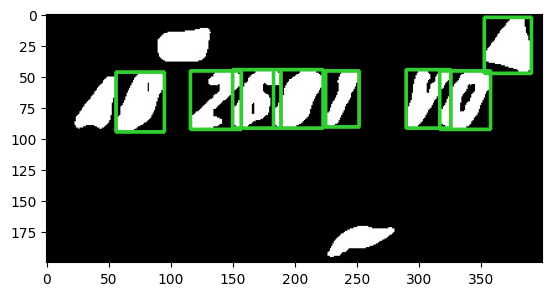

34


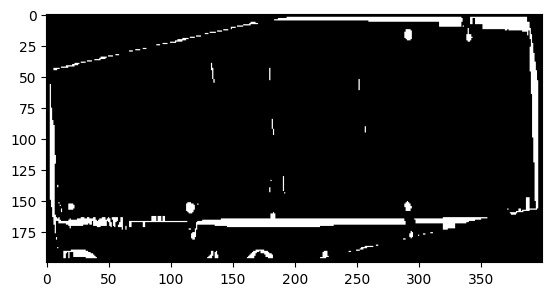

35


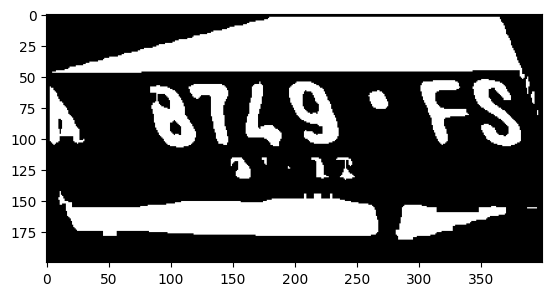

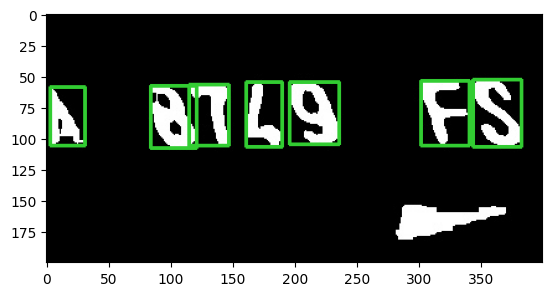

36


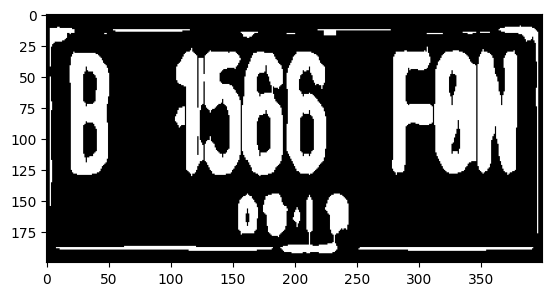

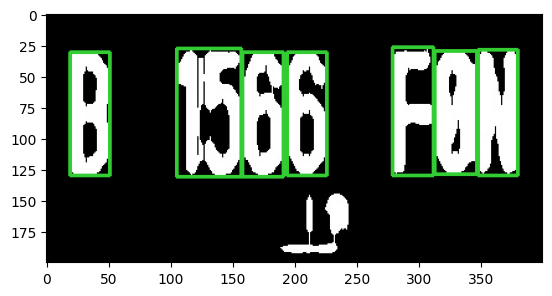

37


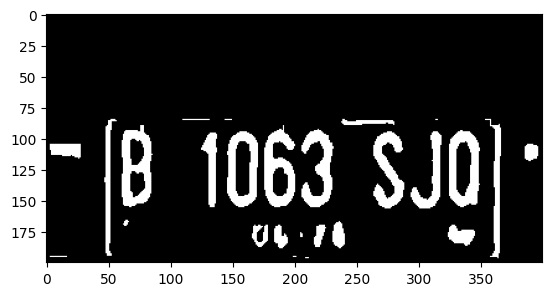

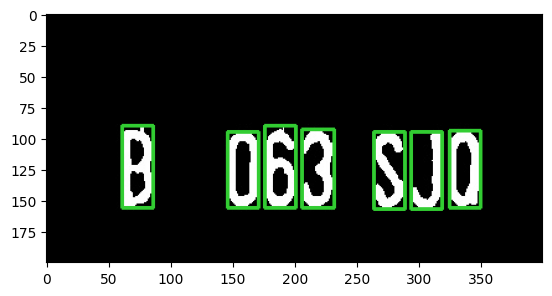

38


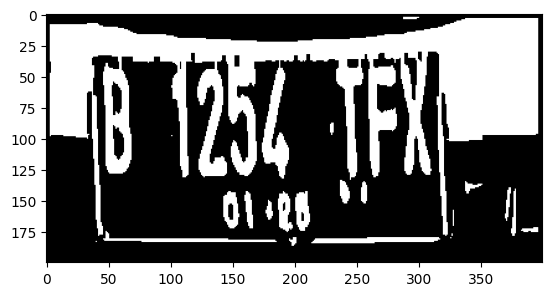

39


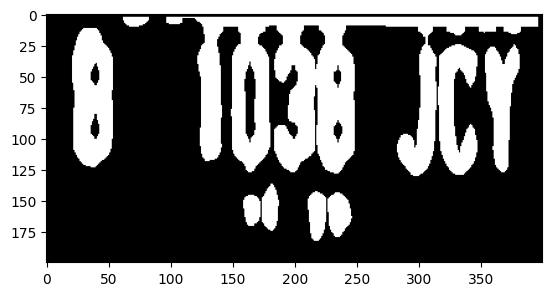

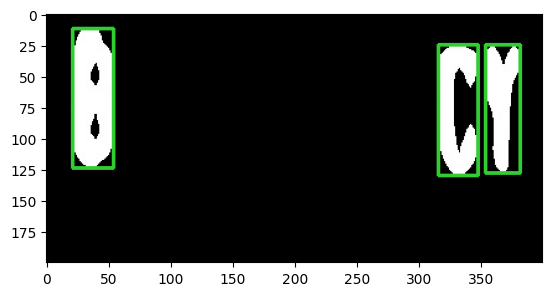

40


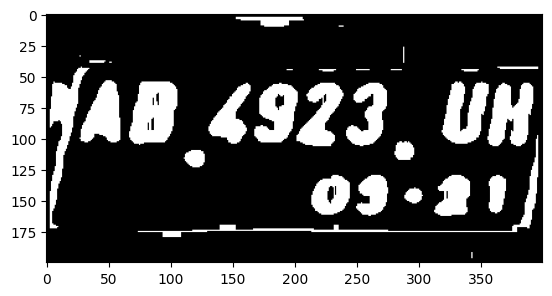

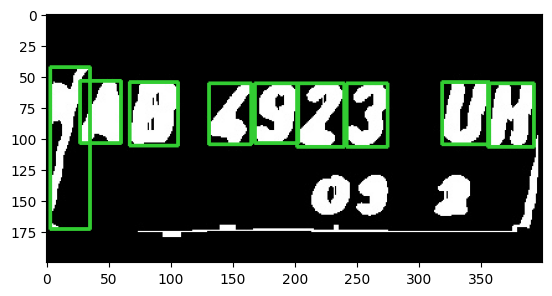

41


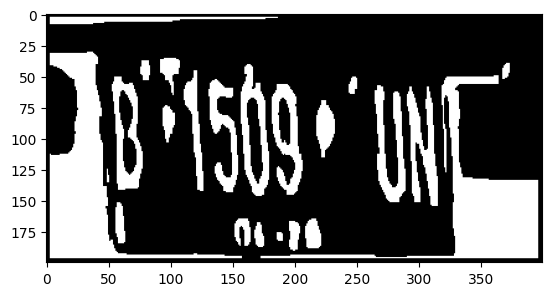

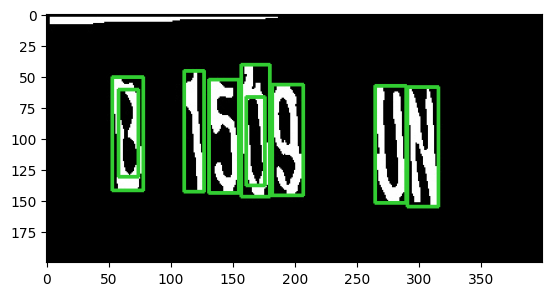

42


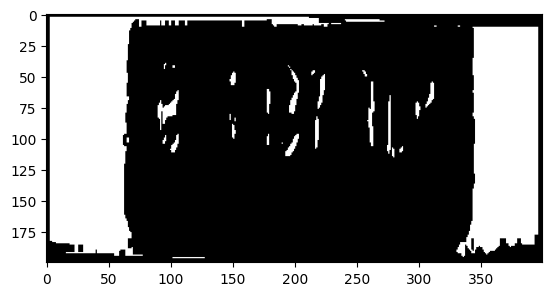

43


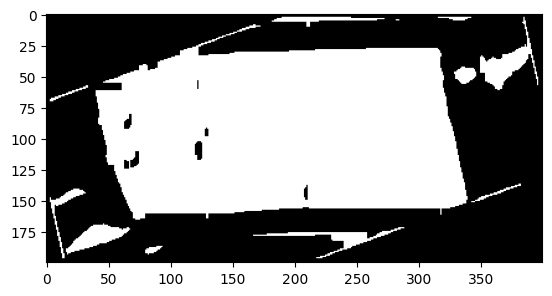

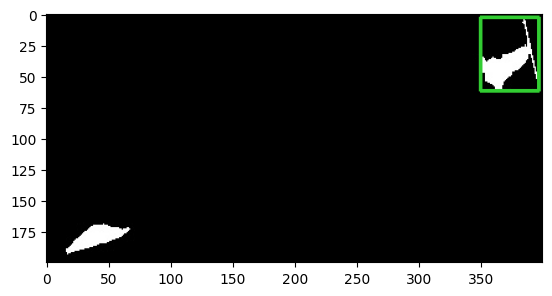

44


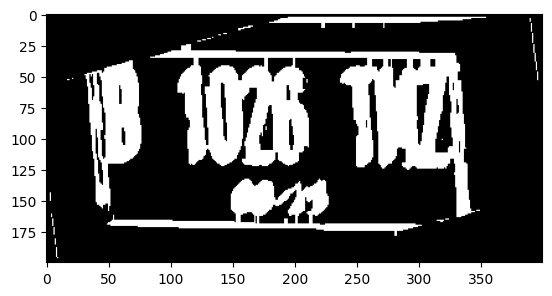

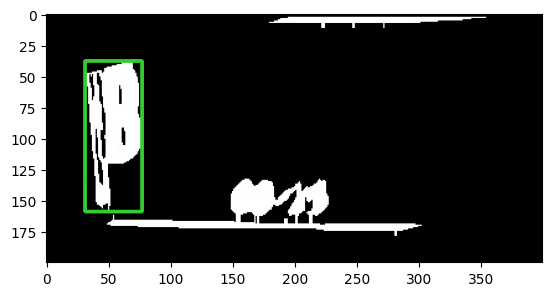

45


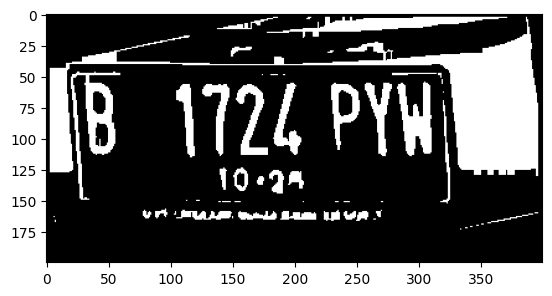

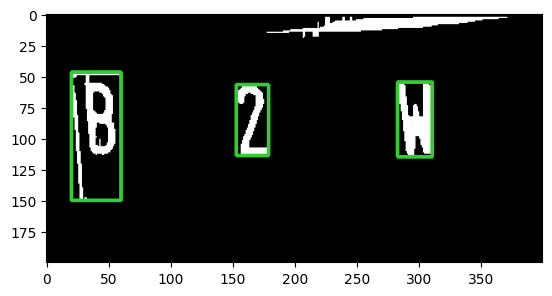

46


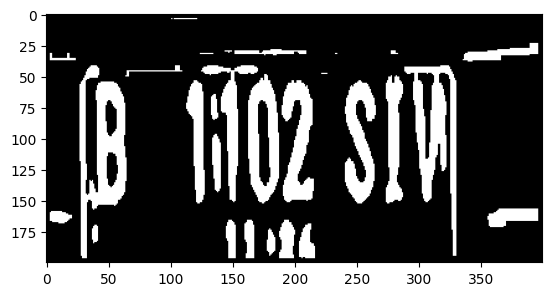

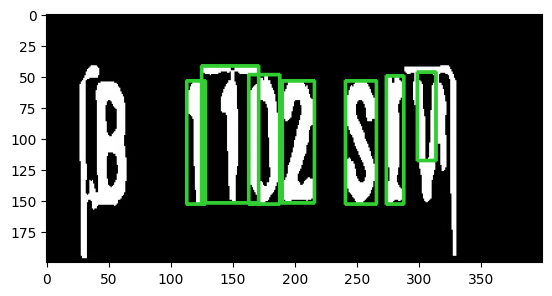

47


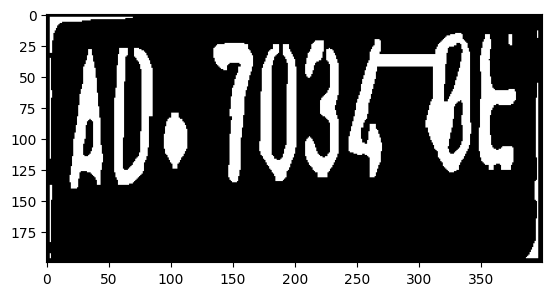

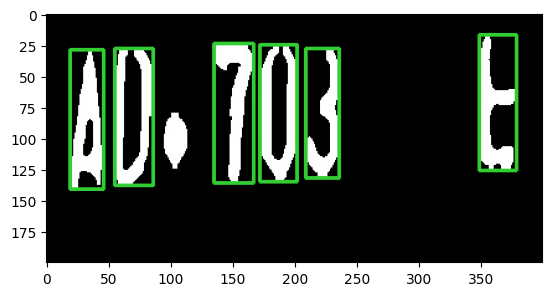

48


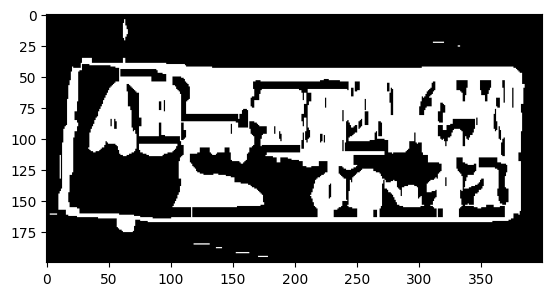

49


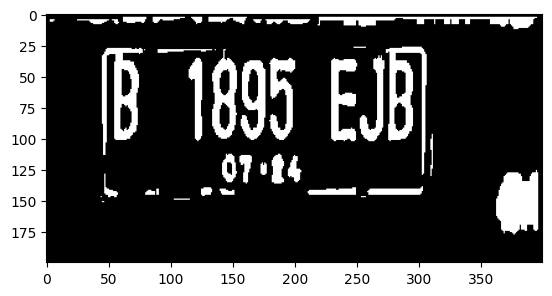

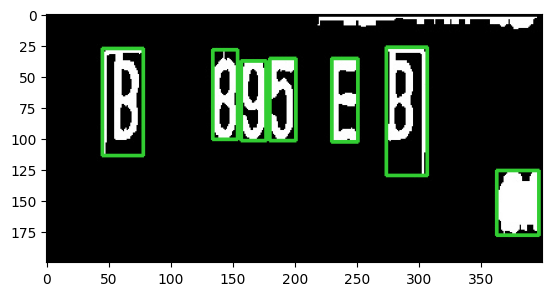

50


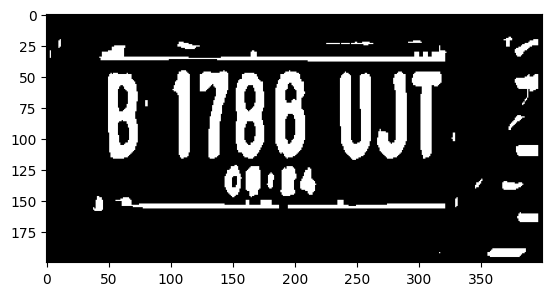

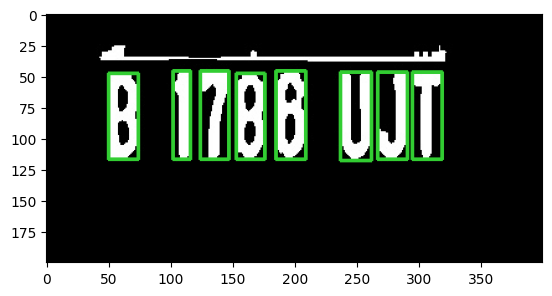

51


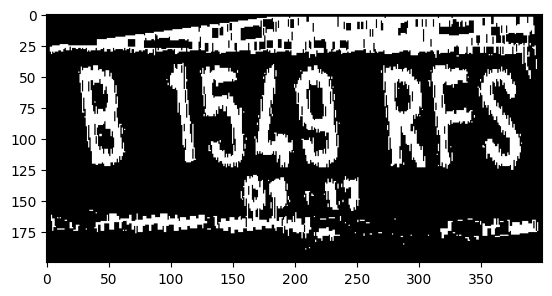

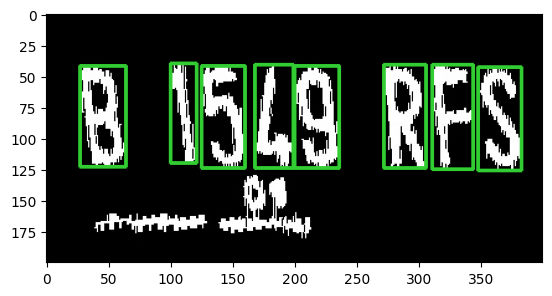

52


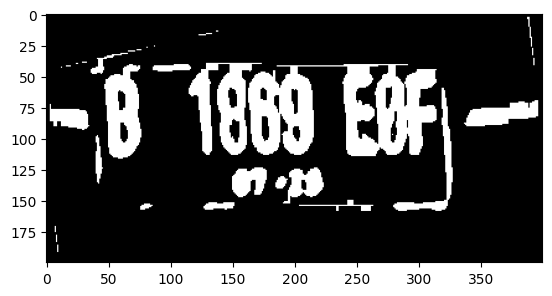

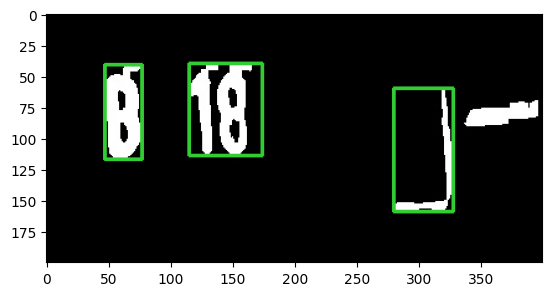

53


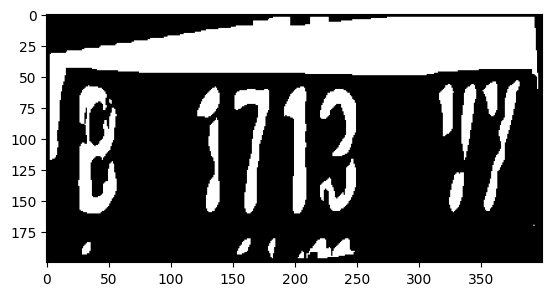

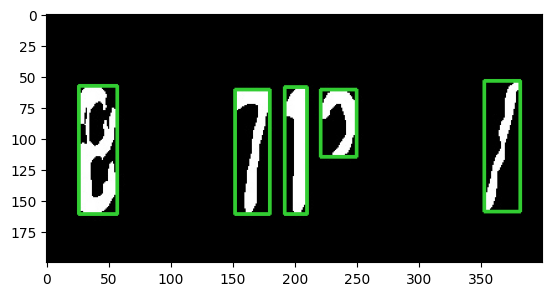

54


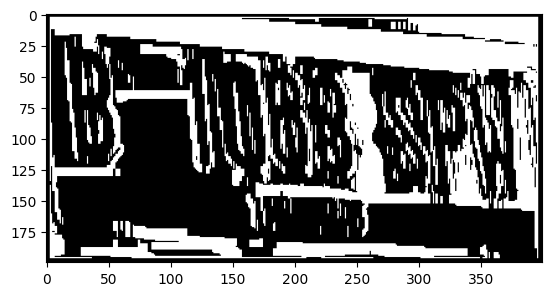

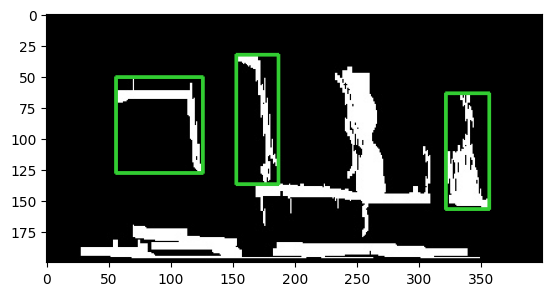

55


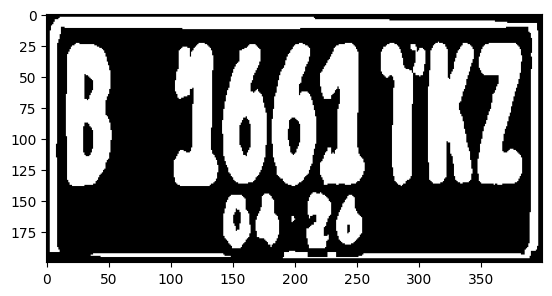

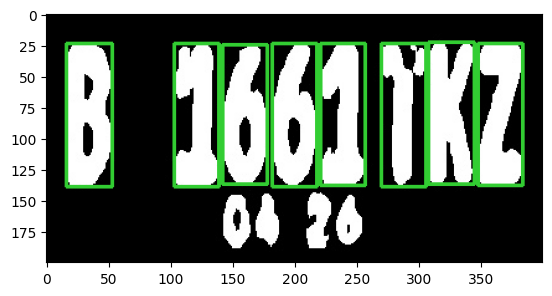

56


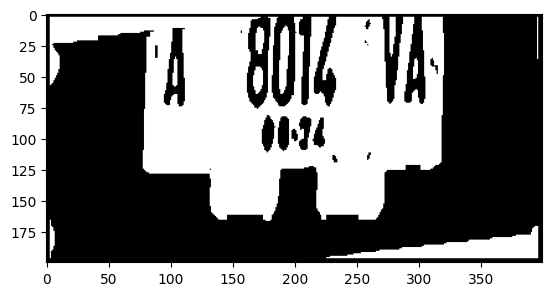

57


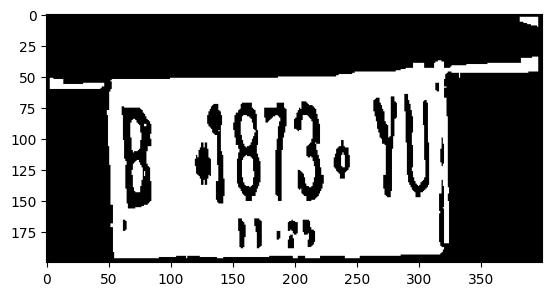

58


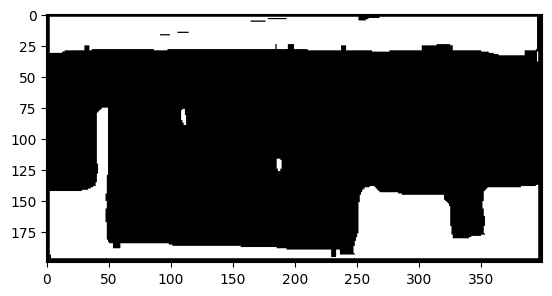

59


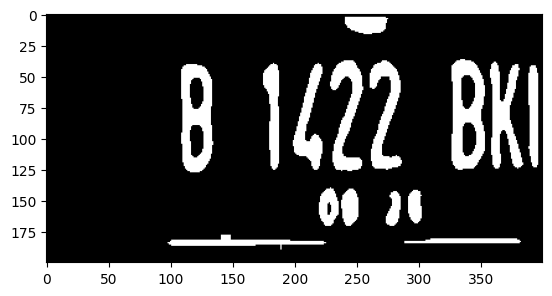

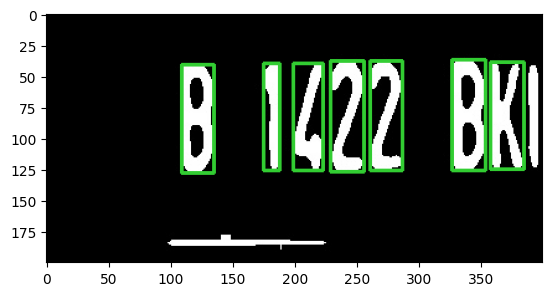

60


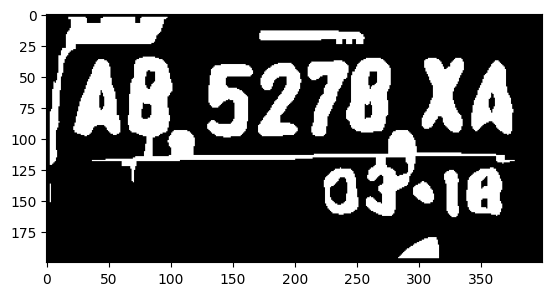

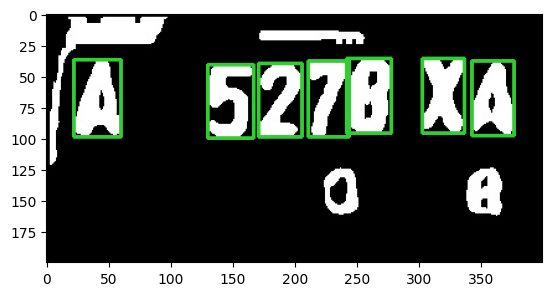

61


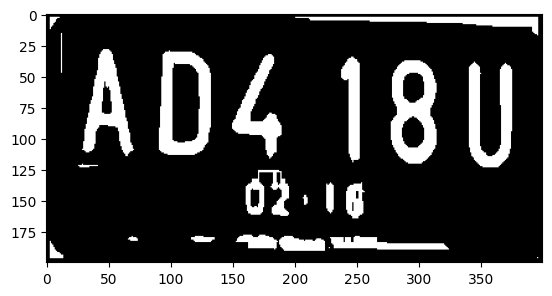

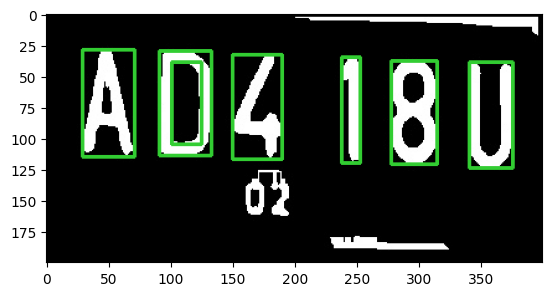

62


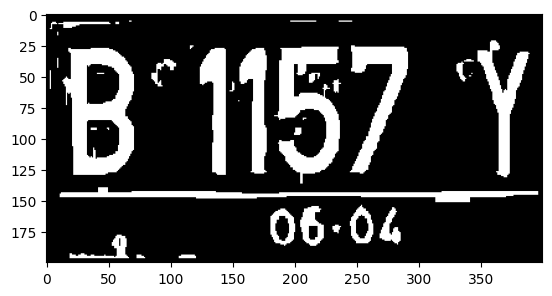

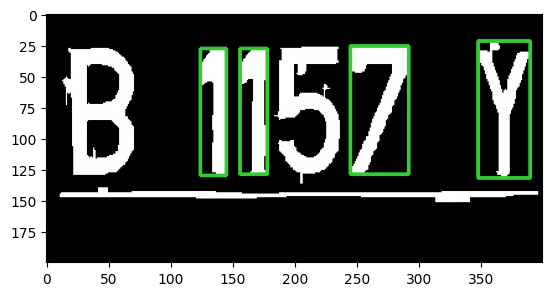

63


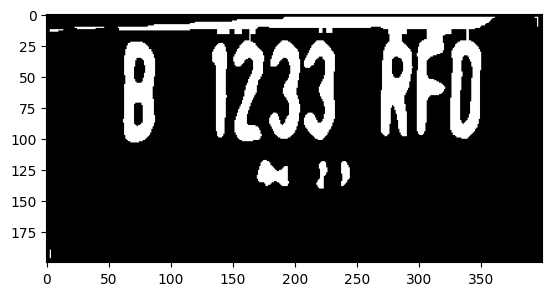

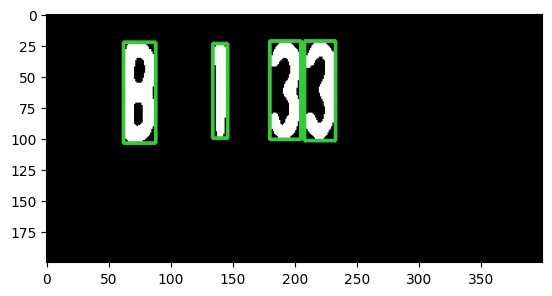

64


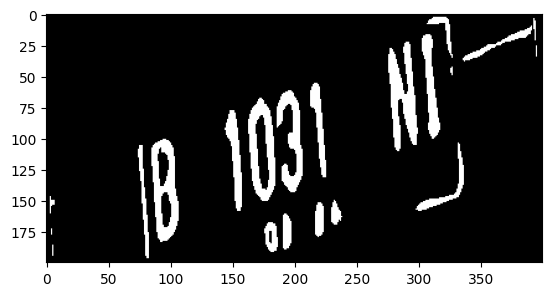

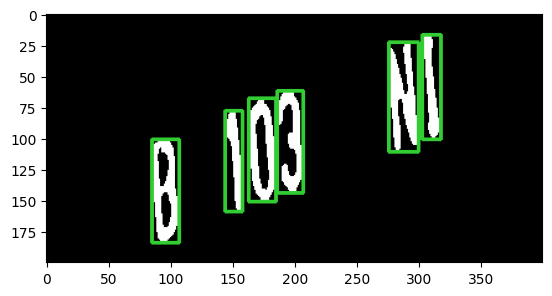

65


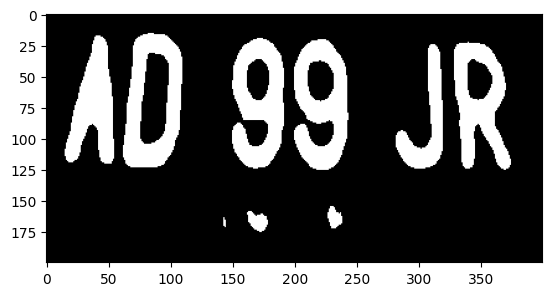

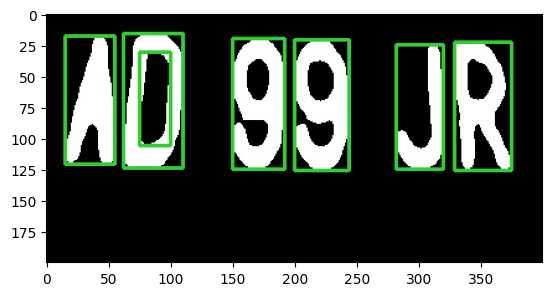

66


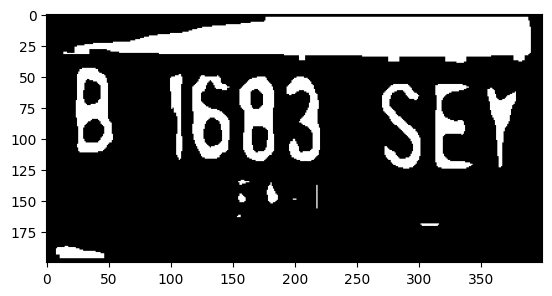

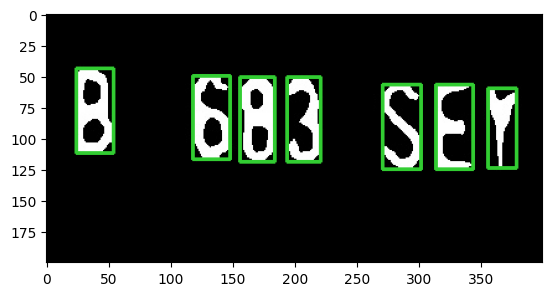

67


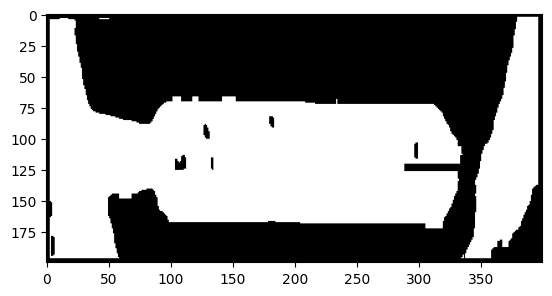

68


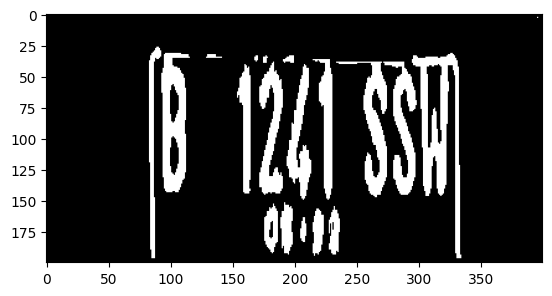

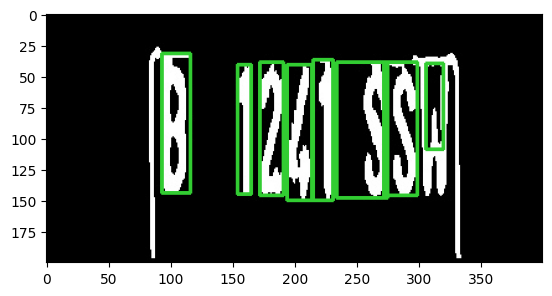

69


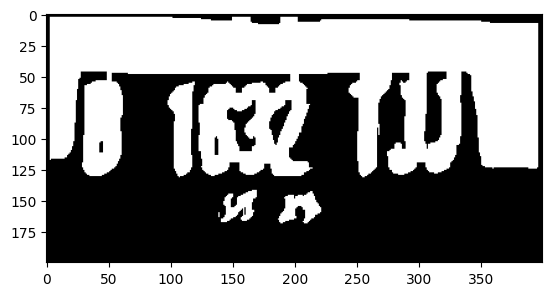

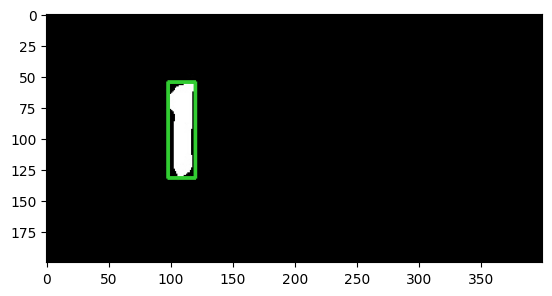

70


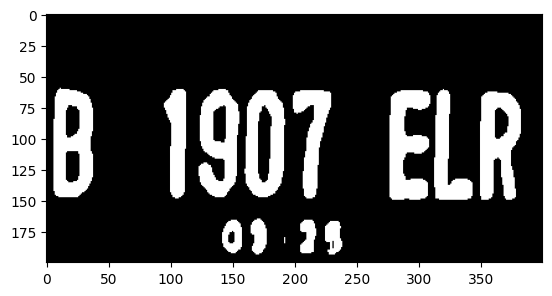

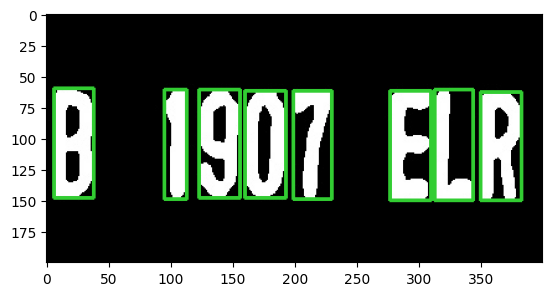

71


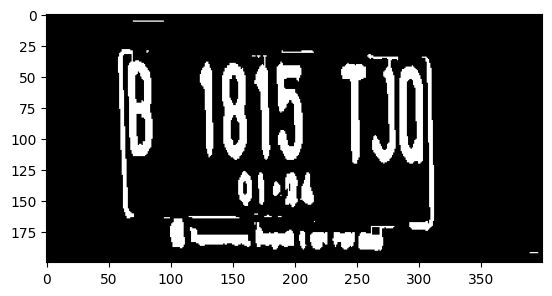

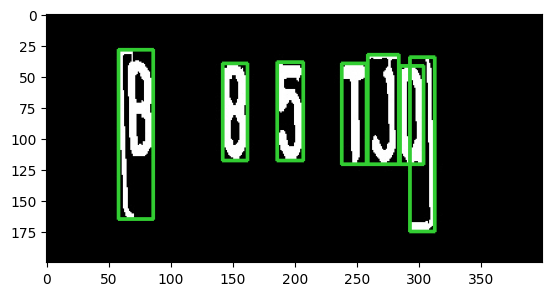

72


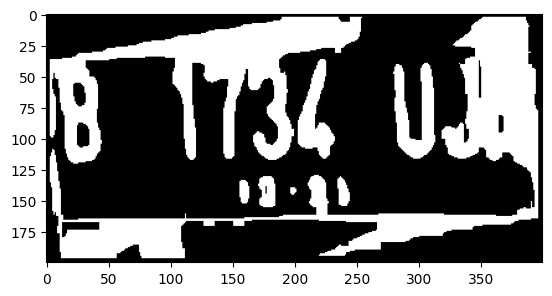

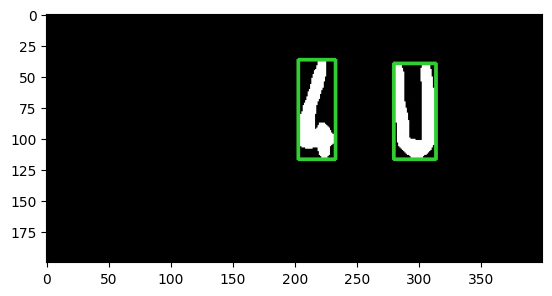

73


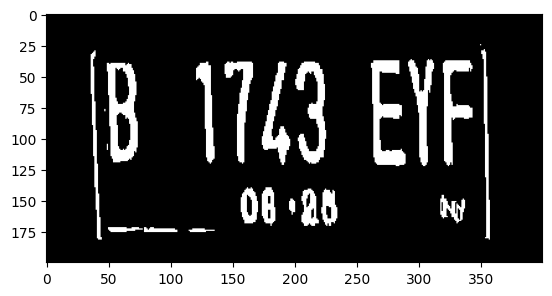

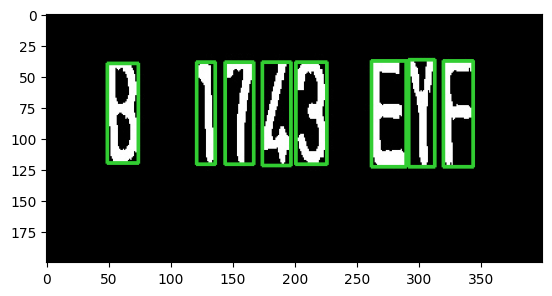

74


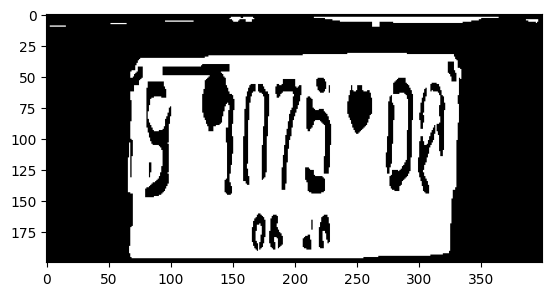

75


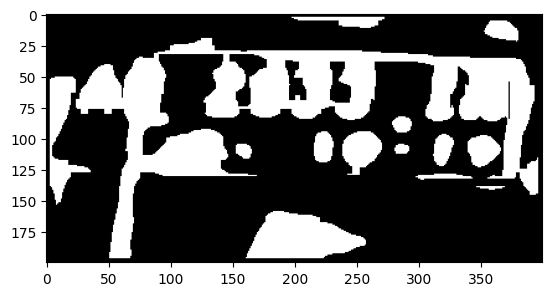

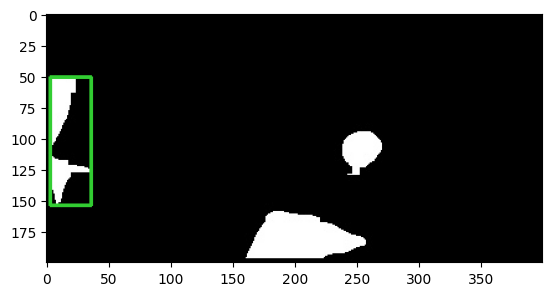

76


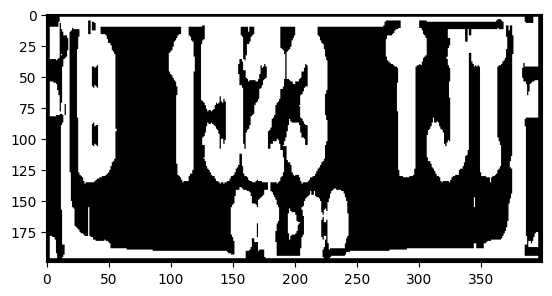

77


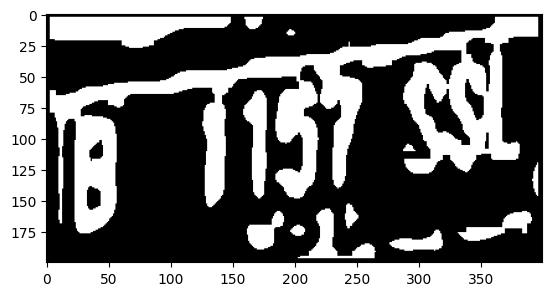

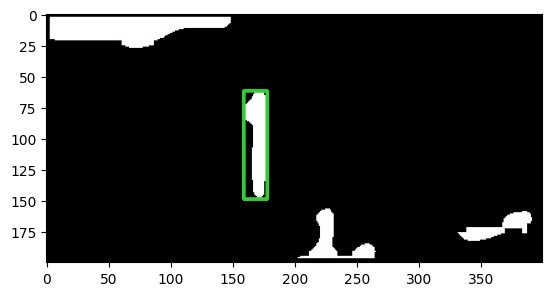

78


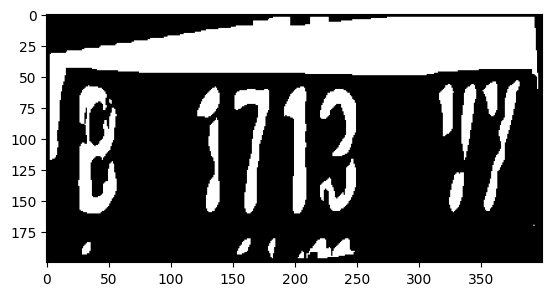

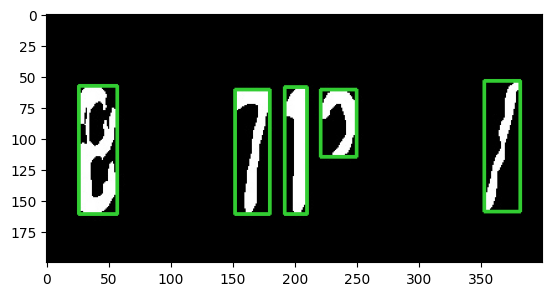

79


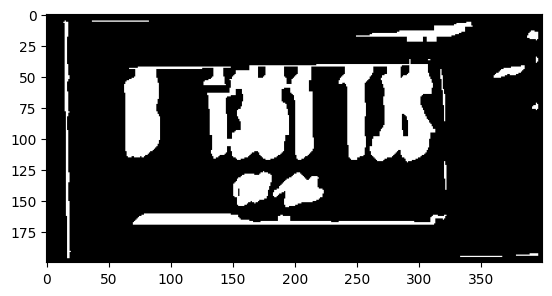

80


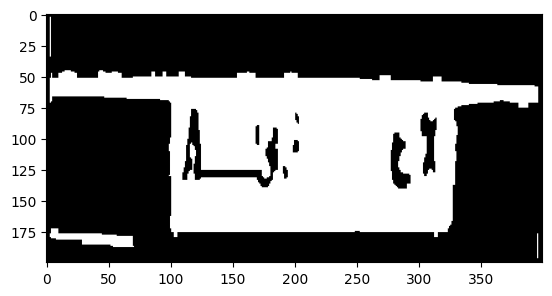

81


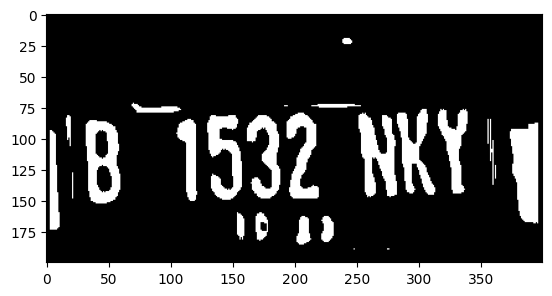

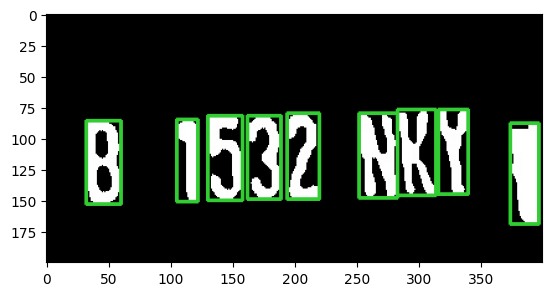

82


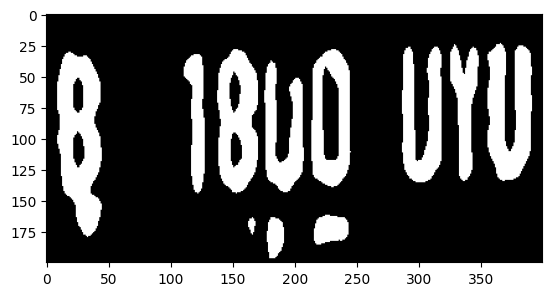

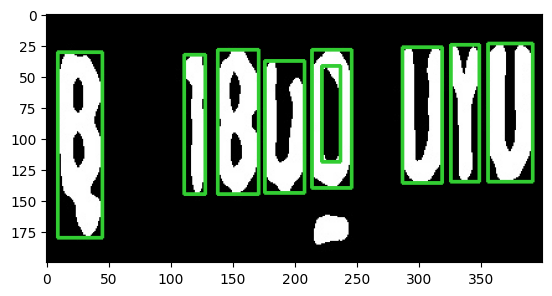

83


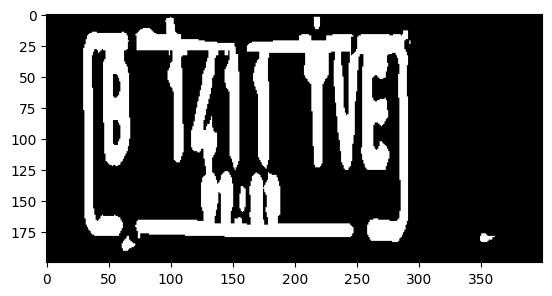

84


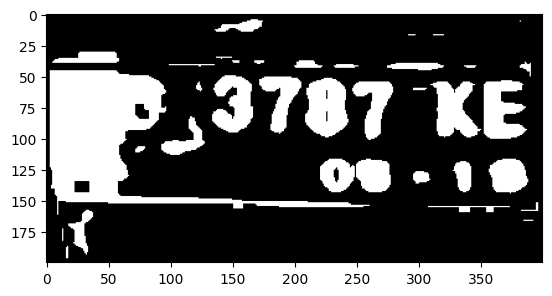

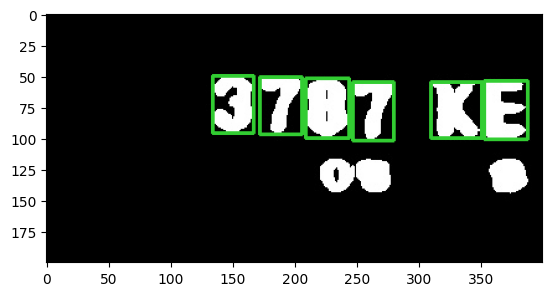

85


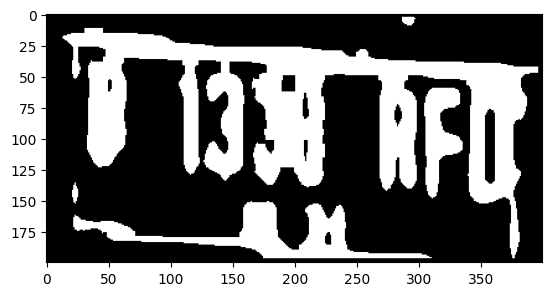

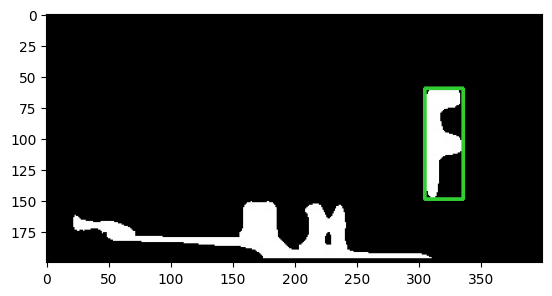

86


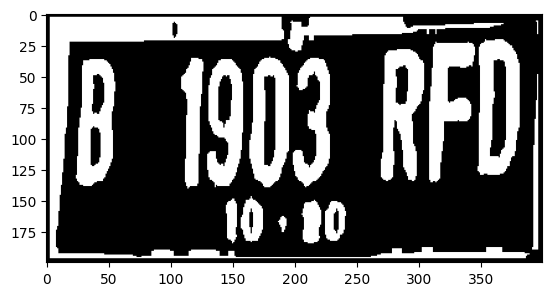

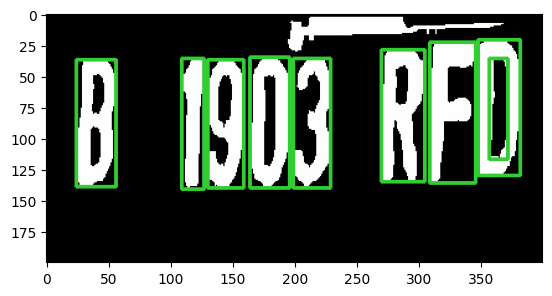

87


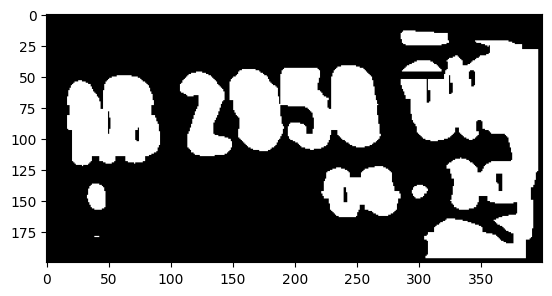

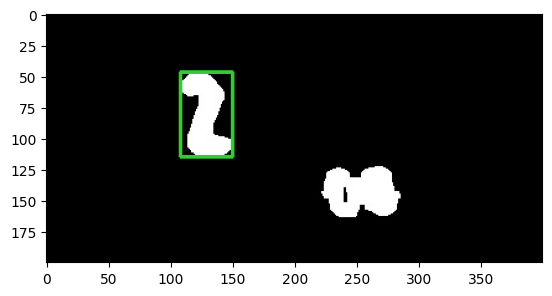

88


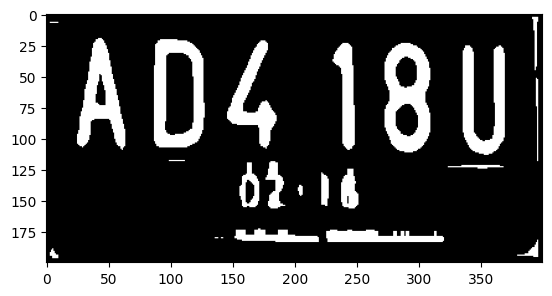

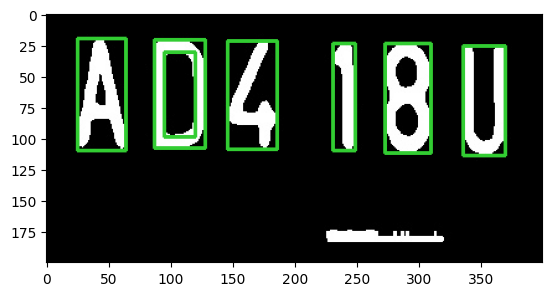

89


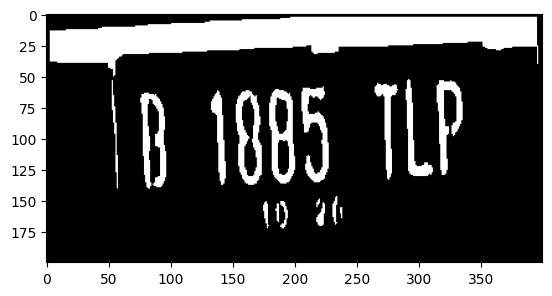

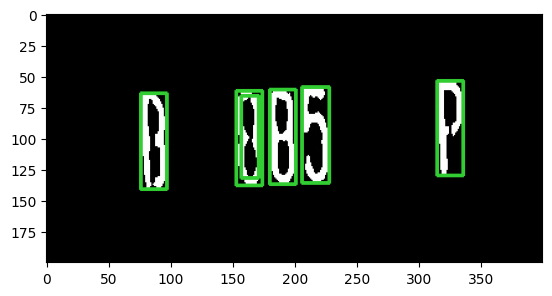

90


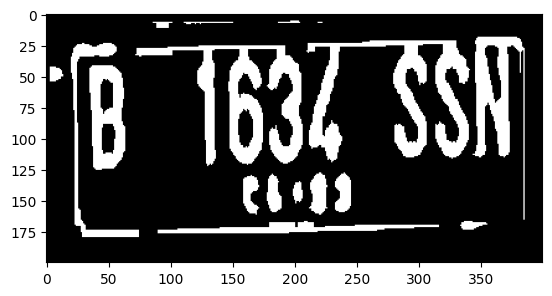

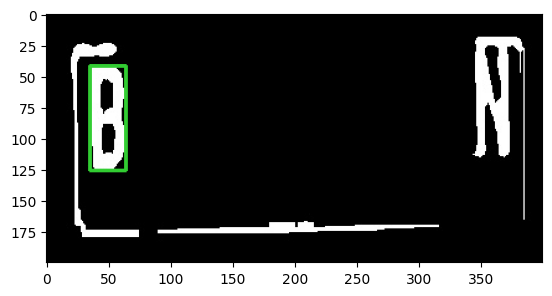

91


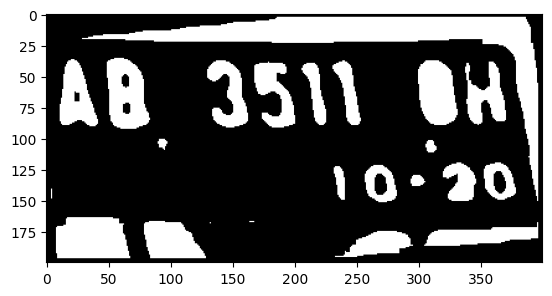

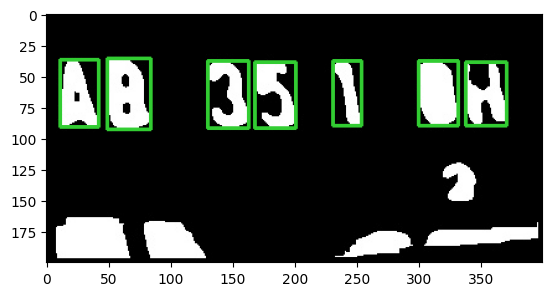

92


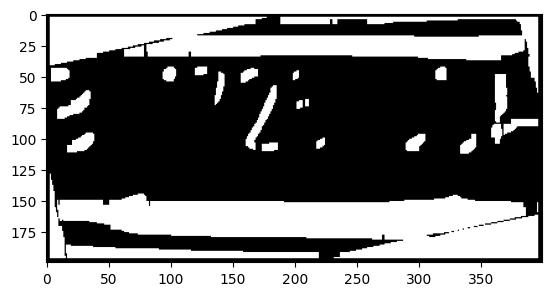

93


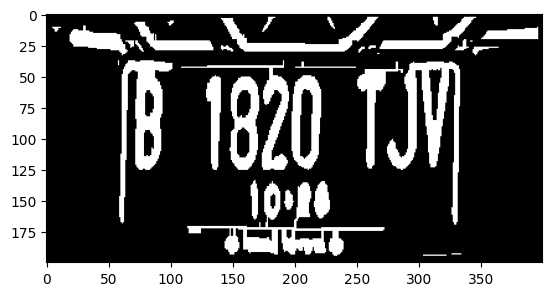

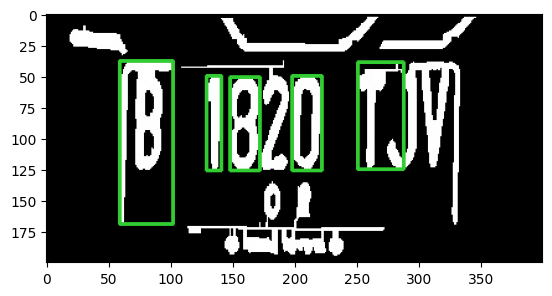

94


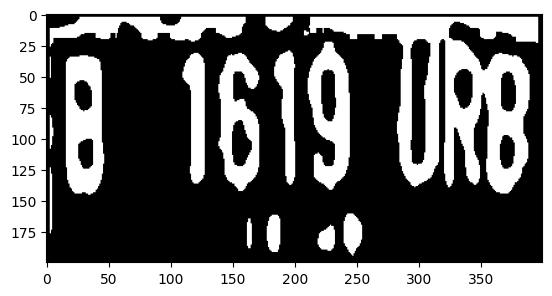

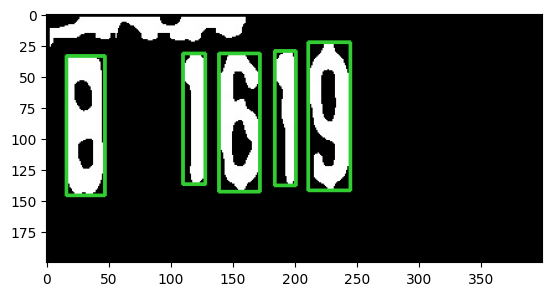

95


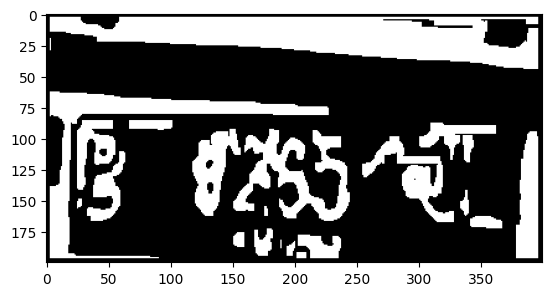

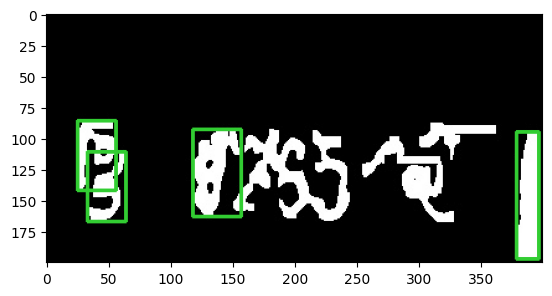

96


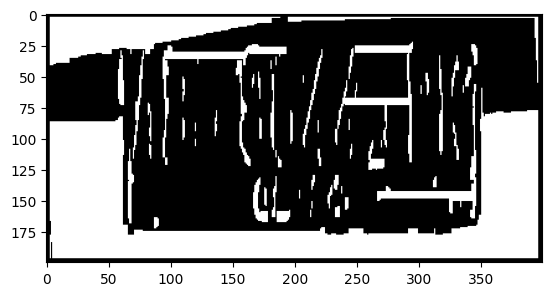

97


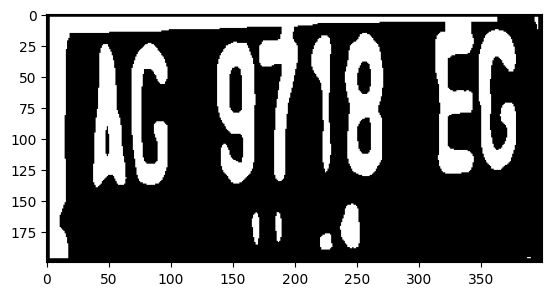

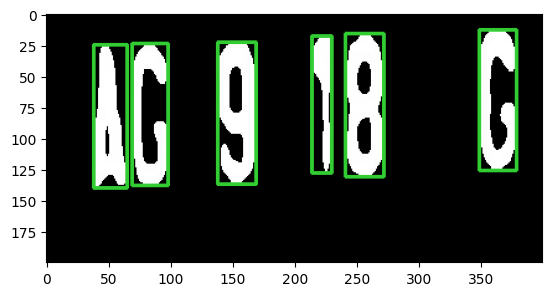

98


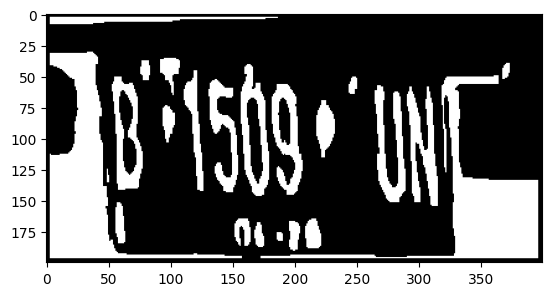

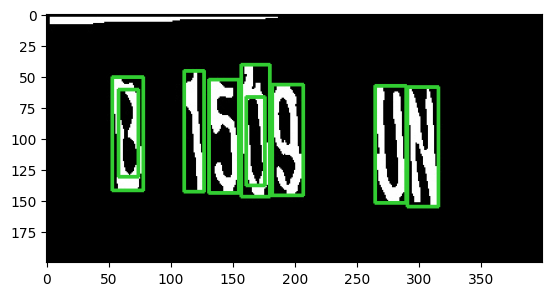

99


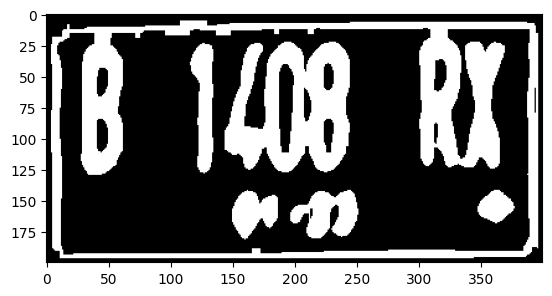

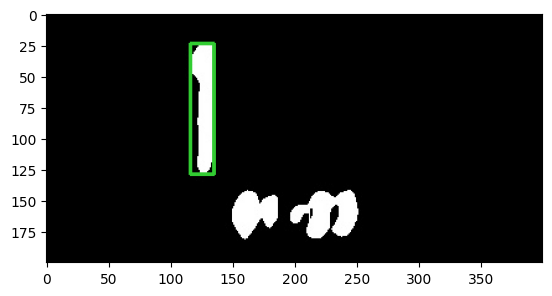

In [ ]:
for i in range(100):
  print(i)
  img_test = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Test for BDC 2023 - Penyisihan/'+data_test['Name of File'][i])
  char = characters_recognition(img_test)

In [ ]:
data_test['Prediction'] = None
for i in range(100):
  plate_number = ''
  img_test = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Test for BDC 2023 - Penyisihan/'+data_test['Name of File'][i])
  char = characters_recognition(img_test)
  for j,ch in enumerate(char):
    title = np.array2string(predict_from_model(ch,model,labels))
    plate_number+=title.strip("'[]")

  data_test.Prediction[i] = plate_number

1/1 [==============================] - 0s 25ms/step


In [ ]:
for i in range(100):
  plate_number = ''
  img_test = cv2.imread('/content/drive/MyDrive/Big Data Challenge/Data Test for BDC 2023 - Penyisihan/'+data_test['Name of File'][i])
  char = characters_recognition(img_test)
  for j,ch in enumerate(char):
    title = np.array2string(predict_from_model(ch,model,labels))
    plate_number+=title.strip("'[]")

  submission['Vehicleregistrationplatebymodel'][i] = plate_number

1/1 [==============================] - 0s 17ms/step


In [ ]:
submission.head(50)

,Name of File,Vehicleregistrationplatebymodel
0,DataTest1.png,AD7034OE
1,DataTest2.png,
2,DataTest3.png,B16B
3,DataTest4.png,B1BB1YKZ
4,DataTest5.png,M
5,DataTest6.png,Y1J
6,DataTest7.png,1B1UU64FR
7,DataTest8.png,B11TJW
8,DataTest9.png,D1D
9,DataTest10.png,41BTN


In [ ]:
submission.tail(50)

,Name of File,Vehicleregistrationplatebymodel
50,DataTest51.png,B178BUJT
51,DataTest52.png,B59RS
52,DataTest53.png,B18N
53,DataTest54.png,B713
54,DataTest55.png,
55,DataTest56.png,B1BB1YKZ
56,DataTest57.png,
57,DataTest58.png,
58,DataTest59.png,
59,DataTest60.png,B1422BK


In [ ]:
submission.to_csv('/content/drive/MyDrive/Big Data Challenge/submission.csv')